In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import glob, os
from os import getcwd
import cv2
from cv2 import ximgproc_segmentation_SelectiveSearchSegmentation
import tensorflow as tf

### Make sure to have the correct data path, here we have a subset of the data because this model is incredibly taxing to train. Most likely your kernel will crash if you don't have a very powerfull system. my RTX3080 ran out of memory and also my system

In [2]:
train_path = getcwd()

train_path = os.path.join(train_path,"subset_data")

images_list = os.listdir(train_path)

print(images_list)

['armas (1).jpg', 'armas (10).jpg', 'armas (100).jpg', 'armas (1000).jpg', 'armas (1001).jpg', 'armas (1002).jpg', 'armas (1003).jpg', 'armas (1004).jpg', 'armas (1005).jpg', 'armas (1006).jpg', 'armas (1007).jpg', 'armas (1008).jpg', 'armas (1009).jpg', 'armas (101).jpg', 'armas (1010).jpg', 'armas (1011).jpg', 'armas (1012).jpg', 'armas (1013).jpg', 'armas (1014).jpg', 'armas (1015).jpg', 'armas (1016).jpg', 'armas (1017).jpg', 'armas (1018).jpg', 'armas (1019).jpg', 'armas (102).jpg', 'armas (1020).jpg', 'armas (1021).jpg', 'armas (1022).jpg', 'armas (1023).jpg', 'armas (1024).jpg', 'armas (1025).jpg', 'armas (1026).jpg', 'armas (1027).jpg', 'armas (1028).jpg', 'armas (1029).jpg', 'armas (103).jpg', 'armas (1030).jpg', 'armas (1031).jpg', 'armas (1032).jpg', 'armas (1033).jpg', 'armas (1034).jpg', 'armas (1035).jpg', 'armas (1036).jpg', 'armas (1037).jpg', 'armas (1038).jpg', 'armas (1039).jpg', 'armas (104).jpg', 'armas (1040).jpg', 'armas (1041).jpg', 'armas (1042).jpg', 'armas (1

In [3]:
def helper(xml_element):
    a = xml_element.split('(')
    a = a[1].split(').xml')
    return a[0]
    

### The following script turns XML into CSV

# Note: if the naming convention for your data is not the same as ours the script below needs to be adjusted. it's easier to just rename your files with a script so that it matches our naming convention.

### The convention is: file_name (num).extension.

**Make sure to change the extension to your file's extension at the bottom of the script where we are using jpg unless your files are jpgs.

**Also numbers start from 1 and in ascending order

In [4]:

import xml.etree.ElementTree as Xet
import pandas as pd

xml_path = getcwd()
xml_path = os.path.join(xml_path, "annotations", "xmls")

xml_list = os.listdir(xml_path)

sorted_list = [] #result list
#get the numbers from the file name only
for i in xml_list:
    sorted_list.append(helper(i))
    
#convert to integer    
sorted_list = [int(i) for i in sorted_list]
#sort as integer
sorted_list.sort()

#get original names:

for i in range(len(sorted_list)):
    xml_list[i] = 'armas ('+str(i+1)+')'+'.xml'

cols = ["filename","xmin","xmax","ymin","ymax"]
rows = []
for curr_file in xml_list:
    xmlparse = Xet.parse(os.path.join(xml_path,curr_file))
    root = xmlparse.getroot()
#loop throuight each xml and then do that
    
    filename = ""
    files_list =  root.findall("filename")
    filename = files_list[0].text
    
    for i in root.iter('bndbox'):
        #Parse the bndbox for the values that we want
        xmin = i.find("xmin").text
        xmax = i.find("xmax").text
        ymin = i.find("ymin").text
        ymax = i.find("ymax").text
        rows.append({"filename": filename+'.jpg',
                     "xmin": xmin,
                     "xmax": xmax,
                     "ymin": ymin,
                     "ymax": ymax})


df = pd.DataFrame(rows, columns=cols)
  
# Writing dataframe to csv
df.to_csv('output.csv')


# Compute the intersection over union (IOU)

# Code adapted from [HERE](https://pyimagesearch.com/2016/11/07/intersection-over-union-iou-for-object-detection/)



In [2]:
def get_iou(bb1, bb2):
    assert bb1['x1'] < bb1['x2']
    assert bb1['y1'] < bb1['y2']
    assert bb2['x1'] < bb2['x2']
    assert bb2['y1'] < bb2['y2']

    x_left = max(bb1['x1'], bb2['x1'])
    y_top = max(bb1['y1'], bb2['y1'])
    x_right = min(bb1['x2'], bb2['x2'])
    y_bottom = min(bb1['y2'], bb2['y2'])

    if x_right < x_left or y_bottom < y_top:
        return 0.0

    intersection_area = (x_right - x_left) * (y_bottom - y_top)
    bb1_area = (bb1['x2'] - bb1['x1']) * (bb1['y2'] - bb1['y1'])
    bb2_area = (bb2['x2'] - bb2['x1']) * (bb2['y2'] - bb2['y1'])

    iou = intersection_area / float(bb1_area + bb2_area - intersection_area)
    assert iou >= 0.0
    assert iou <= 1.0
    return iou

In [6]:
#speed up cv2
cv2.setUseOptimized(True)
cv2.setNumThreads(5) #change depending on your computer
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

train_images = []
train_labels = []
from tqdm import tqdm

In [7]:
one_img = cv2.imread(os.path.join(train_path,images_list[10]))
one_img.shape

#shaoe is height, width, and then channels
imgHeight = one_img.shape[0]
imgWidth = one_img.shape[1]
scale_factor = 0.3

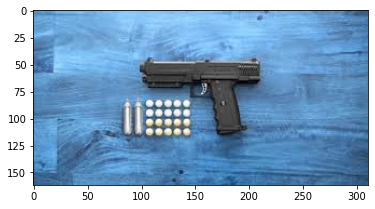

In [8]:
plt.imshow(one_img)# image looks blue because opencv uses BGR instead of RGB

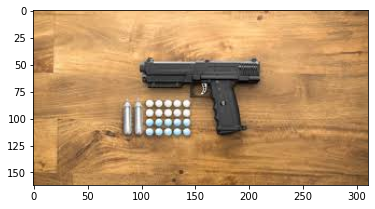

In [9]:
one_img = cv2.cvtColor(one_img, cv2.COLOR_BGR2RGB)
plt.imshow(one_img)

In [10]:
print(train_path)

C:\Users\bryan\Desktop\ML-FINAL\data\data with anno\Sohas_weapon-Detection\subset_data


### This will load the data by calculating the IOU of the proposed regions returned by the "Selective Image Search" algorithm and if the IOU is greater than 70% it will be loaded as part of the positive class to train our model. Otherwise it will be part of the negative class

### Note: This is extremely slow. With 4,000 images it took us 8 hours, 54 minutes, 39 seconds

In [11]:

csv_df = pd.read_csv("output.csv")

print(csv_df)
for index,row in tqdm(csv_df.iterrows()):
    try:
        filename = row['filename']
        img = cv2.imread(os.path.join(train_path,row["filename"]))
        print("working on file: ", filename)
        gtvalues = []
        x1 = int(row['xmin'])
        x2 = int(row['xmax'])
        y1 = int(row['ymin'])
        y2 = int(row['ymax'])

        gtvalues.append({"x1":x1,"x2":x2,"y1":y1,"y2":y2}) #ger x,y position and wtih/height for the corresponding image

       #this image resize crops the imae to 60% of the orginal dimensionsa
#         new_height = int(imgHeight * scale_factor)
#         new_width = int(imgWidth * scale_factor)
#         dimensions = (new_width, new_height)
#         resizedImg = cv2.resize(img, dimensions, interpolation = cv2.INTER_AREA)

        ss.setBaseImage(img)
        ss.switchToSelectiveSearchFast()

        ssresults = ss.process()
        imout = img.copy()

        counter = 0
        falsecounter = 0
        flag = 0
        fflag = 0
        bflag = 0
        
        for e,result in enumerate(ssresults):
                if e < 2000 and flag == 0:
                    for gtval in gtvalues:
                        x,y,w,h = result
                        iou = get_iou(gtval,{"x1":x,"x2":x+w,"y1":y,"y2":y+h})
                        if counter < 30:
                            if iou > 0.70:
                                timage = imout[y:y+h,x:x+w]
                                resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
                                train_images.append(resized)
                                train_labels.append(1)#gun
                                counter += 1
                        else :
                            fflag =1
                        if falsecounter <30:
                            if iou < 0.3:
                                timage = imout[y:y+h,x:x+w]
                                resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
                                train_images.append(resized)
                                train_labels.append(0)
                                falsecounter += 1
                        else :
                            bflag = 1
                    if fflag == 1 and bflag == 1:
                        print("inside")
                        flag = 1
    except Exception as e:
        print("error in "+filename)
        continue
    ss.clear()

      Unnamed: 0          filename  xmin  xmax  ymin  ymax
0              0     armas (1).jpg     3   128     1   100
1              1     armas (1).jpg   123   238    47   145
2              2     armas (2).jpg    21   146    78   163
3              3     armas (2).jpg    84   221    31   111
4              4     armas (3).jpg   471   613   207   359
...          ...               ...   ...   ...   ...   ...
3459        3459  armas (2999).jpg     1   683    15   399
3460        3460  armas (3000).jpg   161   187    82   120
3461        3461  armas (3000).jpg    24    48   101   129
3462        3462  armas (3000).jpg    71    84    98   124
3463        3463  armas (3000).jpg   306   349    22    67

[3464 rows x 6 columns]


0it [00:00, ?it/s]

working on file:  armas (1).jpg


2it [00:00,  4.99it/s]

working on file:  armas (1).jpg
working on file:  armas (2).jpg


3it [00:00,  4.47it/s]

working on file:  armas (2).jpg


4it [00:00,  4.17it/s]

working on file:  armas (3).jpg


5it [00:10,  3.63s/it]

working on file:  armas (4).jpg


6it [00:12,  3.04s/it]

working on file:  armas (5).jpg


7it [00:19,  4.40s/it]

working on file:  armas (5).jpg


8it [00:26,  5.26s/it]

working on file:  armas (6).jpg


9it [00:37,  6.97s/it]

working on file:  armas (7).jpg


10it [00:57, 11.05s/it]

working on file:  armas (8).jpg


11it [01:11, 11.76s/it]

working on file:  armas (9).jpg


12it [01:26, 12.91s/it]

working on file:  armas (10).jpg


13it [01:40, 13.34s/it]

working on file:  armas (11).jpg


14it [01:54, 13.36s/it]

working on file:  armas (11).jpg


15it [02:08, 13.52s/it]

working on file:  armas (12).jpg


16it [02:09,  9.74s/it]

working on file:  armas (13).jpg


17it [02:14,  8.37s/it]

working on file:  armas (14).jpg
working on file:  armas (15).jpg


19it [02:24,  6.90s/it]

working on file:  armas (16).jpg


20it [02:25,  5.37s/it]

working on file:  armas (17).jpg


21it [02:33,  6.12s/it]

working on file:  armas (18).jpg


22it [02:34,  4.65s/it]

working on file:  armas (19).jpg


23it [02:35,  3.75s/it]

working on file:  armas (20).jpg


24it [02:48,  6.38s/it]

working on file:  armas (21).jpg


26it [02:49,  3.36s/it]

working on file:  armas (22).jpg
working on file:  armas (23).jpg


27it [02:58,  4.87s/it]

working on file:  armas (24).jpg


28it [02:59,  3.99s/it]

working on file:  armas (25).jpg


29it [03:01,  3.16s/it]

working on file:  armas (26).jpg


30it [03:02,  2.55s/it]

working on file:  armas (27).jpg


31it [03:11,  4.58s/it]

working on file:  armas (27).jpg


32it [03:20,  5.84s/it]

working on file:  armas (28).jpg


33it [03:29,  6.72s/it]

working on file:  armas (29).jpg


34it [03:44,  9.27s/it]

working on file:  armas (30).jpg


35it [03:59, 10.99s/it]

working on file:  armas (31).jpg


36it [04:18, 13.49s/it]

working on file:  armas (32).jpg


37it [04:27, 11.98s/it]

working on file:  armas (33).jpg


38it [04:39, 12.05s/it]

working on file:  armas (34).jpg


39it [04:59, 14.50s/it]

working on file:  armas (35).jpg


40it [05:18, 15.87s/it]

working on file:  armas (36).jpg


41it [05:19, 11.40s/it]

working on file:  armas (37).jpg


43it [05:20,  5.79s/it]

working on file:  armas (38).jpg
working on file:  armas (38).jpg


45it [05:20,  2.90s/it]

working on file:  armas (39).jpg
working on file:  armas (40).jpg
working on file:  armas (41).jpg


47it [05:41,  6.36s/it]

working on file:  armas (42).jpg


49it [05:43,  3.85s/it]

working on file:  armas (43).jpg
working on file:  armas (44).jpg


50it [05:57,  6.54s/it]

working on file:  armas (45).jpg


51it [06:07,  7.63s/it]

working on file:  armas (46).jpg


52it [06:08,  5.66s/it]

working on file:  armas (47).jpg


53it [06:15,  6.28s/it]

working on file:  armas (48).jpg


54it [06:16,  4.64s/it]

working on file:  armas (49).jpg


55it [06:25,  5.93s/it]

working on file:  armas (50).jpg


56it [06:26,  4.40s/it]

working on file:  armas (51).jpg


57it [06:34,  5.61s/it]

working on file:  armas (52).jpg


58it [06:35,  4.15s/it]

working on file:  armas (52).jpg


59it [06:36,  3.12s/it]

working on file:  armas (53).jpg
working on file:  armas (54).jpg


61it [06:44,  3.64s/it]

working on file:  armas (55).jpg


62it [06:46,  3.12s/it]

working on file:  armas (56).jpg


63it [09:55, 51.74s/it]

working on file:  armas (56).jpg


64it [13:04, 88.89s/it]

working on file:  armas (56).jpg


65it [16:13, 116.95s/it]

working on file:  armas (56).jpg


66it [19:21, 137.27s/it]

working on file:  armas (56).jpg


67it [22:29, 151.92s/it]

working on file:  armas (57).jpg


68it [22:31, 107.96s/it]

working on file:  armas (58).jpg


69it [22:42, 79.52s/it] 

working on file:  armas (59).jpg


70it [22:42, 56.02s/it]

working on file:  armas (60).jpg


71it [22:44, 39.82s/it]

working on file:  armas (61).jpg


72it [22:55, 31.17s/it]

working on file:  armas (62).jpg


73it [23:10, 26.39s/it]

working on file:  armas (62).jpg


74it [23:25, 23.11s/it]

working on file:  armas (62).jpg


75it [23:41, 20.80s/it]

working on file:  armas (62).jpg


76it [23:56, 19.17s/it]

working on file:  armas (63).jpg


77it [24:04, 15.98s/it]

working on file:  armas (64).jpg


78it [24:16, 14.58s/it]

working on file:  armas (65).jpg


79it [24:26, 13.32s/it]

working on file:  armas (66).jpg


80it [24:26,  9.41s/it]

working on file:  armas (67).jpg


83it [24:27,  3.71s/it]

working on file:  armas (68).jpg
working on file:  armas (69).jpg
working on file:  armas (70).jpg


84it [24:27,  2.82s/it]

working on file:  armas (71).jpg


86it [24:30,  2.00s/it]

inside
working on file:  armas (72).jpg
working on file:  armas (73).jpg


87it [24:51,  7.26s/it]

working on file:  armas (74).jpg


88it [24:53,  5.70s/it]

working on file:  armas (75).jpg


89it [24:59,  5.92s/it]

working on file:  armas (76).jpg


90it [25:01,  4.71s/it]

working on file:  armas (77).jpg


91it [25:20,  8.86s/it]

working on file:  armas (78).jpg


94it [25:20,  3.22s/it]

working on file:  armas (79).jpg
working on file:  armas (80).jpg


95it [25:21,  2.29s/it]

working on file:  armas (81).jpg
working on file:  armas (82).jpg


97it [25:31,  3.34s/it]

working on file:  armas (83).jpg
working on file:  armas (84).jpg


98it [25:32,  2.55s/it]

working on file:  armas (84).jpg


99it [25:32,  2.00s/it]

working on file:  armas (85).jpg


100it [25:42,  4.38s/it]

working on file:  armas (86).jpg


101it [25:43,  3.24s/it]

working on file:  armas (87).jpg


103it [26:00,  5.11s/it]

working on file:  armas (88).jpg
working on file:  armas (89).jpg


104it [26:00,  3.61s/it]

working on file:  armas (90).jpg


106it [26:00,  1.86s/it]

working on file:  armas (91).jpg
working on file:  armas (92).jpg


107it [26:00,  1.33s/it]

working on file:  armas (93).jpg


108it [26:12,  4.49s/it]

working on file:  armas (93).jpg


109it [26:24,  6.66s/it]

working on file:  armas (93).jpg


110it [26:36,  8.20s/it]

working on file:  armas (94).jpg


111it [26:42,  7.67s/it]

working on file:  armas (95).jpg


112it [26:54,  8.80s/it]

working on file:  armas (96).jpg


113it [26:55,  6.45s/it]

working on file:  armas (97).jpg


115it [26:55,  3.32s/it]

working on file:  armas (98).jpg
working on file:  armas (99).jpg


116it [27:53, 19.67s/it]

working on file:  armas (100).jpg


117it [27:54, 13.97s/it]

working on file:  armas (101).jpg


118it [28:13, 15.66s/it]

working on file:  armas (102).jpg


119it [28:22, 13.63s/it]

working on file:  armas (103).jpg


120it [28:23,  9.75s/it]

working on file:  armas (104).jpg


121it [28:24,  7.03s/it]

working on file:  armas (105).jpg


122it [28:46, 11.61s/it]

working on file:  armas (106).jpg


124it [29:02,  9.03s/it]

working on file:  armas (107).jpg
working on file:  armas (108).jpg


125it [29:19, 11.36s/it]

working on file:  armas (109).jpg


126it [29:25,  9.86s/it]

working on file:  armas (110).jpg


127it [29:34,  9.52s/it]

working on file:  armas (111).jpg


128it [29:34,  6.80s/it]

working on file:  armas (112).jpg


129it [29:40,  6.58s/it]

working on file:  armas (113).jpg


131it [29:54,  6.06s/it]

working on file:  armas (114).jpg
working on file:  armas (115).jpg


132it [30:00,  6.21s/it]

working on file:  armas (116).jpg


134it [30:10,  5.11s/it]

working on file:  armas (117).jpg
working on file:  armas (118).jpg


135it [30:18,  6.12s/it]

working on file:  armas (119).jpg


136it [30:30,  7.73s/it]

working on file:  armas (120).jpg


137it [30:31,  5.62s/it]

working on file:  armas (121).jpg


138it [30:33,  4.53s/it]

working on file:  armas (122).jpg


139it [30:48,  7.71s/it]

working on file:  armas (123).jpg


140it [31:06, 10.83s/it]

working on file:  armas (123).jpg


141it [31:24, 13.06s/it]

working on file:  armas (124).jpg


142it [32:03, 20.93s/it]

working on file:  armas (125).jpg


143it [32:21, 19.92s/it]

working on file:  armas (126).jpg


144it [32:22, 14.23s/it]

working on file:  armas (127).jpg


145it [32:23, 10.19s/it]

working on file:  armas (128).jpg


146it [32:24,  7.66s/it]

working on file:  armas (129).jpg


147it [32:25,  5.56s/it]

working on file:  armas (129).jpg


148it [32:26,  4.09s/it]

working on file:  armas (130).jpg


149it [32:26,  3.09s/it]

working on file:  armas (131).jpg


150it [32:53, 10.18s/it]

working on file:  armas (132).jpg


151it [33:05, 10.69s/it]

working on file:  armas (133).jpg


152it [33:16, 10.87s/it]

working on file:  armas (134).jpg


153it [33:34, 12.75s/it]

working on file:  armas (135).jpg


154it [33:34,  9.11s/it]

working on file:  armas (136).jpg


156it [33:35,  4.66s/it]

inside
working on file:  armas (137).jpg
working on file:  armas (138).jpg


157it [33:35,  3.32s/it]

working on file:  armas (139).jpg


158it [33:56,  8.44s/it]

working on file:  armas (140).jpg


159it [33:56,  6.17s/it]

working on file:  armas (141).jpg


160it [33:57,  4.55s/it]

working on file:  armas (142).jpg


161it [34:07,  6.21s/it]

working on file:  armas (143).jpg


162it [34:18,  7.63s/it]

working on file:  armas (144).jpg


163it [34:29,  8.63s/it]

working on file:  armas (145).jpg


164it [34:30,  6.25s/it]

working on file:  armas (146).jpg


166it [34:35,  4.08s/it]

working on file:  armas (147).jpg
working on file:  armas (148).jpg


167it [34:46,  6.20s/it]

working on file:  armas (149).jpg


168it [34:57,  7.67s/it]

working on file:  armas (150).jpg


169it [34:58,  5.60s/it]

working on file:  armas (151).jpg


170it [34:58,  4.12s/it]

working on file:  armas (152).jpg


171it [34:59,  3.08s/it]

working on file:  armas (153).jpg


172it [35:00,  2.44s/it]

working on file:  armas (154).jpg


173it [35:01,  1.93s/it]

working on file:  armas (155).jpg


174it [35:01,  1.54s/it]

working on file:  armas (156).jpg


175it [35:02,  1.26s/it]

working on file:  armas (157).jpg


176it [35:02,  1.04s/it]

working on file:  armas (158).jpg


177it [35:03,  1.10it/s]

working on file:  armas (159).jpg


178it [35:04,  1.16it/s]

working on file:  armas (160).jpg


179it [35:12,  3.21s/it]

working on file:  armas (161).jpg


180it [35:13,  2.44s/it]

working on file:  armas (162).jpg


181it [35:14,  1.86s/it]

working on file:  armas (163).jpg


182it [35:25,  4.74s/it]

working on file:  armas (164).jpg


183it [35:58, 13.13s/it]

working on file:  armas (165).jpg


184it [35:59,  9.69s/it]

working on file:  armas (166).jpg


185it [36:00,  6.98s/it]

working on file:  armas (167).jpg


186it [36:02,  5.40s/it]

working on file:  armas (168).jpg


187it [36:03,  4.12s/it]

working on file:  armas (169).jpg


188it [38:26, 45.67s/it]

working on file:  armas (169).jpg


189it [40:49, 74.84s/it]

working on file:  armas (169).jpg


190it [43:11, 95.12s/it]

working on file:  armas (170).jpg


191it [43:12, 66.77s/it]

working on file:  armas (170).jpg


192it [43:12, 46.92s/it]

working on file:  armas (170).jpg


193it [43:13, 33.03s/it]

working on file:  armas (170).jpg


194it [43:13, 23.30s/it]

working on file:  armas (170).jpg


195it [43:14, 16.51s/it]

working on file:  armas (171).jpg


196it [43:16, 12.24s/it]

working on file:  armas (172).jpg


197it [43:17,  8.70s/it]

working on file:  armas (173).jpg


198it [43:17,  6.29s/it]

working on file:  armas (174).jpg


199it [43:20,  5.03s/it]

working on file:  armas (175).jpg


200it [43:21,  4.00s/it]

working on file:  armas (176).jpg


201it [43:29,  5.30s/it]

working on file:  armas (177).jpg


202it [43:31,  4.11s/it]

working on file:  armas (178).jpg


203it [43:32,  3.12s/it]

working on file:  armas (179).jpg


204it [43:36,  3.47s/it]

working on file:  armas (180).jpg


205it [43:41,  3.86s/it]

working on file:  armas (181).jpg


206it [43:44,  3.64s/it]

working on file:  armas (181).jpg


207it [43:47,  3.48s/it]

working on file:  armas (181).jpg


208it [43:50,  3.38s/it]

working on file:  armas (181).jpg


209it [43:53,  3.29s/it]

working on file:  armas (181).jpg


210it [43:56,  3.24s/it]

working on file:  armas (181).jpg


211it [43:59,  3.20s/it]

working on file:  armas (181).jpg


212it [44:02,  3.17s/it]

working on file:  armas (181).jpg


213it [44:06,  3.16s/it]

working on file:  armas (181).jpg


214it [44:09,  3.14s/it]

working on file:  armas (181).jpg


215it [44:12,  3.14s/it]

working on file:  armas (181).jpg


216it [44:15,  3.12s/it]

working on file:  armas (182).jpg


217it [44:16,  2.42s/it]

working on file:  armas (183).jpg


218it [44:22,  3.45s/it]

working on file:  armas (184).jpg


219it [44:25,  3.58s/it]

working on file:  armas (185).jpg


220it [44:28,  3.31s/it]

working on file:  armas (186).jpg


221it [44:31,  3.25s/it]

working on file:  armas (187).jpg


222it [44:40,  4.96s/it]

working on file:  armas (188).jpg


223it [44:44,  4.57s/it]

working on file:  armas (189).jpg


224it [44:47,  4.16s/it]

working on file:  armas (190).jpg


225it [44:49,  3.37s/it]

working on file:  armas (191).jpg


226it [44:55,  4.36s/it]

working on file:  armas (192).jpg


227it [45:04,  5.76s/it]

working on file:  armas (193).jpg


228it [45:05,  4.14s/it]

working on file:  armas (194).jpg


229it [45:05,  2.97s/it]

working on file:  armas (195).jpg


230it [45:05,  2.14s/it]

working on file:  armas (196).jpg


231it [45:07,  2.14s/it]

working on file:  armas (197).jpg


232it [45:08,  1.80s/it]

working on file:  armas (198).jpg


233it [45:10,  1.76s/it]

working on file:  armas (199).jpg


234it [45:13,  2.22s/it]

working on file:  armas (200).jpg


235it [45:14,  1.87s/it]

working on file:  armas (201).jpg


236it [45:35,  7.49s/it]

working on file:  armas (202).jpg


237it [45:57, 11.93s/it]

working on file:  armas (203).jpg


238it [45:59,  8.83s/it]

working on file:  armas (204).jpg


239it [46:02,  7.12s/it]

working on file:  armas (204).jpg


240it [46:05,  5.92s/it]

working on file:  armas (205).jpg


241it [46:08,  4.94s/it]

working on file:  armas (206).jpg


242it [46:10,  4.24s/it]

working on file:  armas (207).jpg


243it [46:13,  3.84s/it]

working on file:  armas (208).jpg


244it [46:16,  3.56s/it]

working on file:  armas (209).jpg


245it [46:19,  3.27s/it]

inside
working on file:  armas (210).jpg


246it [46:21,  3.15s/it]

working on file:  armas (211).jpg


247it [46:24,  3.07s/it]

working on file:  armas (212).jpg


248it [46:27,  2.99s/it]

working on file:  armas (213).jpg


249it [46:30,  3.02s/it]

working on file:  armas (214).jpg


250it [46:33,  2.86s/it]

inside
working on file:  armas (215).jpg


251it [46:36,  2.84s/it]

working on file:  armas (216).jpg


252it [46:37,  2.39s/it]

working on file:  armas (217).jpg


253it [46:39,  2.25s/it]

working on file:  armas (218).jpg


254it [46:41,  2.32s/it]

working on file:  armas (218).jpg


255it [46:44,  2.38s/it]

working on file:  armas (218).jpg


256it [46:46,  2.43s/it]

working on file:  armas (218).jpg


257it [46:49,  2.47s/it]

working on file:  armas (219).jpg


258it [47:00,  4.96s/it]

working on file:  armas (220).jpg


259it [47:02,  4.05s/it]

working on file:  armas (221).jpg


260it [47:32, 11.96s/it]

working on file:  armas (222).jpg


261it [47:35,  9.14s/it]

working on file:  armas (222).jpg


262it [47:37,  7.17s/it]

working on file:  armas (222).jpg


263it [47:40,  5.79s/it]

working on file:  armas (222).jpg


264it [47:42,  4.82s/it]

working on file:  armas (222).jpg


265it [47:45,  4.15s/it]

working on file:  armas (223).jpg


266it [47:47,  3.47s/it]

working on file:  armas (223).jpg


267it [47:49,  2.99s/it]

working on file:  armas (223).jpg


268it [47:51,  2.66s/it]

working on file:  armas (223).jpg


269it [47:52,  2.42s/it]

working on file:  armas (223).jpg


270it [47:54,  2.25s/it]

working on file:  armas (223).jpg


271it [47:56,  2.12s/it]

working on file:  armas (223).jpg


272it [47:58,  2.05s/it]

working on file:  armas (224).jpg


273it [1:22:02, 614.59s/it]

working on file:  armas (225).jpg


274it [1:22:04, 430.75s/it]

working on file:  armas (226).jpg


275it [1:22:23, 307.24s/it]

working on file:  armas (227).jpg


276it [1:22:23, 215.16s/it]

working on file:  armas (227).jpg


277it [1:22:23, 150.70s/it]

working on file:  armas (227).jpg


278it [1:22:24, 105.59s/it]

working on file:  armas (227).jpg


279it [1:22:24, 74.00s/it] 

working on file:  armas (228).jpg


280it [1:22:26, 52.55s/it]

working on file:  armas (229).jpg


281it [1:23:00, 46.94s/it]

working on file:  armas (230).jpg


282it [1:23:15, 37.24s/it]

working on file:  armas (231).jpg


283it [1:23:16, 26.29s/it]

working on file:  armas (232).jpg


284it [1:23:17, 18.94s/it]

working on file:  armas (233).jpg


285it [1:23:46, 21.95s/it]

working on file:  armas (234).jpg


287it [1:27:33, 58.48s/it]

working on file:  armas (235).jpg
working on file:  armas (236).jpg


288it [1:28:38, 60.25s/it]

working on file:  armas (237).jpg


289it [1:30:15, 71.29s/it]

working on file:  armas (238).jpg


290it [1:30:30, 54.55s/it]

working on file:  armas (239).jpg


291it [1:30:32, 38.65s/it]

working on file:  armas (240).jpg


292it [1:30:48, 32.00s/it]

working on file:  armas (241).jpg


293it [1:30:51, 23.08s/it]

working on file:  armas (242).jpg


294it [1:30:54, 17.20s/it]

working on file:  armas (243).jpg


295it [1:30:57, 12.80s/it]

working on file:  armas (244).jpg


296it [1:30:58,  9.26s/it]

working on file:  armas (245).jpg


297it [1:30:58,  6.63s/it]

working on file:  armas (246).jpg


298it [1:31:24, 12.48s/it]

working on file:  armas (247).jpg


299it [1:31:25,  8.99s/it]

working on file:  armas (248).jpg


300it [1:31:27,  6.74s/it]

working on file:  armas (249).jpg


301it [1:31:28,  5.06s/it]

working on file:  armas (250).jpg


302it [1:31:28,  3.71s/it]

working on file:  armas (251).jpg


303it [1:31:31,  3.37s/it]

working on file:  armas (252).jpg


304it [1:31:33,  3.00s/it]

inside
working on file:  armas (253).jpg


305it [1:31:34,  2.50s/it]

working on file:  armas (254).jpg


306it [1:31:36,  2.24s/it]

working on file:  armas (255).jpg


307it [1:31:40,  2.83s/it]

working on file:  armas (256).jpg


308it [1:31:42,  2.60s/it]

working on file:  armas (257).jpg


309it [1:31:45,  2.55s/it]

working on file:  armas (258).jpg


310it [1:31:46,  2.28s/it]

working on file:  armas (259).jpg


311it [1:31:50,  2.63s/it]

working on file:  armas (260).jpg


312it [1:31:51,  2.29s/it]

working on file:  armas (260).jpg


313it [1:31:53,  2.05s/it]

working on file:  armas (260).jpg


314it [1:31:54,  1.90s/it]

working on file:  armas (261).jpg


315it [1:31:56,  1.82s/it]

working on file:  armas (262).jpg


316it [1:31:58,  1.76s/it]

working on file:  armas (263).jpg


317it [1:31:58,  1.47s/it]

working on file:  armas (264).jpg


318it [1:31:59,  1.27s/it]

working on file:  armas (265).jpg


319it [1:32:01,  1.55s/it]

working on file:  armas (266).jpg


320it [1:32:04,  1.91s/it]

working on file:  armas (267).jpg


321it [1:32:06,  1.91s/it]

working on file:  armas (268).jpg


322it [1:32:08,  1.87s/it]

working on file:  armas (269).jpg


323it [1:32:11,  2.20s/it]

working on file:  armas (270).jpg


324it [1:32:22,  4.88s/it]

working on file:  armas (271).jpg


325it [1:32:32,  6.48s/it]

working on file:  armas (272).jpg


326it [1:33:16, 17.81s/it]

working on file:  armas (273).jpg


327it [1:33:17, 12.74s/it]

working on file:  armas (274).jpg


328it [1:33:19,  9.44s/it]

working on file:  armas (275).jpg


329it [1:33:21,  7.08s/it]

working on file:  armas (276).jpg


330it [1:33:24,  5.96s/it]

working on file:  armas (277).jpg


331it [1:33:38,  8.24s/it]

working on file:  armas (278).jpg


332it [1:33:38,  6.04s/it]

working on file:  armas (279).jpg


333it [1:33:40,  4.67s/it]

working on file:  armas (279).jpg


334it [1:33:41,  3.71s/it]

working on file:  armas (280).jpg


335it [1:33:43,  2.96s/it]

working on file:  armas (281).jpg


336it [1:33:44,  2.61s/it]

working on file:  armas (282).jpg


337it [1:34:37, 17.75s/it]

working on file:  armas (283).jpg


338it [1:35:37, 30.22s/it]

working on file:  armas (284).jpg


339it [1:35:56, 26.78s/it]

working on file:  armas (285).jpg


340it [1:35:56, 18.92s/it]

working on file:  armas (286).jpg


341it [1:35:58, 13.69s/it]

working on file:  armas (287).jpg


342it [1:35:59, 10.02s/it]

working on file:  armas (288).jpg


343it [1:36:00,  7.36s/it]

working on file:  armas (289).jpg


344it [1:36:01,  5.26s/it]

working on file:  armas (290).jpg


345it [1:36:04,  4.62s/it]

working on file:  armas (291).jpg


346it [1:36:07,  4.07s/it]

working on file:  armas (291).jpg


347it [1:36:09,  3.67s/it]

working on file:  armas (292).jpg


348it [1:36:11,  2.99s/it]

working on file:  armas (293).jpg


349it [1:36:12,  2.38s/it]

working on file:  armas (294).jpg


350it [1:36:13,  2.08s/it]

working on file:  armas (295).jpg
working on file:  armas (296).jpg


352it [1:36:15,  1.49s/it]

working on file:  armas (297).jpg


353it [1:36:16,  1.53s/it]

working on file:  armas (298).jpg


354it [1:38:49, 41.08s/it]

working on file:  armas (298).jpg


355it [1:41:21, 71.39s/it]

working on file:  armas (298).jpg


356it [1:43:54, 94.03s/it]

working on file:  armas (298).jpg


357it [1:46:27, 110.84s/it]

working on file:  armas (299).jpg


358it [1:46:27, 78.83s/it] 

working on file:  armas (300).jpg


359it [1:46:42, 60.12s/it]

working on file:  armas (301).jpg


360it [1:46:46, 43.45s/it]

working on file:  armas (302).jpg


361it [1:47:15, 39.20s/it]

working on file:  armas (302).jpg


362it [1:47:44, 36.23s/it]

working on file:  armas (303).jpg


363it [1:47:46, 26.01s/it]

working on file:  armas (304).jpg


364it [1:47:47, 18.73s/it]

working on file:  armas (305).jpg


365it [1:47:48, 13.36s/it]

working on file:  armas (306).jpg


366it [1:47:49,  9.63s/it]

working on file:  armas (307).jpg


367it [1:47:53,  7.85s/it]

working on file:  armas (308).jpg


368it [1:48:14, 11.87s/it]

working on file:  armas (308).jpg


370it [1:48:35, 10.28s/it]

working on file:  armas (309).jpg
working on file:  armas (310).jpg


371it [1:48:36,  7.29s/it]

working on file:  armas (311).jpg


373it [1:48:36,  3.68s/it]

working on file:  armas (312).jpg
working on file:  armas (313).jpg


375it [1:48:37,  1.91s/it]

working on file:  armas (314).jpg
working on file:  armas (315).jpg


376it [1:48:37,  1.42s/it]

working on file:  armas (316).jpg


377it [1:48:37,  1.08s/it]

working on file:  armas (317).jpg


379it [1:48:38,  1.56it/s]

working on file:  armas (318).jpg
working on file:  armas (319).jpg


380it [1:48:38,  1.84it/s]

working on file:  armas (320).jpg


381it [1:48:38,  2.10it/s]

working on file:  armas (321).jpg


382it [1:49:10,  9.87s/it]

working on file:  armas (322).jpg


383it [1:49:10,  7.01s/it]

working on file:  armas (323).jpg


384it [1:49:12,  5.46s/it]

working on file:  armas (324).jpg


385it [1:49:12,  3.91s/it]

working on file:  armas (325).jpg


386it [1:49:13,  2.83s/it]

working on file:  armas (326).jpg


387it [1:49:13,  2.18s/it]

working on file:  armas (326).jpg


388it [1:49:14,  1.73s/it]

working on file:  armas (327).jpg


389it [1:49:15,  1.54s/it]

working on file:  armas (328).jpg


390it [1:49:16,  1.42s/it]

working on file:  armas (329).jpg


391it [1:49:17,  1.31s/it]

working on file:  armas (330).jpg


392it [1:49:18,  1.22s/it]

working on file:  armas (331).jpg


393it [1:49:19,  1.12s/it]

working on file:  armas (332).jpg


394it [1:49:20,  1.02s/it]

working on file:  armas (333).jpg


395it [1:49:21,  1.08s/it]

working on file:  armas (334).jpg


396it [1:49:22,  1.01it/s]

working on file:  armas (335).jpg


397it [1:49:23,  1.11s/it]

working on file:  armas (336).jpg


398it [1:49:24,  1.06s/it]

working on file:  armas (337).jpg


399it [1:49:25,  1.04s/it]

working on file:  armas (338).jpg


400it [1:49:26,  1.02s/it]

working on file:  armas (339).jpg


401it [1:49:27,  1.01it/s]

working on file:  armas (340).jpg


402it [1:49:28,  1.04s/it]

working on file:  armas (341).jpg


403it [1:49:30,  1.07s/it]

working on file:  armas (342).jpg


404it [1:49:30,  1.00it/s]

working on file:  armas (343).jpg


405it [1:49:33,  1.37s/it]

working on file:  armas (344).jpg


406it [1:49:43,  4.00s/it]

working on file:  armas (345).jpg


407it [1:49:43,  2.99s/it]

working on file:  armas (346).jpg


408it [1:49:44,  2.19s/it]

working on file:  armas (347).jpg


409it [1:49:45,  1.93s/it]

working on file:  armas (348).jpg


410it [1:49:47,  1.91s/it]

working on file:  armas (349).jpg


411it [1:49:50,  2.18s/it]

working on file:  armas (350).jpg


412it [1:49:53,  2.57s/it]

working on file:  armas (351).jpg


413it [1:50:07,  5.90s/it]

working on file:  armas (352).jpg


414it [1:50:55, 18.51s/it]

working on file:  armas (353).jpg


415it [1:51:02, 15.01s/it]

working on file:  armas (354).jpg


416it [1:51:04, 11.25s/it]

working on file:  armas (355).jpg


417it [1:51:05,  8.07s/it]

working on file:  armas (356).jpg


418it [1:51:19,  9.90s/it]

working on file:  armas (357).jpg


419it [1:51:20,  7.24s/it]

working on file:  armas (358).jpg


420it [1:51:23,  5.91s/it]

working on file:  armas (359).jpg


421it [1:51:24,  4.52s/it]

working on file:  armas (360).jpg


422it [1:51:27,  4.05s/it]

working on file:  armas (361).jpg


423it [1:51:37,  5.72s/it]

working on file:  armas (362).jpg


424it [1:51:40,  4.92s/it]

working on file:  armas (363).jpg


425it [1:51:47,  5.75s/it]

working on file:  armas (364).jpg


426it [1:51:48,  4.28s/it]

working on file:  armas (365).jpg


427it [1:51:50,  3.55s/it]

working on file:  armas (366).jpg


428it [1:52:01,  5.62s/it]

working on file:  armas (367).jpg


429it [1:52:03,  4.69s/it]

working on file:  armas (368).jpg


430it [1:52:05,  3.91s/it]

working on file:  armas (369).jpg


431it [1:52:06,  3.09s/it]

working on file:  armas (370).jpg


432it [1:52:09,  2.88s/it]

working on file:  armas (371).jpg


433it [1:52:10,  2.48s/it]

working on file:  armas (372).jpg


434it [1:52:11,  1.94s/it]

working on file:  armas (373).jpg


435it [1:52:12,  1.77s/it]

working on file:  armas (374).jpg


436it [1:53:47, 29.67s/it]

working on file:  armas (375).jpg


437it [1:53:50, 21.70s/it]

working on file:  armas (376).jpg


438it [1:53:54, 16.34s/it]

working on file:  armas (376).jpg


439it [1:53:58, 12.59s/it]

working on file:  armas (376).jpg


440it [1:54:02,  9.97s/it]

working on file:  armas (376).jpg


441it [1:54:06,  8.16s/it]

working on file:  armas (376).jpg


442it [1:54:10,  6.88s/it]

working on file:  armas (377).jpg


443it [1:54:11,  5.16s/it]

working on file:  armas (378).jpg


444it [1:54:14,  4.65s/it]

working on file:  armas (379).jpg


445it [1:54:17,  3.97s/it]

working on file:  armas (380).jpg


446it [1:54:17,  3.01s/it]

working on file:  armas (381).jpg


447it [1:54:18,  2.34s/it]

working on file:  armas (382).jpg


448it [1:54:21,  2.38s/it]

working on file:  armas (383).jpg


449it [1:54:29,  4.15s/it]

working on file:  armas (384).jpg


450it [1:54:42,  6.71s/it]

working on file:  armas (385).jpg


451it [1:54:49,  6.85s/it]

working on file:  armas (386).jpg


452it [1:54:52,  5.91s/it]

working on file:  armas (387).jpg


453it [1:54:54,  4.72s/it]

working on file:  armas (388).jpg


454it [1:55:04,  6.15s/it]

working on file:  armas (389).jpg


455it [1:55:06,  4.92s/it]

working on file:  armas (390).jpg


456it [1:55:07,  3.79s/it]

working on file:  armas (391).jpg


457it [1:55:11,  3.91s/it]

working on file:  armas (392).jpg


458it [1:55:15,  3.98s/it]

working on file:  armas (393).jpg


459it [1:55:16,  3.08s/it]

working on file:  armas (394).jpg


460it [1:55:22,  3.92s/it]

working on file:  armas (395).jpg


461it [1:55:30,  4.92s/it]

working on file:  armas (396).jpg


462it [1:55:37,  5.73s/it]

working on file:  armas (397).jpg


463it [1:55:44,  5.96s/it]

working on file:  armas (398).jpg


464it [1:55:51,  6.38s/it]

working on file:  armas (399).jpg


465it [1:55:57,  6.36s/it]

working on file:  armas (400).jpg


466it [1:56:03,  6.28s/it]

working on file:  armas (401).jpg


467it [1:56:07,  5.47s/it]

working on file:  armas (402).jpg


468it [1:56:15,  6.11s/it]

working on file:  armas (403).jpg


469it [1:56:22,  6.58s/it]

working on file:  armas (404).jpg


470it [1:56:28,  6.29s/it]

working on file:  armas (405).jpg


471it [1:56:32,  5.78s/it]

working on file:  armas (406).jpg


472it [1:56:36,  5.06s/it]

working on file:  armas (407).jpg


473it [1:56:44,  5.93s/it]

working on file:  armas (408).jpg


474it [1:56:48,  5.49s/it]

working on file:  armas (409).jpg


475it [1:56:54,  5.49s/it]

working on file:  armas (410).jpg


476it [1:56:59,  5.44s/it]

working on file:  armas (411).jpg


477it [1:57:03,  4.91s/it]

working on file:  armas (412).jpg


478it [1:57:07,  4.58s/it]

working on file:  armas (413).jpg


479it [1:57:12,  4.81s/it]

working on file:  armas (414).jpg


480it [1:57:19,  5.61s/it]

working on file:  armas (414).jpg


481it [1:57:27,  6.12s/it]

working on file:  armas (415).jpg


482it [1:57:34,  6.47s/it]

working on file:  armas (416).jpg


483it [1:57:44,  7.49s/it]

working on file:  armas (417).jpg


484it [1:57:54,  8.37s/it]

working on file:  armas (418).jpg


485it [1:58:01,  7.84s/it]

working on file:  armas (419).jpg


486it [1:58:01,  5.67s/it]

working on file:  armas (420).jpg


487it [1:58:08,  6.00s/it]

working on file:  armas (421).jpg


488it [1:58:16,  6.54s/it]

working on file:  armas (422).jpg


489it [1:58:25,  7.14s/it]

working on file:  armas (423).jpg


490it [1:58:45, 11.02s/it]

working on file:  armas (424).jpg


491it [1:58:48,  8.86s/it]

working on file:  armas (425).jpg


492it [1:59:06, 11.41s/it]

working on file:  armas (425).jpg


493it [1:59:23, 13.16s/it]

working on file:  armas (425).jpg


494it [1:59:41, 14.44s/it]

working on file:  armas (425).jpg


495it [1:59:58, 15.35s/it]

working on file:  armas (425).jpg


496it [2:00:15, 15.99s/it]

working on file:  armas (425).jpg


497it [2:00:33, 16.40s/it]

working on file:  armas (425).jpg


498it [2:00:50, 16.66s/it]

working on file:  armas (425).jpg


499it [2:01:08, 16.90s/it]

working on file:  armas (425).jpg


500it [2:01:25, 17.09s/it]

working on file:  armas (425).jpg


501it [2:01:43, 17.25s/it]

working on file:  armas (425).jpg


502it [2:02:01, 17.46s/it]

working on file:  armas (425).jpg


503it [2:02:19, 17.66s/it]

working on file:  armas (425).jpg


504it [2:02:36, 17.57s/it]

working on file:  armas (425).jpg


505it [2:02:53, 17.49s/it]

working on file:  armas (426).jpg


506it [2:03:02, 14.71s/it]

working on file:  armas (427).jpg


507it [2:03:08, 12.07s/it]

working on file:  armas (427).jpg


508it [2:03:13, 10.15s/it]

working on file:  armas (427).jpg


509it [2:03:19,  8.81s/it]

working on file:  armas (427).jpg


510it [2:03:25,  7.95s/it]

working on file:  armas (427).jpg


511it [2:03:31,  7.32s/it]

working on file:  armas (428).jpg


512it [2:03:35,  6.39s/it]

working on file:  armas (429).jpg


513it [2:03:36,  4.74s/it]

working on file:  armas (430).jpg


515it [2:03:41,  3.35s/it]

working on file:  armas (431).jpg
working on file:  armas (432).jpg


516it [2:03:46,  4.08s/it]

working on file:  armas (433).jpg


517it [2:03:47,  3.13s/it]

working on file:  armas (434).jpg


518it [2:03:55,  4.55s/it]

working on file:  armas (435).jpg


519it [2:04:00,  4.57s/it]

working on file:  armas (436).jpg


520it [2:04:05,  4.83s/it]

working on file:  armas (437).jpg


521it [2:04:10,  4.66s/it]

working on file:  armas (438).jpg


522it [2:04:15,  4.89s/it]

working on file:  armas (439).jpg


523it [2:04:21,  5.18s/it]

working on file:  armas (440).jpg


524it [2:04:25,  4.96s/it]

working on file:  armas (441).jpg


525it [2:04:30,  5.00s/it]

working on file:  armas (442).jpg


526it [2:04:38,  5.71s/it]

working on file:  armas (443).jpg


527it [2:04:42,  5.23s/it]

working on file:  armas (444).jpg


528it [2:04:45,  4.73s/it]

working on file:  armas (445).jpg


529it [2:04:51,  5.01s/it]

working on file:  armas (446).jpg


530it [2:04:56,  4.91s/it]

working on file:  armas (447).jpg


531it [2:04:59,  4.39s/it]

working on file:  armas (448).jpg


532it [2:05:03,  4.42s/it]

working on file:  armas (449).jpg


533it [2:05:15,  6.71s/it]

working on file:  armas (450).jpg


534it [2:05:20,  5.92s/it]

working on file:  armas (451).jpg


535it [2:05:26,  6.18s/it]

working on file:  armas (452).jpg


536it [2:05:32,  6.00s/it]

working on file:  armas (453).jpg


537it [2:05:38,  5.88s/it]

working on file:  armas (454).jpg


538it [2:05:43,  5.85s/it]

working on file:  armas (454).jpg


539it [2:05:49,  5.84s/it]

working on file:  armas (455).jpg


540it [2:05:56,  6.07s/it]

working on file:  armas (456).jpg


541it [2:06:03,  6.36s/it]

working on file:  armas (457).jpg


542it [2:06:09,  6.44s/it]

working on file:  armas (458).jpg


543it [2:06:15,  6.32s/it]

working on file:  armas (459).jpg


544it [2:06:22,  6.28s/it]

working on file:  armas (460).jpg


545it [2:06:27,  5.94s/it]

working on file:  armas (461).jpg


546it [2:06:33,  6.08s/it]

working on file:  armas (462).jpg


547it [2:06:38,  5.63s/it]

working on file:  armas (463).jpg


548it [2:06:42,  5.36s/it]

working on file:  armas (464).jpg


549it [2:06:47,  5.12s/it]

working on file:  armas (465).jpg


550it [2:06:53,  5.23s/it]

working on file:  armas (466).jpg


551it [2:06:58,  5.29s/it]

working on file:  armas (467).jpg


552it [2:07:07,  6.27s/it]

working on file:  armas (468).jpg


553it [2:07:12,  5.99s/it]

working on file:  armas (469).jpg


554it [2:07:15,  5.21s/it]

working on file:  armas (470).jpg


555it [2:07:22,  5.68s/it]

working on file:  armas (471).jpg


556it [2:07:29,  5.99s/it]

working on file:  armas (472).jpg


557it [2:07:36,  6.43s/it]

working on file:  armas (473).jpg


558it [2:07:41,  6.08s/it]

working on file:  armas (474).jpg


559it [2:07:47,  5.88s/it]

working on file:  armas (475).jpg


560it [2:07:52,  5.77s/it]

working on file:  armas (476).jpg


561it [2:07:58,  5.82s/it]

working on file:  armas (477).jpg


562it [2:08:04,  5.81s/it]

working on file:  armas (478).jpg


564it [2:08:10,  4.04s/it]

working on file:  armas (479).jpg
working on file:  armas (480).jpg


565it [2:08:10,  2.89s/it]

working on file:  armas (481).jpg


566it [2:08:15,  3.48s/it]

working on file:  armas (482).jpg


567it [2:08:20,  3.91s/it]

working on file:  armas (483).jpg


568it [2:08:23,  3.80s/it]

working on file:  armas (484).jpg


569it [2:08:30,  4.80s/it]

working on file:  armas (485).jpg


570it [2:08:34,  4.38s/it]

working on file:  armas (486).jpg


571it [2:08:38,  4.39s/it]

working on file:  armas (487).jpg


572it [2:08:45,  4.98s/it]

working on file:  armas (488).jpg


573it [2:08:46,  3.81s/it]

working on file:  armas (489).jpg


574it [2:08:47,  3.07s/it]

working on file:  armas (490).jpg


575it [2:09:01,  6.44s/it]

working on file:  armas (491).jpg


576it [2:09:02,  4.63s/it]

working on file:  armas (492).jpg


577it [2:09:02,  3.34s/it]

working on file:  armas (493).jpg


578it [2:09:02,  2.45s/it]

working on file:  armas (494).jpg


579it [2:09:03,  1.83s/it]

working on file:  armas (495).jpg


580it [2:09:03,  1.38s/it]

working on file:  armas (496).jpg


581it [2:09:03,  1.06s/it]

working on file:  armas (497).jpg


582it [2:09:04,  1.17it/s]

working on file:  armas (498).jpg


584it [2:09:04,  1.87it/s]

working on file:  armas (499).jpg
working on file:  armas (500).jpg


585it [2:09:05,  2.02it/s]

working on file:  armas (501).jpg


586it [2:09:05,  2.15it/s]

working on file:  armas (502).jpg


587it [2:09:05,  2.40it/s]

working on file:  armas (503).jpg


588it [2:09:06,  2.53it/s]

working on file:  armas (504).jpg


589it [2:09:06,  2.94it/s]

working on file:  armas (505).jpg


590it [2:09:06,  2.96it/s]

working on file:  armas (506).jpg


591it [2:09:07,  3.00it/s]

working on file:  armas (507).jpg


592it [2:09:07,  3.00it/s]

working on file:  armas (508).jpg


593it [2:09:07,  2.98it/s]

working on file:  armas (509).jpg


594it [2:09:08,  2.92it/s]

working on file:  armas (510).jpg


595it [2:09:08,  2.88it/s]

working on file:  armas (511).jpg


596it [2:09:08,  2.90it/s]

working on file:  armas (512).jpg


597it [2:09:09,  2.96it/s]

working on file:  armas (513).jpg


598it [2:09:09,  3.00it/s]

working on file:  armas (514).jpg


599it [2:09:09,  2.93it/s]

working on file:  armas (515).jpg


600it [2:09:10,  2.95it/s]

working on file:  armas (516).jpg


601it [2:09:10,  2.90it/s]

working on file:  armas (517).jpg


602it [2:09:10,  2.98it/s]

working on file:  armas (518).jpg


603it [2:09:11,  2.93it/s]

working on file:  armas (518).jpg


604it [2:09:11,  2.89it/s]

working on file:  armas (519).jpg


605it [2:09:11,  3.11it/s]

working on file:  armas (520).jpg


606it [2:09:12,  3.05it/s]

working on file:  armas (521).jpg


607it [2:09:12,  3.12it/s]

working on file:  armas (522).jpg


608it [2:09:12,  3.05it/s]

working on file:  armas (523).jpg


609it [2:09:13,  3.02it/s]

working on file:  armas (524).jpg


610it [2:09:13,  2.97it/s]

working on file:  armas (525).jpg


611it [2:09:13,  2.97it/s]

working on file:  armas (526).jpg


612it [2:09:14,  3.02it/s]

working on file:  armas (527).jpg


613it [2:09:14,  3.08it/s]

working on file:  armas (528).jpg


614it [2:09:14,  3.06it/s]

working on file:  armas (529).jpg


615it [2:09:15,  2.98it/s]

working on file:  armas (530).jpg


616it [2:09:15,  3.02it/s]

working on file:  armas (531).jpg


617it [2:09:15,  2.86it/s]

working on file:  armas (532).jpg


618it [2:09:16,  2.92it/s]

working on file:  armas (533).jpg


619it [2:09:16,  2.91it/s]

working on file:  armas (533).jpg


620it [2:09:16,  2.92it/s]

working on file:  armas (533).jpg


621it [2:09:17,  2.94it/s]

working on file:  armas (533).jpg


622it [2:09:17,  2.91it/s]

working on file:  armas (534).jpg


623it [2:09:17,  3.06it/s]

working on file:  armas (535).jpg


624it [2:09:18,  3.03it/s]

working on file:  armas (536).jpg


625it [2:09:18,  3.02it/s]

working on file:  armas (537).jpg


626it [2:09:18,  2.93it/s]

working on file:  armas (538).jpg


627it [2:09:19,  2.90it/s]

working on file:  armas (539).jpg


628it [2:09:19,  3.00it/s]

working on file:  armas (540).jpg


629it [2:09:19,  3.06it/s]

working on file:  armas (541).jpg


630it [2:09:20,  3.11it/s]

working on file:  armas (542).jpg


631it [2:09:20,  2.99it/s]

working on file:  armas (543).jpg


632it [2:09:20,  2.96it/s]

working on file:  armas (544).jpg


633it [2:09:21,  2.96it/s]

working on file:  armas (545).jpg


634it [2:09:21,  3.00it/s]

working on file:  armas (546).jpg


635it [2:09:21,  2.99it/s]

working on file:  armas (547).jpg


636it [2:09:22,  3.01it/s]

working on file:  armas (548).jpg


637it [2:09:22,  2.85it/s]

working on file:  armas (548).jpg


638it [2:09:22,  2.76it/s]

working on file:  armas (548).jpg


639it [2:09:23,  2.66it/s]

working on file:  armas (548).jpg


640it [2:09:23,  2.65it/s]

working on file:  armas (549).jpg


641it [2:09:24,  2.65it/s]

working on file:  armas (550).jpg


642it [2:09:24,  2.71it/s]

working on file:  armas (551).jpg


643it [2:09:24,  2.86it/s]

working on file:  armas (552).jpg


644it [2:09:25,  2.94it/s]

working on file:  armas (553).jpg


645it [2:09:25,  2.86it/s]

working on file:  armas (554).jpg


646it [2:09:25,  2.82it/s]

working on file:  armas (555).jpg


647it [2:09:26,  2.86it/s]

working on file:  armas (556).jpg


648it [2:09:31,  1.72s/it]

working on file:  armas (557).jpg


649it [2:09:32,  1.70s/it]

working on file:  armas (558).jpg


650it [2:09:36,  2.25s/it]

working on file:  armas (559).jpg


651it [2:09:38,  2.28s/it]

working on file:  armas (560).jpg


652it [2:24:25, 267.81s/it]

working on file:  armas (561).jpg


653it [2:24:26, 187.59s/it]

working on file:  armas (562).jpg


654it [2:24:36, 134.35s/it]

working on file:  armas (563).jpg


655it [2:24:53, 99.06s/it] 

working on file:  armas (564).jpg


656it [2:24:55, 70.16s/it]

working on file:  armas (565).jpg


657it [2:24:59, 50.26s/it]

working on file:  armas (566).jpg


658it [2:25:04, 36.64s/it]

working on file:  armas (567).jpg


659it [2:25:07, 26.48s/it]

working on file:  armas (567).jpg


660it [2:25:10, 19.53s/it]

working on file:  armas (568).jpg


661it [2:25:17, 15.56s/it]

working on file:  armas (568).jpg


662it [2:25:22, 12.63s/it]

working on file:  armas (568).jpg


663it [2:25:28, 10.47s/it]

working on file:  armas (568).jpg


664it [2:25:33,  8.91s/it]

working on file:  armas (568).jpg


665it [2:25:38,  7.85s/it]

working on file:  armas (568).jpg


666it [2:25:44,  7.10s/it]

working on file:  armas (568).jpg


667it [2:25:49,  6.60s/it]

working on file:  armas (569).jpg


668it [2:25:54,  5.94s/it]

working on file:  armas (570).jpg


669it [2:25:55,  4.44s/it]

working on file:  armas (570).jpg


670it [2:25:55,  3.39s/it]

working on file:  armas (570).jpg


671it [2:25:56,  2.65s/it]

working on file:  armas (570).jpg


672it [2:25:57,  2.13s/it]

working on file:  armas (570).jpg


673it [2:25:58,  1.76s/it]

working on file:  armas (570).jpg


674it [2:25:59,  1.51s/it]

working on file:  armas (570).jpg


675it [2:26:00,  1.34s/it]

working on file:  armas (571).jpg


676it [2:26:02,  1.44s/it]

working on file:  armas (572).jpg


677it [2:26:07,  2.46s/it]

working on file:  armas (573).jpg


678it [2:26:07,  1.84s/it]

working on file:  armas (574).jpg


679it [2:26:08,  1.54s/it]

working on file:  armas (575).jpg


680it [2:26:09,  1.40s/it]

working on file:  armas (576).jpg


681it [2:26:11,  1.49s/it]

working on file:  armas (577).jpg


682it [2:26:11,  1.17s/it]

working on file:  armas (578).jpg


683it [2:29:42, 64.22s/it]

working on file:  armas (579).jpg


684it [2:29:43, 45.08s/it]

working on file:  armas (580).jpg


685it [3:12:13, 796.50s/it]

working on file:  armas (581).jpg


686it [3:12:13, 557.80s/it]

working on file:  armas (582).jpg


687it [3:12:14, 390.59s/it]

working on file:  armas (583).jpg


688it [3:12:15, 273.64s/it]

working on file:  armas (584).jpg


689it [3:12:18, 192.65s/it]

working on file:  armas (585).jpg


690it [3:12:25, 136.86s/it]

working on file:  armas (585).jpg


691it [3:12:31, 97.73s/it] 

working on file:  armas (586).jpg


692it [3:12:34, 69.10s/it]

working on file:  armas (587).jpg


693it [3:12:36, 49.18s/it]

working on file:  armas (588).jpg


694it [3:12:38, 34.81s/it]

working on file:  armas (589).jpg


695it [3:12:39, 24.80s/it]

working on file:  armas (590).jpg


696it [3:13:03, 24.40s/it]

working on file:  armas (591).jpg


697it [3:13:06, 18.15s/it]

working on file:  armas (592).jpg


698it [3:13:08, 13.35s/it]

working on file:  armas (593).jpg


699it [3:13:11, 10.12s/it]

working on file:  armas (594).jpg


700it [3:13:14,  7.98s/it]

working on file:  armas (595).jpg


701it [3:13:16,  6.29s/it]

working on file:  armas (596).jpg


702it [3:13:20,  5.48s/it]

working on file:  armas (597).jpg


703it [3:13:23,  4.84s/it]

working on file:  armas (598).jpg


704it [3:13:43,  9.34s/it]

working on file:  armas (599).jpg


705it [3:15:24, 36.93s/it]

working on file:  armas (600).jpg


706it [3:15:25, 26.01s/it]

working on file:  armas (601).jpg


707it [3:15:26, 18.57s/it]

working on file:  armas (601).jpg


708it [3:15:27, 13.37s/it]

working on file:  armas (602).jpg


709it [3:15:30, 10.20s/it]

inside
working on file:  armas (603).jpg


710it [3:33:54, 338.39s/it]

working on file:  armas (604).jpg


711it [3:33:55, 237.18s/it]

working on file:  armas (605).jpg


712it [3:33:56, 166.19s/it]

working on file:  armas (606).jpg


713it [3:34:20, 123.49s/it]

working on file:  armas (607).jpg


714it [3:34:25, 88.03s/it] 

working on file:  armas (608).jpg


715it [3:34:52, 69.78s/it]

working on file:  armas (609).jpg


716it [3:34:58, 50.74s/it]

working on file:  armas (610).jpg


717it [3:35:12, 39.48s/it]

working on file:  armas (611).jpg


718it [3:35:15, 28.51s/it]

working on file:  armas (612).jpg


719it [3:41:14, 127.80s/it]

working on file:  armas (613).jpg


720it [3:47:40, 205.40s/it]

working on file:  armas (614).jpg


721it [3:47:47, 145.88s/it]

working on file:  armas (614).jpg


722it [3:47:55, 104.25s/it]

working on file:  armas (615).jpg


723it [3:48:03, 75.50s/it] 

working on file:  armas (616).jpg


724it [3:48:04, 53.07s/it]

working on file:  armas (617).jpg


725it [3:48:23, 42.79s/it]

working on file:  armas (618).jpg


726it [3:48:25, 30.63s/it]

working on file:  armas (619).jpg


727it [3:48:43, 26.75s/it]

working on file:  armas (620).jpg


728it [3:48:45, 19.36s/it]

working on file:  armas (621).jpg


729it [3:48:47, 14.40s/it]

inside
working on file:  armas (622).jpg


730it [3:48:51, 11.00s/it]

working on file:  armas (623).jpg


731it [3:48:57,  9.72s/it]

working on file:  armas (624).jpg


732it [3:49:02,  8.16s/it]

working on file:  armas (625).jpg


733it [3:49:05,  6.54s/it]

working on file:  armas (626).jpg


734it [3:49:07,  5.23s/it]

working on file:  armas (627).jpg


735it [3:49:10,  4.57s/it]

working on file:  armas (628).jpg


736it [3:49:15,  4.77s/it]

working on file:  armas (628).jpg


737it [3:49:20,  4.96s/it]

working on file:  armas (629).jpg


738it [3:49:23,  4.13s/it]

working on file:  armas (630).jpg


739it [3:49:24,  3.37s/it]

working on file:  armas (631).jpg


740it [3:49:33,  5.08s/it]

working on file:  armas (632).jpg


741it [3:49:36,  4.32s/it]

working on file:  armas (633).jpg


742it [3:49:38,  3.66s/it]

working on file:  armas (634).jpg


743it [3:49:44,  4.47s/it]

working on file:  armas (635).jpg


744it [3:49:46,  3.62s/it]

working on file:  armas (636).jpg


745it [3:49:48,  3.28s/it]

working on file:  armas (637).jpg


746it [3:49:49,  2.54s/it]

working on file:  armas (638).jpg


747it [3:49:54,  3.15s/it]

working on file:  armas (639).jpg


748it [3:49:55,  2.65s/it]

working on file:  armas (640).jpg


749it [3:49:58,  2.75s/it]

working on file:  armas (641).jpg


750it [3:50:01,  2.75s/it]

working on file:  armas (642).jpg


751it [3:50:02,  2.36s/it]

working on file:  armas (643).jpg


752it [3:50:03,  1.79s/it]

working on file:  armas (644).jpg


753it [3:50:11,  3.77s/it]

working on file:  armas (645).jpg


754it [3:50:12,  2.80s/it]

working on file:  armas (646).jpg


755it [3:50:13,  2.28s/it]

working on file:  armas (647).jpg


756it [3:50:23,  4.50s/it]

working on file:  armas (648).jpg


757it [3:55:30, 95.37s/it]

working on file:  armas (649).jpg


758it [3:55:31, 67.06s/it]

working on file:  armas (650).jpg


759it [3:55:40, 49.78s/it]

working on file:  armas (651).jpg


760it [3:55:41, 35.00s/it]

working on file:  armas (652).jpg


761it [3:56:15, 34.73s/it]

working on file:  armas (652).jpg


762it [3:56:48, 34.16s/it]

working on file:  armas (653).jpg


763it [3:56:50, 24.55s/it]

working on file:  armas (654).jpg


764it [3:56:51, 17.35s/it]

working on file:  armas (654).jpg


765it [3:56:51, 12.31s/it]

working on file:  armas (655).jpg


766it [3:56:52,  8.95s/it]

working on file:  armas (656).jpg


767it [3:56:55,  7.14s/it]

inside
working on file:  armas (657).jpg


768it [3:56:57,  5.45s/it]

working on file:  armas (658).jpg


769it [3:56:59,  4.40s/it]

working on file:  armas (659).jpg


770it [3:57:00,  3.60s/it]

working on file:  armas (660).jpg


771it [3:57:02,  2.92s/it]

working on file:  armas (661).jpg


772it [3:57:04,  2.65s/it]

working on file:  armas (661).jpg


773it [3:57:06,  2.43s/it]

working on file:  armas (662).jpg


774it [3:57:07,  2.23s/it]

working on file:  armas (663).jpg


775it [3:57:09,  2.06s/it]

working on file:  armas (664).jpg


776it [3:57:11,  2.11s/it]

working on file:  armas (665).jpg


777it [3:57:12,  1.78s/it]

working on file:  armas (666).jpg


778it [3:57:14,  1.86s/it]

working on file:  armas (667).jpg


779it [3:57:18,  2.27s/it]

working on file:  armas (667).jpg


780it [3:57:21,  2.57s/it]

working on file:  armas (667).jpg


781it [3:57:24,  2.76s/it]

working on file:  armas (667).jpg


782it [3:57:27,  2.89s/it]

working on file:  armas (667).jpg


783it [3:57:30,  3.00s/it]

working on file:  armas (667).jpg


784it [3:57:34,  3.09s/it]

working on file:  armas (667).jpg


785it [3:57:37,  3.11s/it]

working on file:  armas (667).jpg


786it [3:57:40,  3.12s/it]

working on file:  armas (668).jpg


787it [3:57:44,  3.35s/it]

working on file:  armas (669).jpg


788it [3:57:45,  2.63s/it]

working on file:  armas (669).jpg


789it [3:57:46,  2.11s/it]

working on file:  armas (669).jpg


790it [3:57:47,  1.76s/it]

working on file:  armas (670).jpg


791it [3:57:49,  1.81s/it]

working on file:  armas (670).jpg


792it [3:57:51,  1.88s/it]

working on file:  armas (671).jpg


793it [3:57:54,  2.15s/it]

working on file:  armas (672).jpg


794it [3:57:56,  2.39s/it]

working on file:  armas (672).jpg


795it [3:57:59,  2.52s/it]

working on file:  armas (673).jpg


796it [3:58:02,  2.66s/it]

working on file:  armas (674).jpg


797it [3:58:04,  2.39s/it]

working on file:  armas (675).jpg


798it [3:58:05,  1.90s/it]

working on file:  armas (676).jpg


799it [3:58:25,  7.29s/it]

working on file:  armas (677).jpg


800it [3:58:27,  5.69s/it]

working on file:  armas (678).jpg


801it [3:58:29,  4.75s/it]

working on file:  armas (679).jpg


802it [3:58:30,  3.47s/it]

working on file:  armas (679).jpg


803it [3:58:30,  2.57s/it]

working on file:  armas (680).jpg


804it [3:58:32,  2.42s/it]

working on file:  armas (680).jpg


805it [3:58:34,  2.31s/it]

working on file:  armas (681).jpg


806it [3:58:36,  2.14s/it]

working on file:  armas (682).jpg


807it [3:58:38,  2.09s/it]

working on file:  armas (683).jpg


808it [3:58:48,  4.41s/it]

working on file:  armas (684).jpg


809it [3:58:52,  4.22s/it]

working on file:  armas (685).jpg


810it [3:58:54,  3.62s/it]

working on file:  armas (686).jpg


811it [3:59:17,  9.53s/it]

working on file:  armas (687).jpg


812it [3:59:21,  7.74s/it]

working on file:  armas (687).jpg


813it [3:59:24,  6.50s/it]

working on file:  armas (687).jpg


814it [3:59:28,  5.62s/it]

working on file:  armas (687).jpg


815it [3:59:31,  5.00s/it]

working on file:  armas (687).jpg


816it [3:59:35,  4.53s/it]

working on file:  armas (688).jpg


817it [3:59:37,  3.95s/it]

working on file:  armas (688).jpg


818it [3:59:40,  3.53s/it]

working on file:  armas (689).jpg


819it [3:59:45,  3.92s/it]

working on file:  armas (689).jpg


820it [3:59:50,  4.17s/it]

working on file:  armas (690).jpg


821it [3:59:51,  3.46s/it]

working on file:  armas (690).jpg


822it [3:59:53,  2.98s/it]

working on file:  armas (690).jpg


823it [3:59:55,  2.65s/it]

working on file:  armas (690).jpg


824it [3:59:57,  2.41s/it]

working on file:  armas (690).jpg


825it [3:59:59,  2.24s/it]

working on file:  armas (690).jpg


826it [4:00:01,  2.13s/it]

working on file:  armas (690).jpg


827it [4:00:02,  2.05s/it]

working on file:  armas (690).jpg


828it [4:00:04,  1.99s/it]

working on file:  armas (691).jpg


829it [4:00:13,  3.93s/it]

working on file:  armas (692).jpg


830it [4:00:17,  4.02s/it]

working on file:  armas (692).jpg


831it [4:00:21,  4.04s/it]

working on file:  armas (692).jpg


832it [4:00:25,  4.05s/it]

working on file:  armas (693).jpg


833it [4:00:35,  5.72s/it]

inside
working on file:  armas (694).jpg


834it [4:00:36,  4.44s/it]

working on file:  armas (695).jpg


835it [4:00:38,  3.63s/it]

working on file:  armas (696).jpg


836it [4:00:46,  4.81s/it]

working on file:  armas (697).jpg


837it [4:00:47,  3.68s/it]

working on file:  armas (698).jpg


838it [4:00:49,  3.17s/it]

working on file:  armas (699).jpg


839it [4:00:58,  5.15s/it]

working on file:  armas (700).jpg


840it [4:01:01,  4.50s/it]

working on file:  armas (701).jpg


841it [4:01:05,  4.18s/it]

working on file:  armas (702).jpg


842it [4:01:06,  3.32s/it]

working on file:  armas (702).jpg


843it [4:01:07,  2.71s/it]

working on file:  armas (702).jpg


844it [4:01:09,  2.29s/it]

working on file:  armas (702).jpg


845it [4:01:10,  2.00s/it]

working on file:  armas (702).jpg


846it [4:01:11,  1.79s/it]

working on file:  armas (702).jpg


847it [4:01:13,  1.64s/it]

working on file:  armas (702).jpg


848it [4:01:14,  1.54s/it]

working on file:  armas (702).jpg


849it [4:01:15,  1.47s/it]

working on file:  armas (702).jpg


850it [4:01:17,  1.42s/it]

working on file:  armas (702).jpg


851it [4:01:18,  1.38s/it]

working on file:  armas (702).jpg


852it [4:01:19,  1.35s/it]

working on file:  armas (702).jpg


853it [4:01:20,  1.34s/it]

working on file:  armas (702).jpg


854it [4:01:22,  1.34s/it]

working on file:  armas (703).jpg


855it [4:01:56, 11.16s/it]

working on file:  armas (703).jpg


856it [4:02:30, 17.95s/it]

working on file:  armas (703).jpg


857it [4:03:03, 22.72s/it]

working on file:  armas (703).jpg


858it [4:03:37, 26.09s/it]

working on file:  armas (703).jpg


859it [4:04:11, 28.41s/it]

working on file:  armas (703).jpg


860it [4:04:45, 30.05s/it]

working on file:  armas (703).jpg


861it [4:05:19, 31.22s/it]

working on file:  armas (703).jpg


862it [4:05:53, 32.04s/it]

working on file:  armas (704).jpg


863it [4:05:54, 22.80s/it]

working on file:  armas (704).jpg


864it [4:05:56, 16.36s/it]

working on file:  armas (705).jpg


865it [4:05:57, 11.80s/it]

working on file:  armas (706).jpg


866it [4:05:57,  8.42s/it]

working on file:  armas (707).jpg


867it [4:06:03,  7.72s/it]

working on file:  armas (708).jpg


868it [4:06:07,  6.49s/it]

working on file:  armas (709).jpg


869it [4:06:08,  4.70s/it]

working on file:  armas (710).jpg


870it [4:06:10,  3.98s/it]

working on file:  armas (711).jpg


871it [4:06:12,  3.44s/it]

working on file:  armas (712).jpg


872it [4:06:14,  2.92s/it]

working on file:  armas (713).jpg


873it [4:06:15,  2.57s/it]

working on file:  armas (714).jpg


874it [4:06:18,  2.65s/it]

working on file:  armas (715).jpg


875it [4:06:19,  2.09s/it]

working on file:  armas (716).jpg


876it [4:06:21,  2.03s/it]

working on file:  armas (717).jpg


877it [4:06:31,  4.41s/it]

working on file:  armas (718).jpg


878it [4:06:42,  6.53s/it]

working on file:  armas (719).jpg


879it [4:06:51,  7.12s/it]

working on file:  armas (720).jpg


880it [4:06:53,  5.57s/it]

working on file:  armas (720).jpg


881it [4:06:55,  4.51s/it]

working on file:  armas (720).jpg


882it [4:06:57,  3.77s/it]

working on file:  armas (721).jpg


883it [4:07:00,  3.68s/it]

working on file:  armas (722).jpg


884it [4:07:03,  3.43s/it]

working on file:  armas (723).jpg


885it [4:09:05, 38.99s/it]

working on file:  armas (724).jpg


886it [4:09:06, 27.55s/it]

inside
working on file:  armas (725).jpg


887it [4:09:07, 19.56s/it]

working on file:  armas (726).jpg


888it [4:09:08, 13.87s/it]

working on file:  armas (726).jpg


889it [4:09:08,  9.88s/it]

working on file:  armas (727).jpg


890it [4:09:09,  7.07s/it]

working on file:  armas (727).jpg


891it [4:09:09,  5.10s/it]

working on file:  armas (728).jpg


892it [4:09:10,  3.85s/it]

working on file:  armas (729).jpg


893it [4:09:11,  2.96s/it]

working on file:  armas (730).jpg


894it [4:09:17,  3.74s/it]

working on file:  armas (731).jpg


895it [4:09:31,  6.93s/it]

working on file:  armas (731).jpg


896it [4:09:45,  9.10s/it]

working on file:  armas (732).jpg


897it [4:09:47,  7.00s/it]

working on file:  armas (733).jpg


898it [4:09:48,  5.23s/it]

working on file:  armas (734).jpg


899it [4:09:49,  3.88s/it]

working on file:  armas (735).jpg


900it [4:10:53, 21.84s/it]

working on file:  armas (736).jpg


901it [4:10:54, 15.61s/it]

working on file:  armas (737).jpg


902it [4:11:16, 17.44s/it]

working on file:  armas (738).jpg


903it [4:11:23, 14.49s/it]

working on file:  armas (739).jpg


904it [4:11:27, 11.22s/it]

working on file:  armas (740).jpg


905it [4:11:31,  9.01s/it]

working on file:  armas (741).jpg


906it [4:11:31,  6.41s/it]

working on file:  armas (741).jpg


907it [4:11:31,  4.57s/it]

working on file:  armas (741).jpg


908it [4:11:32,  3.29s/it]

working on file:  armas (742).jpg


909it [4:11:42,  5.50s/it]

working on file:  armas (743).jpg


910it [4:11:53,  7.20s/it]

working on file:  armas (744).jpg


911it [4:12:05,  8.53s/it]

working on file:  armas (745).jpg


912it [4:12:07,  6.72s/it]

working on file:  armas (746).jpg


913it [4:12:12,  6.04s/it]

working on file:  armas (747).jpg


914it [4:13:09, 21.48s/it]

working on file:  armas (748).jpg


915it [4:13:15, 16.73s/it]

working on file:  armas (749).jpg


916it [4:13:28, 15.49s/it]

working on file:  armas (749).jpg


917it [4:13:40, 14.58s/it]

working on file:  armas (750).jpg


918it [4:13:44, 11.39s/it]

inside
working on file:  armas (750).jpg


919it [4:13:48,  9.11s/it]

inside
working on file:  armas (751).jpg


920it [4:13:49,  6.75s/it]

working on file:  armas (751).jpg


921it [4:13:50,  5.10s/it]

working on file:  armas (752).jpg


922it [4:13:54,  4.59s/it]

working on file:  armas (753).jpg


923it [4:13:54,  3.35s/it]

working on file:  armas (754).jpg


924it [4:13:55,  2.48s/it]

working on file:  armas (755).jpg


925it [4:13:55,  1.87s/it]

working on file:  armas (756).jpg


926it [4:13:56,  1.46s/it]

working on file:  armas (757).jpg


927it [4:13:56,  1.23s/it]

working on file:  armas (758).jpg


928it [4:13:57,  1.04s/it]

working on file:  armas (759).jpg


929it [4:13:57,  1.12it/s]

working on file:  armas (760).jpg


930it [4:13:58,  1.24it/s]

working on file:  armas (761).jpg


931it [4:13:58,  1.45it/s]

working on file:  armas (762).jpg


932it [4:13:59,  1.64it/s]

working on file:  armas (763).jpg


933it [4:13:59,  1.80it/s]

inside
working on file:  armas (764).jpg


934it [4:14:00,  1.94it/s]

working on file:  armas (765).jpg


935it [4:14:00,  1.91it/s]

working on file:  armas (766).jpg


936it [4:14:01,  1.87it/s]

working on file:  armas (767).jpg


937it [4:14:01,  1.95it/s]

working on file:  armas (768).jpg


938it [4:14:02,  2.01it/s]

working on file:  armas (769).jpg


939it [4:14:02,  2.05it/s]

working on file:  armas (770).jpg


940it [4:14:03,  2.07it/s]

working on file:  armas (771).jpg


941it [4:14:03,  2.10it/s]

working on file:  armas (772).jpg


942it [4:14:04,  2.15it/s]

working on file:  armas (773).jpg


943it [4:14:04,  2.09it/s]

working on file:  armas (774).jpg


944it [4:14:05,  2.17it/s]

working on file:  armas (775).jpg


945it [4:14:05,  2.09it/s]

working on file:  armas (776).jpg


946it [4:14:06,  2.02it/s]

working on file:  armas (777).jpg


947it [4:14:06,  2.07it/s]

working on file:  armas (778).jpg


948it [4:14:07,  2.01it/s]

inside
working on file:  armas (779).jpg


949it [4:14:07,  2.08it/s]

working on file:  armas (780).jpg


950it [4:14:08,  2.02it/s]

working on file:  armas (781).jpg


951it [4:14:08,  2.03it/s]

working on file:  armas (782).jpg


952it [4:14:09,  1.93it/s]

working on file:  armas (783).jpg


953it [4:14:09,  1.95it/s]

working on file:  armas (784).jpg


954it [4:14:10,  2.01it/s]

working on file:  armas (785).jpg


955it [4:14:10,  2.04it/s]

working on file:  armas (786).jpg


956it [4:14:11,  2.09it/s]

working on file:  armas (787).jpg


957it [4:14:11,  2.06it/s]

working on file:  armas (788).jpg


958it [4:14:11,  2.16it/s]

working on file:  armas (789).jpg


959it [4:14:12,  2.15it/s]

working on file:  armas (790).jpg


960it [4:14:12,  2.07it/s]

working on file:  armas (791).jpg


961it [4:14:13,  2.09it/s]

working on file:  armas (792).jpg


962it [4:14:14,  1.86it/s]

working on file:  armas (793).jpg


963it [4:14:14,  1.71it/s]

working on file:  armas (794).jpg


964it [4:14:15,  1.68it/s]

working on file:  armas (795).jpg


965it [4:14:15,  1.82it/s]

working on file:  armas (796).jpg


966it [4:14:16,  1.89it/s]

working on file:  armas (797).jpg


967it [4:14:16,  1.92it/s]

working on file:  armas (798).jpg


968it [4:14:17,  1.97it/s]

working on file:  armas (799).jpg


969it [4:14:17,  2.01it/s]

working on file:  armas (800).jpg


970it [4:14:18,  2.00it/s]

working on file:  armas (801).jpg


971it [4:14:18,  2.14it/s]

working on file:  armas (802).jpg


972it [4:14:19,  1.94it/s]

working on file:  armas (803).jpg


973it [4:14:19,  1.95it/s]

working on file:  armas (804).jpg


974it [4:14:20,  1.92it/s]

working on file:  armas (805).jpg


975it [4:14:20,  1.86it/s]

working on file:  armas (806).jpg


976it [4:14:21,  1.91it/s]

working on file:  armas (807).jpg


977it [4:14:21,  1.95it/s]

working on file:  armas (808).jpg


978it [4:14:22,  1.90it/s]

working on file:  armas (809).jpg


979it [4:14:23,  1.78it/s]

working on file:  armas (810).jpg


980it [4:14:23,  1.68it/s]

working on file:  armas (811).jpg


981it [4:14:24,  1.77it/s]

working on file:  armas (812).jpg


982it [4:14:24,  1.72it/s]

working on file:  armas (813).jpg


983it [4:14:25,  1.87it/s]

working on file:  armas (814).jpg


984it [4:14:25,  1.95it/s]

working on file:  armas (815).jpg


985it [4:14:26,  1.92it/s]

working on file:  armas (816).jpg


986it [4:14:26,  2.01it/s]

working on file:  armas (817).jpg


987it [4:14:27,  1.94it/s]

working on file:  armas (818).jpg


988it [4:14:27,  1.82it/s]

working on file:  armas (819).jpg


989it [4:14:28,  1.93it/s]

working on file:  armas (820).jpg


990it [4:14:28,  2.09it/s]

working on file:  armas (821).jpg


991it [4:14:29,  2.11it/s]

working on file:  armas (822).jpg


992it [4:14:29,  2.09it/s]

working on file:  armas (823).jpg


993it [4:14:30,  2.15it/s]

working on file:  armas (824).jpg


994it [4:14:30,  2.06it/s]

working on file:  armas (825).jpg


995it [4:14:31,  2.00it/s]

working on file:  armas (826).jpg


996it [4:14:31,  1.90it/s]

working on file:  armas (827).jpg


997it [4:14:32,  1.94it/s]

working on file:  armas (828).jpg


998it [4:14:32,  1.92it/s]

working on file:  armas (829).jpg


999it [4:14:33,  1.96it/s]

working on file:  armas (830).jpg


1000it [4:14:33,  1.86it/s]

working on file:  armas (831).jpg


1001it [4:14:34,  1.81it/s]

working on file:  armas (832).jpg


1002it [4:14:34,  1.89it/s]

working on file:  armas (833).jpg


1003it [4:14:35,  1.98it/s]

working on file:  armas (834).jpg


1004it [4:14:46,  3.64s/it]

working on file:  armas (835).jpg


1005it [4:14:53,  4.71s/it]

working on file:  armas (836).jpg


1006it [4:14:55,  3.96s/it]

working on file:  armas (837).jpg


1007it [4:14:56,  2.92s/it]

working on file:  armas (838).jpg


1008it [4:14:56,  2.19s/it]

working on file:  armas (839).jpg


1009it [4:14:57,  1.67s/it]

working on file:  armas (840).jpg


1010it [4:14:57,  1.31s/it]

working on file:  armas (841).jpg


1011it [4:14:58,  1.04s/it]

working on file:  armas (842).jpg


1012it [4:14:58,  1.17it/s]

working on file:  armas (843).jpg


1013it [4:14:58,  1.37it/s]

working on file:  armas (844).jpg


1014it [4:14:59,  1.54it/s]

working on file:  armas (845).jpg


1015it [4:14:59,  1.72it/s]

working on file:  armas (846).jpg


1016it [4:15:00,  1.84it/s]

working on file:  armas (847).jpg


1017it [4:15:00,  2.00it/s]

working on file:  armas (848).jpg


1018it [4:15:01,  2.09it/s]

working on file:  armas (849).jpg


1019it [4:15:01,  2.13it/s]

working on file:  armas (850).jpg


1020it [4:15:01,  2.21it/s]

working on file:  armas (851).jpg


1021it [4:15:02,  2.23it/s]

working on file:  armas (852).jpg


1022it [4:15:02,  2.18it/s]

working on file:  armas (853).jpg


1023it [4:15:03,  2.24it/s]

working on file:  armas (854).jpg


1024it [4:15:03,  2.25it/s]

working on file:  armas (854).jpg


1025it [4:15:04,  2.27it/s]

working on file:  armas (855).jpg


1026it [4:15:04,  2.23it/s]

working on file:  armas (856).jpg


1027it [4:15:05,  2.13it/s]

working on file:  armas (857).jpg


1028it [4:15:05,  2.13it/s]

working on file:  armas (858).jpg


1029it [4:15:06,  2.17it/s]

working on file:  armas (859).jpg


1030it [4:15:06,  2.20it/s]

working on file:  armas (860).jpg


1031it [4:15:06,  2.25it/s]

working on file:  armas (861).jpg


1032it [4:15:07,  2.20it/s]

working on file:  armas (862).jpg


1033it [4:15:07,  2.25it/s]

working on file:  armas (863).jpg


1034it [4:15:08,  2.20it/s]

working on file:  armas (864).jpg


1035it [4:15:08,  2.19it/s]

working on file:  armas (865).jpg


1036it [4:15:09,  2.22it/s]

working on file:  armas (865).jpg


1037it [4:15:09,  2.28it/s]

working on file:  armas (866).jpg


1038it [4:15:10,  2.25it/s]

working on file:  armas (867).jpg


1039it [4:15:10,  2.23it/s]

working on file:  armas (868).jpg


1040it [4:15:10,  2.26it/s]

working on file:  armas (868).jpg


1041it [4:15:11,  2.20it/s]

working on file:  armas (868).jpg


1042it [4:15:11,  2.17it/s]

working on file:  armas (869).jpg


1043it [4:15:12,  2.15it/s]

working on file:  armas (870).jpg


1044it [4:15:12,  2.14it/s]

working on file:  armas (871).jpg


1045it [4:15:13,  2.20it/s]

working on file:  armas (872).jpg


1046it [4:15:13,  2.16it/s]

working on file:  armas (873).jpg


1047it [4:15:14,  2.10it/s]

working on file:  armas (874).jpg


1048it [4:15:14,  2.11it/s]

working on file:  armas (875).jpg


1049it [4:15:15,  2.08it/s]

working on file:  armas (876).jpg


1050it [4:15:15,  2.15it/s]

working on file:  armas (877).jpg


1051it [4:15:16,  2.16it/s]

working on file:  armas (878).jpg


1052it [4:15:16,  2.32it/s]

working on file:  armas (879).jpg


1053it [4:15:16,  2.23it/s]

working on file:  armas (880).jpg


1054it [4:15:17,  2.29it/s]

working on file:  armas (881).jpg


1055it [4:15:17,  2.21it/s]

working on file:  armas (882).jpg


1056it [4:15:18,  2.17it/s]

working on file:  armas (883).jpg


1057it [4:15:18,  2.19it/s]

working on file:  armas (884).jpg


1058it [4:15:19,  2.14it/s]

working on file:  armas (885).jpg


1059it [4:15:19,  2.15it/s]

working on file:  armas (886).jpg


1060it [4:15:20,  2.17it/s]

working on file:  armas (887).jpg


1061it [4:15:20,  2.21it/s]

working on file:  armas (888).jpg


1062it [4:15:21,  2.15it/s]

working on file:  armas (889).jpg


1063it [4:15:21,  2.09it/s]

working on file:  armas (890).jpg


1064it [4:15:21,  2.42it/s]

working on file:  armas (891).jpg


1065it [4:15:22,  2.33it/s]

working on file:  armas (892).jpg


1066it [4:15:22,  2.33it/s]

working on file:  armas (893).jpg


1067it [4:15:23,  2.18it/s]

working on file:  armas (894).jpg


1068it [4:15:23,  2.12it/s]

working on file:  armas (895).jpg


1069it [4:15:24,  2.17it/s]

working on file:  armas (896).jpg


1070it [4:15:24,  2.13it/s]

working on file:  armas (897).jpg


1071it [4:15:25,  2.11it/s]

working on file:  armas (898).jpg


1072it [4:15:25,  2.10it/s]

working on file:  armas (899).jpg


1073it [4:15:26,  2.06it/s]

working on file:  armas (900).jpg


1074it [4:15:26,  2.05it/s]

working on file:  armas (901).jpg


1075it [4:15:27,  2.08it/s]

working on file:  armas (902).jpg


1076it [4:15:27,  2.04it/s]

working on file:  armas (903).jpg


1077it [4:15:28,  2.05it/s]

working on file:  armas (904).jpg


1078it [4:15:28,  2.07it/s]

working on file:  armas (905).jpg


1079it [4:15:29,  2.04it/s]

working on file:  armas (906).jpg


1080it [4:15:29,  2.05it/s]

working on file:  armas (907).jpg


1081it [4:15:30,  2.09it/s]

working on file:  armas (908).jpg


1082it [4:15:30,  2.13it/s]

working on file:  armas (909).jpg


1083it [4:15:30,  2.21it/s]

working on file:  armas (910).jpg


1084it [4:15:31,  2.12it/s]

working on file:  armas (911).jpg


1085it [4:15:31,  2.43it/s]

working on file:  armas (912).jpg


1086it [4:15:32,  2.37it/s]

working on file:  armas (913).jpg


1087it [4:15:32,  2.27it/s]

working on file:  armas (914).jpg


1088it [4:15:33,  2.19it/s]

working on file:  armas (915).jpg


1089it [4:15:33,  2.23it/s]

working on file:  armas (916).jpg


1090it [4:15:34,  2.19it/s]

working on file:  armas (917).jpg


1091it [4:15:34,  2.20it/s]

working on file:  armas (918).jpg


1092it [4:15:35,  2.15it/s]

working on file:  armas (919).jpg


1093it [4:15:35,  2.17it/s]

working on file:  armas (920).jpg


1094it [4:15:35,  2.20it/s]

working on file:  armas (921).jpg


1095it [4:15:36,  2.12it/s]

working on file:  armas (922).jpg


1096it [4:15:36,  2.11it/s]

working on file:  armas (922).jpg


1097it [4:15:37,  2.08it/s]

working on file:  armas (922).jpg


1098it [4:15:37,  2.05it/s]

working on file:  armas (922).jpg


1099it [4:15:38,  2.03it/s]

working on file:  armas (922).jpg


1100it [4:15:38,  2.03it/s]

working on file:  armas (923).jpg


1101it [4:15:39,  2.06it/s]

working on file:  armas (924).jpg


1102it [4:15:39,  2.03it/s]

working on file:  armas (925).jpg


1103it [4:15:40,  2.02it/s]

working on file:  armas (926).jpg


1104it [4:15:40,  2.09it/s]

working on file:  armas (927).jpg


1105it [4:15:41,  2.13it/s]

working on file:  armas (928).jpg


1106it [4:15:41,  2.13it/s]

working on file:  armas (929).jpg


1107it [4:15:42,  2.04it/s]

working on file:  armas (930).jpg


1108it [4:15:42,  2.06it/s]

working on file:  armas (931).jpg


1109it [4:15:43,  2.11it/s]

working on file:  armas (932).jpg


1110it [4:15:43,  2.16it/s]

working on file:  armas (933).jpg


1111it [4:15:44,  2.20it/s]

working on file:  armas (934).jpg


1112it [4:15:44,  2.28it/s]

working on file:  armas (935).jpg


1113it [4:15:44,  2.24it/s]

working on file:  armas (936).jpg


1114it [4:15:45,  2.16it/s]

working on file:  armas (936).jpg


1115it [4:15:45,  2.10it/s]

working on file:  armas (937).jpg


1116it [4:15:46,  2.09it/s]

working on file:  armas (938).jpg


1117it [4:15:46,  2.12it/s]

working on file:  armas (939).jpg


1118it [4:15:47,  2.13it/s]

working on file:  armas (940).jpg


1119it [4:15:47,  2.11it/s]

working on file:  armas (941).jpg


1120it [4:15:48,  2.07it/s]

working on file:  armas (942).jpg


1121it [4:15:48,  2.02it/s]

working on file:  armas (943).jpg


1122it [4:15:49,  2.05it/s]

working on file:  armas (944).jpg


1123it [4:15:49,  2.09it/s]

working on file:  armas (945).jpg


1124it [4:15:50,  2.09it/s]

working on file:  armas (946).jpg


1125it [4:15:50,  2.06it/s]

working on file:  armas (947).jpg


1126it [4:15:51,  2.29it/s]

working on file:  armas (948).jpg


1127it [4:15:51,  2.22it/s]

working on file:  armas (949).jpg


1128it [4:15:52,  2.21it/s]

working on file:  armas (950).jpg


1129it [4:15:52,  2.23it/s]

working on file:  armas (951).jpg


1130it [4:15:53,  2.11it/s]

working on file:  armas (952).jpg


1131it [4:15:53,  2.13it/s]

working on file:  armas (953).jpg


1132it [4:15:53,  2.09it/s]

working on file:  armas (954).jpg


1133it [4:15:54,  2.15it/s]

working on file:  armas (955).jpg


1134it [4:15:54,  2.20it/s]

working on file:  armas (956).jpg


1135it [4:15:55,  2.21it/s]

working on file:  armas (957).jpg


1136it [4:15:55,  2.25it/s]

working on file:  armas (958).jpg


1137it [4:15:56,  2.14it/s]

working on file:  armas (959).jpg


1138it [4:15:56,  2.15it/s]

working on file:  armas (960).jpg


1139it [4:15:57,  2.10it/s]

working on file:  armas (961).jpg


1140it [4:15:57,  2.13it/s]

working on file:  armas (962).jpg


1141it [4:15:58,  2.18it/s]

working on file:  armas (963).jpg


1142it [4:15:58,  2.25it/s]

working on file:  armas (964).jpg


1143it [4:15:58,  2.25it/s]

working on file:  armas (965).jpg


1144it [4:15:59,  2.21it/s]

working on file:  armas (966).jpg


1145it [4:15:59,  2.25it/s]

working on file:  armas (967).jpg


1146it [4:16:00,  2.17it/s]

working on file:  armas (968).jpg


1147it [4:16:00,  2.19it/s]

working on file:  armas (969).jpg


1148it [4:16:01,  2.07it/s]

working on file:  armas (970).jpg


1149it [4:16:01,  2.09it/s]

working on file:  armas (971).jpg


1150it [4:16:02,  2.13it/s]

working on file:  armas (972).jpg


1151it [4:16:02,  2.15it/s]

working on file:  armas (973).jpg


1152it [4:16:03,  2.08it/s]

working on file:  armas (974).jpg


1153it [4:16:03,  2.10it/s]

working on file:  armas (975).jpg


1154it [4:16:04,  2.03it/s]

working on file:  armas (976).jpg


1155it [4:16:04,  2.00it/s]

working on file:  armas (977).jpg


1156it [4:16:05,  1.99it/s]

working on file:  armas (978).jpg


1157it [4:16:05,  1.98it/s]

working on file:  armas (979).jpg


1158it [4:16:06,  2.01it/s]

working on file:  armas (980).jpg


1159it [4:16:06,  2.02it/s]

working on file:  armas (981).jpg


1160it [4:16:07,  1.96it/s]

working on file:  armas (981).jpg


1161it [4:16:07,  1.94it/s]

working on file:  armas (981).jpg


1162it [4:16:08,  1.87it/s]

working on file:  armas (982).jpg


1163it [4:16:08,  1.93it/s]

working on file:  armas (983).jpg


1164it [4:16:09,  2.02it/s]

working on file:  armas (984).jpg


1165it [4:16:09,  2.01it/s]

working on file:  armas (985).jpg


1166it [4:16:10,  2.01it/s]

working on file:  armas (986).jpg


1167it [4:16:10,  2.08it/s]

working on file:  armas (987).jpg


1168it [4:16:11,  2.09it/s]

working on file:  armas (988).jpg


1169it [4:16:11,  2.03it/s]

working on file:  armas (989).jpg


1170it [4:16:12,  1.99it/s]

working on file:  armas (990).jpg


1171it [4:16:12,  2.11it/s]

working on file:  armas (990).jpg


1172it [4:16:13,  2.21it/s]

working on file:  armas (991).jpg


1173it [4:16:13,  2.15it/s]

working on file:  armas (992).jpg


1174it [4:16:14,  2.13it/s]

working on file:  armas (993).jpg


1175it [4:16:14,  2.13it/s]

working on file:  armas (994).jpg


1176it [4:16:15,  2.02it/s]

working on file:  armas (995).jpg


1177it [4:16:15,  2.02it/s]

working on file:  armas (996).jpg


1178it [4:16:16,  1.98it/s]

working on file:  armas (997).jpg


1179it [4:16:16,  1.94it/s]

working on file:  armas (998).jpg


1180it [4:16:17,  2.00it/s]

working on file:  armas (999).jpg


1181it [4:16:17,  2.27it/s]

working on file:  armas (1000).jpg


1182it [4:16:17,  2.20it/s]

working on file:  armas (1001).jpg


1183it [4:16:18,  2.23it/s]

working on file:  armas (1002).jpg


1184it [4:16:18,  2.15it/s]

working on file:  armas (1003).jpg


1185it [4:16:19,  2.14it/s]

working on file:  armas (1004).jpg


1186it [4:16:19,  2.17it/s]

working on file:  armas (1005).jpg


1187it [4:16:20,  2.17it/s]

working on file:  armas (1006).jpg


1188it [4:16:20,  2.51it/s]

working on file:  armas (1007).jpg


1189it [4:16:20,  2.29it/s]

working on file:  armas (1008).jpg


1190it [4:16:21,  2.17it/s]

working on file:  armas (1009).jpg


1191it [4:16:22,  2.11it/s]

working on file:  armas (1010).jpg


1192it [4:16:22,  2.02it/s]

working on file:  armas (1011).jpg


1193it [4:16:23,  2.02it/s]

working on file:  armas (1012).jpg


1194it [4:16:23,  1.96it/s]

working on file:  armas (1013).jpg


1195it [4:16:24,  1.96it/s]

working on file:  armas (1014).jpg


1196it [4:16:24,  2.01it/s]

working on file:  armas (1015).jpg


1197it [4:16:24,  2.12it/s]

working on file:  armas (1016).jpg


1198it [4:16:25,  2.08it/s]

working on file:  armas (1016).jpg


1199it [4:16:26,  2.02it/s]

working on file:  armas (1017).jpg


1200it [4:16:26,  1.95it/s]

working on file:  armas (1018).jpg


1201it [4:16:27,  1.96it/s]

working on file:  armas (1019).jpg


1202it [4:16:27,  2.02it/s]

working on file:  armas (1020).jpg


1203it [4:16:28,  2.03it/s]

working on file:  armas (1021).jpg


1204it [4:16:28,  2.03it/s]

working on file:  armas (1022).jpg


1205it [4:16:29,  1.98it/s]

working on file:  armas (1023).jpg


1206it [4:16:29,  2.07it/s]

working on file:  armas (1024).jpg


1207it [4:16:29,  2.03it/s]

working on file:  armas (1025).jpg


1208it [4:16:30,  2.04it/s]

working on file:  armas (1025).jpg


1209it [4:16:30,  2.05it/s]

working on file:  armas (1026).jpg


1210it [4:16:31,  2.05it/s]

working on file:  armas (1027).jpg


1211it [4:16:31,  2.04it/s]

working on file:  armas (1028).jpg


1212it [4:16:32,  1.96it/s]

working on file:  armas (1029).jpg


1213it [4:16:33,  1.95it/s]

working on file:  armas (1030).jpg


1214it [4:16:33,  1.95it/s]

working on file:  armas (1031).jpg


1215it [4:16:34,  1.94it/s]

working on file:  armas (1032).jpg


1216it [4:16:34,  1.95it/s]

working on file:  armas (1033).jpg


1217it [4:16:35,  1.98it/s]

working on file:  armas (1034).jpg


1218it [4:16:35,  2.05it/s]

working on file:  armas (1035).jpg


1219it [4:16:35,  2.07it/s]

working on file:  armas (1036).jpg


1220it [4:16:36,  2.07it/s]

working on file:  armas (1037).jpg


1221it [4:16:36,  2.09it/s]

working on file:  armas (1038).jpg


1222it [4:16:37,  2.09it/s]

working on file:  armas (1039).jpg


1223it [4:16:37,  2.11it/s]

working on file:  armas (1039).jpg


1224it [4:16:38,  2.12it/s]

working on file:  armas (1040).jpg


1225it [4:16:38,  2.12it/s]

working on file:  armas (1041).jpg


1226it [4:16:39,  2.11it/s]

working on file:  armas (1042).jpg


1227it [4:16:39,  2.12it/s]

working on file:  armas (1043).jpg


1228it [4:16:40,  2.08it/s]

working on file:  armas (1044).jpg


1229it [4:16:40,  2.07it/s]

working on file:  armas (1045).jpg


1230it [4:16:41,  2.07it/s]

working on file:  armas (1046).jpg


1231it [4:16:41,  2.06it/s]

working on file:  armas (1047).jpg


1232it [4:16:42,  2.07it/s]

working on file:  armas (1048).jpg


1233it [4:16:42,  2.08it/s]

working on file:  armas (1049).jpg


1234it [4:16:43,  2.09it/s]

working on file:  armas (1050).jpg


1235it [4:16:46,  1.29s/it]

working on file:  armas (1051).jpg


1236it [4:16:57,  4.21s/it]

working on file:  armas (1052).jpg


1237it [4:40:39, 429.45s/it]

working on file:  armas (1053).jpg


1238it [4:40:40, 301.19s/it]

working on file:  armas (1054).jpg


1239it [4:40:44, 211.95s/it]

working on file:  armas (1055).jpg


1240it [4:40:48, 149.52s/it]

working on file:  armas (1056).jpg


1241it [4:40:55, 106.62s/it]

inside
working on file:  armas (1057).jpg


1242it [4:41:04, 77.40s/it] 

working on file:  armas (1058).jpg


1243it [4:41:06, 54.98s/it]

working on file:  armas (1059).jpg


1244it [4:41:09, 39.22s/it]

working on file:  armas (1060).jpg


1245it [4:41:10, 27.79s/it]

working on file:  armas (1061).jpg


1246it [4:42:43, 47.40s/it]

working on file:  armas (1062).jpg


1247it [4:42:44, 33.55s/it]

working on file:  armas (1062).jpg


1248it [4:42:46, 23.85s/it]

working on file:  armas (1063).jpg


1249it [4:42:47, 17.10s/it]

working on file:  armas (1064).jpg


1250it [4:42:49, 12.55s/it]

working on file:  armas (1065).jpg


1251it [4:42:52,  9.62s/it]

working on file:  armas (1066).jpg


1252it [4:42:55,  7.71s/it]

working on file:  armas (1067).jpg


1253it [4:42:58,  6.39s/it]

working on file:  armas (1067).jpg


1254it [4:43:01,  5.40s/it]

working on file:  armas (1067).jpg


1255it [4:43:04,  4.70s/it]

working on file:  armas (1068).jpg


1256it [4:43:05,  3.55s/it]

working on file:  armas (1069).jpg


1257it [4:49:27, 116.91s/it]

working on file:  armas (1069).jpg


1258it [4:55:48, 196.22s/it]

working on file:  armas (1070).jpg


1259it [4:55:51, 138.15s/it]

working on file:  armas (1071).jpg


1260it [4:55:52, 97.22s/it] 

working on file:  armas (1072).jpg


1261it [4:55:53, 68.41s/it]

working on file:  armas (1073).jpg


1262it [4:55:58, 49.19s/it]

working on file:  armas (1074).jpg


1263it [4:56:01, 35.31s/it]

working on file:  armas (1075).jpg


1264it [4:56:06, 26.16s/it]

working on file:  armas (1076).jpg


1265it [4:56:07, 18.83s/it]

working on file:  armas (1077).jpg


1266it [4:56:17, 16.09s/it]

working on file:  armas (1078).jpg


1267it [4:56:19, 11.85s/it]

working on file:  armas (1079).jpg


1268it [4:56:22,  9.12s/it]

working on file:  armas (1080).jpg


1269it [4:56:37, 11.06s/it]

working on file:  armas (1081).jpg


1270it [4:56:38,  8.08s/it]

working on file:  armas (1081).jpg


1271it [4:56:39,  5.99s/it]

working on file:  armas (1082).jpg


1272it [4:56:43,  5.14s/it]

working on file:  armas (1083).jpg


1273it [4:56:43,  3.69s/it]

working on file:  armas (1084).jpg


1274it [4:56:45,  3.07s/it]

working on file:  armas (1085).jpg


1275it [4:56:45,  2.23s/it]

working on file:  armas (1086).jpg


1276it [4:56:45,  1.75s/it]

working on file:  armas (1086).jpg


1277it [4:56:46,  1.40s/it]

working on file:  armas (1087).jpg


1278it [4:56:49,  1.85s/it]

working on file:  armas (1088).jpg


1279it [4:58:29, 31.45s/it]

working on file:  armas (1089).jpg


1280it [4:58:37, 24.25s/it]

working on file:  armas (1090).jpg


1281it [5:01:18, 65.26s/it]

working on file:  armas (1091).jpg


1282it [5:01:30, 49.21s/it]

working on file:  armas (1092).jpg


1283it [5:01:31, 34.84s/it]

working on file:  armas (1093).jpg


1284it [5:01:35, 25.49s/it]

working on file:  armas (1094).jpg


1285it [5:02:05, 27.03s/it]

working on file:  armas (1095).jpg


1286it [5:02:34, 27.65s/it]

working on file:  armas (1096).jpg


1287it [5:03:01, 27.40s/it]

working on file:  armas (1097).jpg


1288it [5:03:02, 19.43s/it]

working on file:  armas (1098).jpg


1289it [5:03:12, 16.56s/it]

working on file:  armas (1099).jpg


1290it [5:03:14, 12.22s/it]

working on file:  armas (1100).jpg


1291it [5:03:17,  9.40s/it]

working on file:  armas (1101).jpg


1292it [5:03:18,  6.89s/it]

working on file:  armas (1102).jpg


1293it [5:03:32,  9.23s/it]

working on file:  armas (1103).jpg


1294it [5:03:47, 10.77s/it]

working on file:  armas (1104).jpg


1295it [5:03:48,  7.74s/it]

working on file:  armas (1105).jpg


1296it [5:04:35, 19.70s/it]

working on file:  armas (1105).jpg


1297it [5:05:23, 28.04s/it]

working on file:  armas (1105).jpg


1298it [5:06:10, 33.86s/it]

working on file:  armas (1105).jpg


1299it [5:06:58, 37.97s/it]

working on file:  armas (1105).jpg


1300it [5:07:45, 40.83s/it]

working on file:  armas (1105).jpg


1301it [5:08:33, 42.86s/it]

working on file:  armas (1105).jpg


1302it [5:09:21, 44.34s/it]

working on file:  armas (1105).jpg


1303it [5:10:08, 45.29s/it]

working on file:  armas (1105).jpg


1304it [5:10:56, 45.98s/it]

working on file:  armas (1105).jpg


1305it [5:11:43, 46.44s/it]

working on file:  armas (1106).jpg


1306it [5:11:51, 34.94s/it]

working on file:  armas (1107).jpg


1307it [5:12:44, 40.24s/it]

working on file:  armas (1108).jpg


1308it [5:12:45, 28.40s/it]

working on file:  armas (1109).jpg


1309it [5:12:47, 20.73s/it]

working on file:  armas (1110).jpg


1310it [5:12:52, 15.95s/it]

working on file:  armas (1111).jpg


1311it [5:17:42, 98.14s/it]

working on file:  armas (1112).jpg


1312it [5:17:45, 69.56s/it]

working on file:  armas (1113).jpg


1313it [5:17:48, 49.51s/it]

working on file:  armas (1114).jpg


1314it [5:17:50, 35.37s/it]

working on file:  armas (1115).jpg


1315it [5:17:53, 25.73s/it]

working on file:  armas (1116).jpg


1316it [5:17:56, 18.78s/it]

working on file:  armas (1117).jpg


1317it [5:17:58, 13.81s/it]

working on file:  armas (1118).jpg


1318it [5:18:14, 14.32s/it]

working on file:  armas (1119).jpg


1319it [5:18:28, 14.31s/it]

working on file:  armas (1120).jpg


1320it [5:18:44, 14.71s/it]

working on file:  armas (1121).jpg


1321it [5:18:51, 12.43s/it]

working on file:  armas (1122).jpg


1322it [5:18:52,  9.03s/it]

working on file:  armas (1123).jpg


1323it [5:18:55,  7.31s/it]

working on file:  armas (1124).jpg


1324it [5:19:00,  6.54s/it]

working on file:  armas (1125).jpg


1325it [5:19:02,  5.17s/it]

working on file:  armas (1126).jpg


1326it [5:19:03,  3.97s/it]

working on file:  armas (1127).jpg


1327it [5:19:04,  3.20s/it]

working on file:  armas (1128).jpg


1328it [5:19:07,  3.16s/it]

working on file:  armas (1129).jpg


1329it [5:19:10,  3.06s/it]

working on file:  armas (1130).jpg


1330it [5:19:25,  6.68s/it]

working on file:  armas (1131).jpg


1331it [5:19:33,  6.88s/it]

working on file:  armas (1132).jpg


1332it [5:19:45,  8.52s/it]

working on file:  armas (1133).jpg


1333it [5:19:48,  6.80s/it]

working on file:  armas (1134).jpg


1334it [5:19:50,  5.44s/it]

working on file:  armas (1135).jpg


1335it [5:19:53,  4.65s/it]

inside
working on file:  armas (1136).jpg


1336it [5:19:56,  4.10s/it]

working on file:  armas (1137).jpg


1337it [5:19:59,  3.82s/it]

inside
working on file:  armas (1138).jpg


1338it [5:20:00,  2.88s/it]

working on file:  armas (1139).jpg


1339it [5:20:02,  2.77s/it]

working on file:  armas (1140).jpg


1340it [5:20:07,  3.44s/it]

working on file:  armas (1141).jpg


1341it [5:20:49, 14.85s/it]

working on file:  armas (1142).jpg


1342it [5:20:50, 10.74s/it]

working on file:  armas (1143).jpg


1343it [5:20:55,  9.22s/it]

working on file:  armas (1144).jpg


1344it [5:20:58,  7.09s/it]

working on file:  armas (1144).jpg


1345it [5:21:00,  5.57s/it]

working on file:  armas (1145).jpg


1346it [5:22:42, 34.52s/it]

working on file:  armas (1146).jpg


1347it [5:22:54, 28.00s/it]

working on file:  armas (1147).jpg


1348it [5:22:57, 20.40s/it]

working on file:  armas (1148).jpg


1349it [5:23:12, 18.73s/it]

working on file:  armas (1148).jpg


1350it [5:23:27, 17.62s/it]

working on file:  armas (1148).jpg


1351it [5:23:42, 16.77s/it]

working on file:  armas (1148).jpg


1352it [5:23:57, 16.20s/it]

working on file:  armas (1148).jpg


1353it [5:24:12, 15.81s/it]

working on file:  armas (1149).jpg


1354it [5:24:15, 11.97s/it]

working on file:  armas (1150).jpg


1355it [5:24:15,  8.65s/it]

working on file:  armas (1151).jpg


1356it [5:24:18,  6.95s/it]

working on file:  armas (1152).jpg


1357it [5:24:20,  5.23s/it]

working on file:  armas (1153).jpg


1358it [5:24:22,  4.47s/it]

working on file:  armas (1154).jpg


1359it [5:24:26,  4.35s/it]

working on file:  armas (1154).jpg


1360it [5:24:31,  4.28s/it]

working on file:  armas (1155).jpg


1361it [5:24:33,  3.84s/it]

working on file:  armas (1156).jpg


1362it [5:24:57,  9.85s/it]

working on file:  armas (1156).jpg


1363it [5:25:21, 14.05s/it]

working on file:  armas (1157).jpg


1364it [5:25:40, 15.62s/it]

working on file:  armas (1158).jpg


1365it [5:26:02, 17.35s/it]

working on file:  armas (1159).jpg


1366it [5:26:04, 12.68s/it]

working on file:  armas (1160).jpg


1367it [5:26:05,  9.33s/it]

working on file:  armas (1160).jpg


1368it [5:26:07,  6.98s/it]

working on file:  armas (1161).jpg


1369it [5:26:32, 12.43s/it]

working on file:  armas (1162).jpg


1370it [5:27:00, 17.25s/it]

working on file:  armas (1163).jpg


1371it [5:27:05, 13.57s/it]

working on file:  armas (1163).jpg


1372it [5:27:10, 11.06s/it]

working on file:  armas (1163).jpg


1373it [5:27:16,  9.35s/it]

working on file:  armas (1163).jpg


1374it [5:27:21,  8.16s/it]

working on file:  armas (1163).jpg


1375it [5:27:26,  7.30s/it]

working on file:  armas (1163).jpg


1376it [5:27:32,  6.74s/it]

working on file:  armas (1163).jpg


1377it [5:27:37,  6.33s/it]

working on file:  armas (1163).jpg


1378it [5:27:43,  6.05s/it]

working on file:  armas (1163).jpg


1379it [5:27:48,  5.81s/it]

working on file:  armas (1163).jpg


1380it [5:27:53,  5.69s/it]

working on file:  armas (1163).jpg


1381it [5:27:59,  5.63s/it]

working on file:  armas (1164).jpg


1382it [5:28:14,  8.53s/it]

working on file:  armas (1165).jpg


1383it [5:28:28, 10.15s/it]

working on file:  armas (1166).jpg


1384it [5:28:30,  7.63s/it]

working on file:  armas (1167).jpg


1385it [5:28:30,  5.55s/it]

working on file:  armas (1167).jpg


1386it [5:28:31,  4.09s/it]

working on file:  armas (1168).jpg


1387it [5:28:34,  3.80s/it]

working on file:  armas (1169).jpg


1388it [5:28:40,  4.44s/it]

working on file:  armas (1170).jpg


1389it [5:28:41,  3.48s/it]

working on file:  armas (1171).jpg


1390it [5:28:47,  4.01s/it]

inside
working on file:  armas (1172).jpg


1391it [5:28:54,  5.01s/it]

working on file:  armas (1173).jpg


1392it [5:28:56,  4.10s/it]

working on file:  armas (1174).jpg


1393it [5:29:11,  7.42s/it]

working on file:  armas (1175).jpg


1394it [5:29:28, 10.28s/it]

working on file:  armas (1176).jpg


1395it [5:29:48, 13.28s/it]

working on file:  armas (1177).jpg


1396it [5:29:55, 11.35s/it]

working on file:  armas (1178).jpg


1397it [5:29:57,  8.55s/it]

working on file:  armas (1179).jpg


1398it [5:30:00,  6.91s/it]

working on file:  armas (1179).jpg


1399it [5:30:03,  5.76s/it]

working on file:  armas (1180).jpg


1400it [5:30:05,  4.58s/it]

working on file:  armas (1181).jpg


1401it [5:30:08,  3.96s/it]

working on file:  armas (1182).jpg


1402it [5:30:14,  4.64s/it]

working on file:  armas (1183).jpg


1403it [5:30:20,  4.94s/it]

working on file:  armas (1184).jpg


1404it [5:30:25,  5.10s/it]

working on file:  armas (1185).jpg


1405it [5:30:29,  4.67s/it]

working on file:  armas (1186).jpg


1406it [5:30:31,  4.01s/it]

working on file:  armas (1187).jpg


1407it [5:30:34,  3.57s/it]

working on file:  armas (1188).jpg


1408it [5:30:36,  3.31s/it]

working on file:  armas (1189).jpg


1409it [5:31:15, 13.92s/it]

working on file:  armas (1190).jpg


1410it [5:31:16, 10.05s/it]

working on file:  armas (1191).jpg


1411it [5:31:18,  7.56s/it]

working on file:  armas (1192).jpg


1412it [5:31:18,  5.39s/it]

working on file:  armas (1192).jpg


1413it [5:31:19,  3.87s/it]

working on file:  armas (1193).jpg


1414it [5:31:20,  3.23s/it]

working on file:  armas (1194).jpg


1415it [5:31:23,  3.02s/it]

working on file:  armas (1195).jpg


1416it [5:31:24,  2.60s/it]

working on file:  armas (1196).jpg


1417it [5:31:26,  2.42s/it]

working on file:  armas (1197).jpg


1418it [5:31:28,  2.29s/it]

working on file:  armas (1197).jpg


1419it [5:31:30,  2.19s/it]

working on file:  armas (1198).jpg


1420it [5:31:33,  2.20s/it]

working on file:  armas (1199).jpg


1421it [5:31:35,  2.30s/it]

working on file:  armas (1200).jpg


1422it [5:31:38,  2.35s/it]

working on file:  armas (1200).jpg


1423it [5:31:40,  2.38s/it]

working on file:  armas (1201).jpg


1424it [5:31:43,  2.41s/it]

working on file:  armas (1202).jpg


1425it [5:31:45,  2.42s/it]

working on file:  armas (1203).jpg


1426it [5:31:48,  2.73s/it]

working on file:  armas (1203).jpg


1427it [5:31:52,  2.88s/it]

working on file:  armas (1203).jpg


1428it [5:31:55,  3.00s/it]

working on file:  armas (1203).jpg


1429it [5:31:58,  3.12s/it]

working on file:  armas (1203).jpg


1430it [5:32:02,  3.21s/it]

working on file:  armas (1204).jpg


1431it [5:32:04,  2.85s/it]

working on file:  armas (1205).jpg


1432it [5:32:06,  2.77s/it]

working on file:  armas (1205).jpg


1433it [5:32:09,  2.69s/it]

working on file:  armas (1205).jpg


1434it [5:32:11,  2.66s/it]

working on file:  armas (1205).jpg


1435it [5:32:14,  2.65s/it]

working on file:  armas (1205).jpg


1436it [5:32:17,  2.62s/it]

inside
working on file:  armas (1206).jpg


1437it [5:32:19,  2.70s/it]

working on file:  armas (1206).jpg


1438it [5:32:22,  2.78s/it]

inside
working on file:  armas (1207).jpg


1439it [5:32:26,  2.87s/it]

working on file:  armas (1207).jpg


1440it [5:32:29,  2.92s/it]

working on file:  armas (1208).jpg


1441it [5:32:32,  3.17s/it]

working on file:  armas (1208).jpg


1442it [5:32:36,  3.34s/it]

working on file:  armas (1209).jpg


1443it [5:32:37,  2.75s/it]

working on file:  armas (1210).jpg


1444it [5:32:40,  2.65s/it]

working on file:  armas (1211).jpg


1445it [5:32:42,  2.50s/it]

working on file:  armas (1212).jpg


1446it [5:32:44,  2.38s/it]

working on file:  armas (1213).jpg


1447it [5:32:46,  2.30s/it]

working on file:  armas (1214).jpg


1448it [5:32:48,  2.22s/it]

working on file:  armas (1215).jpg


1449it [5:32:50,  2.23s/it]

working on file:  armas (1216).jpg


1450it [5:32:52,  2.12s/it]

working on file:  armas (1217).jpg


1451it [5:32:54,  2.07s/it]

working on file:  armas (1218).jpg


1452it [5:32:56,  2.11s/it]

working on file:  armas (1219).jpg


1453it [5:32:59,  2.21s/it]

working on file:  armas (1220).jpg


1454it [5:33:01,  2.27s/it]

working on file:  armas (1221).jpg


1455it [5:33:03,  2.19s/it]

working on file:  armas (1222).jpg


1456it [5:33:05,  2.13s/it]

working on file:  armas (1223).jpg


1457it [5:33:06,  1.60s/it]

working on file:  armas (1224).jpg


1458it [5:33:08,  1.88s/it]

working on file:  armas (1225).jpg


1459it [5:33:10,  1.96s/it]

working on file:  armas (1225).jpg


1460it [5:33:13,  2.03s/it]

working on file:  armas (1226).jpg


1461it [5:33:14,  1.94s/it]

working on file:  armas (1226).jpg


1462it [5:33:16,  1.86s/it]

working on file:  armas (1227).jpg


1463it [5:33:18,  1.97s/it]

working on file:  armas (1228).jpg


1464it [5:33:21,  2.14s/it]

working on file:  armas (1228).jpg


1466it [5:33:23,  1.64s/it]

working on file:  armas (1229).jpg
working on file:  armas (1230).jpg


1467it [5:33:26,  1.77s/it]

working on file:  armas (1231).jpg


1468it [5:33:28,  2.00s/it]

working on file:  armas (1232).jpg


1469it [5:33:30,  2.10s/it]

working on file:  armas (1233).jpg


1470it [5:33:33,  2.17s/it]

working on file:  armas (1234).jpg


1471it [5:33:36,  2.49s/it]

working on file:  armas (1235).jpg


1472it [5:33:38,  2.41s/it]

working on file:  armas (1236).jpg


1473it [5:33:40,  2.36s/it]

working on file:  armas (1237).jpg


1474it [5:33:43,  2.47s/it]

working on file:  armas (1238).jpg


1475it [5:33:45,  2.36s/it]

working on file:  armas (1239).jpg


1476it [5:33:47,  2.22s/it]

working on file:  armas (1240).jpg


1477it [5:33:49,  2.15s/it]

inside
working on file:  armas (1241).jpg


1478it [5:33:51,  2.19s/it]

working on file:  armas (1242).jpg


1479it [5:33:54,  2.19s/it]

working on file:  armas (1243).jpg


1480it [5:33:56,  2.35s/it]

working on file:  armas (1244).jpg


1481it [5:33:58,  2.03s/it]

working on file:  armas (1245).jpg


1482it [5:34:00,  2.16s/it]

working on file:  armas (1246).jpg


1483it [5:34:03,  2.25s/it]

working on file:  armas (1247).jpg


1484it [5:34:12,  4.26s/it]

working on file:  armas (1248).jpg


1485it [5:34:15,  3.94s/it]

working on file:  armas (1248).jpg


1486it [5:34:18,  3.72s/it]

working on file:  armas (1248).jpg


1487it [5:34:21,  3.59s/it]

working on file:  armas (1248).jpg


1488it [5:34:25,  3.52s/it]

working on file:  armas (1249).jpg


1489it [5:34:27,  3.19s/it]

working on file:  armas (1250).jpg


1490it [5:34:29,  2.79s/it]

working on file:  armas (1251).jpg


1491it [5:34:31,  2.68s/it]

working on file:  armas (1252).jpg


1492it [5:34:34,  2.66s/it]

working on file:  armas (1252).jpg


1493it [5:34:36,  2.60s/it]

working on file:  armas (1253).jpg


1494it [5:34:38,  2.25s/it]

working on file:  armas (1254).jpg


1495it [5:34:40,  2.29s/it]

working on file:  armas (1254).jpg


1496it [5:34:43,  2.33s/it]

working on file:  armas (1254).jpg


1497it [5:34:45,  2.37s/it]

working on file:  armas (1254).jpg


1498it [5:34:47,  2.37s/it]

working on file:  armas (1255).jpg


1499it [5:34:50,  2.38s/it]

working on file:  armas (1255).jpg


1500it [5:34:52,  2.37s/it]

working on file:  armas (1255).jpg


1501it [5:34:55,  2.41s/it]

working on file:  armas (1255).jpg


1502it [5:34:57,  2.42s/it]

working on file:  armas (1256).jpg


1503it [5:35:00,  2.48s/it]

working on file:  armas (1257).jpg


1504it [5:35:02,  2.28s/it]

working on file:  armas (1258).jpg


1505it [5:35:04,  2.23s/it]

working on file:  armas (1258).jpg


1506it [5:35:06,  2.18s/it]

working on file:  armas (1258).jpg


1507it [5:35:08,  2.14s/it]

working on file:  armas (1258).jpg


1508it [5:35:10,  2.11s/it]

working on file:  armas (1258).jpg


1509it [5:35:12,  2.10s/it]

working on file:  armas (1258).jpg


1510it [5:35:14,  2.09s/it]

working on file:  armas (1259).jpg


1511it [5:35:16,  2.08s/it]

working on file:  armas (1260).jpg


1512it [5:35:18,  2.19s/it]

working on file:  armas (1260).jpg


1513it [5:35:21,  2.25s/it]

working on file:  armas (1261).jpg


1514it [5:35:23,  2.20s/it]

working on file:  armas (1262).jpg


1515it [5:35:27,  2.68s/it]

working on file:  armas (1263).jpg


1516it [5:35:29,  2.56s/it]

working on file:  armas (1264).jpg


1517it [5:35:31,  2.40s/it]

working on file:  armas (1265).jpg


1518it [5:35:33,  2.14s/it]

working on file:  armas (1266).jpg


1519it [5:35:35,  2.09s/it]

working on file:  armas (1267).jpg


1520it [5:35:36,  2.03s/it]

working on file:  armas (1268).jpg


1521it [5:35:39,  2.17s/it]

working on file:  armas (1268).jpg


1522it [5:35:42,  2.30s/it]

working on file:  armas (1269).jpg


1523it [5:35:44,  2.26s/it]

working on file:  armas (1269).jpg


1524it [5:35:46,  2.23s/it]

working on file:  armas (1270).jpg


1525it [5:35:48,  2.23s/it]

working on file:  armas (1271).jpg


1526it [5:35:50,  2.20s/it]

working on file:  armas (1272).jpg


1527it [5:35:52,  2.16s/it]

working on file:  armas (1273).jpg


1528it [5:35:55,  2.19s/it]

working on file:  armas (1274).jpg


1529it [5:35:56,  2.12s/it]

working on file:  armas (1275).jpg


1530it [5:35:59,  2.18s/it]

working on file:  armas (1276).jpg


1531it [5:36:01,  2.16s/it]

working on file:  armas (1277).jpg


1532it [5:36:03,  2.09s/it]

working on file:  armas (1278).jpg


1533it [5:36:05,  2.15s/it]

working on file:  armas (1279).jpg


1534it [5:36:08,  2.28s/it]

working on file:  armas (1280).jpg


1535it [5:36:10,  2.17s/it]

working on file:  armas (1281).jpg


1536it [5:36:12,  2.12s/it]

inside
working on file:  armas (1282).jpg


1537it [5:36:14,  2.11s/it]

working on file:  armas (1283).jpg


1538it [5:36:16,  2.11s/it]

working on file:  armas (1284).jpg


1539it [5:36:18,  2.02s/it]

working on file:  armas (1285).jpg


1540it [5:36:20,  2.00s/it]

working on file:  armas (1286).jpg


1541it [5:36:22,  2.10s/it]

working on file:  armas (1287).jpg


1542it [5:36:23,  1.74s/it]

working on file:  armas (1288).jpg


1543it [5:36:25,  1.97s/it]

working on file:  armas (1289).jpg


1544it [5:36:28,  2.23s/it]

working on file:  armas (1290).jpg


1545it [5:36:30,  2.24s/it]

working on file:  armas (1291).jpg


1546it [5:36:33,  2.36s/it]

working on file:  armas (1292).jpg


1547it [5:36:36,  2.42s/it]

working on file:  armas (1292).jpg


1548it [5:36:38,  2.44s/it]

working on file:  armas (1293).jpg


1549it [5:36:40,  2.37s/it]

working on file:  armas (1294).jpg


1550it [5:36:42,  2.22s/it]

inside
working on file:  armas (1295).jpg


1551it [5:36:46,  2.61s/it]

working on file:  armas (1295).jpg


1552it [5:36:49,  2.90s/it]

working on file:  armas (1296).jpg


1553it [5:36:53,  3.18s/it]

working on file:  armas (1297).jpg


1554it [5:36:55,  2.92s/it]

working on file:  armas (1297).jpg


1555it [5:36:58,  2.73s/it]

working on file:  armas (1298).jpg


1556it [5:37:00,  2.55s/it]

working on file:  armas (1299).jpg


1557it [5:37:02,  2.47s/it]

working on file:  armas (1300).jpg


1558it [5:37:04,  2.19s/it]

working on file:  armas (1301).jpg


1559it [5:37:06,  2.30s/it]

working on file:  armas (1302).jpg


1560it [5:37:08,  2.29s/it]

working on file:  armas (1303).jpg


1561it [5:37:10,  1.92s/it]

working on file:  armas (1304).jpg


1562it [5:37:11,  1.73s/it]

working on file:  armas (1304).jpg


1563it [5:37:12,  1.60s/it]

working on file:  armas (1305).jpg


1564it [5:37:13,  1.43s/it]

working on file:  armas (1306).jpg


1565it [5:37:15,  1.62s/it]

working on file:  armas (1307).jpg


1566it [5:37:17,  1.77s/it]

working on file:  armas (1308).jpg


1567it [5:37:20,  1.95s/it]

working on file:  armas (1309).jpg


1568it [5:37:23,  2.32s/it]

working on file:  armas (1310).jpg


1569it [5:37:34,  4.83s/it]

working on file:  armas (1311).jpg


1570it [5:37:37,  4.46s/it]

working on file:  armas (1312).jpg


1571it [5:37:49,  6.56s/it]

working on file:  armas (1313).jpg


1572it [5:37:56,  6.84s/it]

working on file:  armas (1314).jpg


1573it [5:38:06,  7.84s/it]

working on file:  armas (1315).jpg


1574it [5:38:15,  7.98s/it]

working on file:  armas (1316).jpg


1575it [5:38:22,  7.83s/it]

working on file:  armas (1317).jpg


1576it [5:38:29,  7.60s/it]

working on file:  armas (1318).jpg


1577it [5:38:39,  8.19s/it]

working on file:  armas (1319).jpg


1578it [5:38:48,  8.39s/it]

working on file:  armas (1320).jpg


1579it [5:38:58,  8.94s/it]

working on file:  armas (1321).jpg


1580it [5:39:08,  9.28s/it]

working on file:  armas (1322).jpg


1581it [5:39:14,  8.31s/it]

working on file:  armas (1323).jpg


1582it [5:39:21,  7.93s/it]

working on file:  armas (1324).jpg


1583it [5:39:24,  6.38s/it]

working on file:  armas (1325).jpg


1584it [5:39:26,  5.26s/it]

working on file:  armas (1326).jpg


1585it [5:39:29,  4.54s/it]

working on file:  armas (1327).jpg


1586it [5:39:32,  3.99s/it]

working on file:  armas (1328).jpg


1587it [5:39:34,  3.29s/it]

working on file:  armas (1328).jpg


1588it [5:39:35,  2.79s/it]

working on file:  armas (1328).jpg


1589it [5:39:37,  2.45s/it]

working on file:  armas (1328).jpg


1590it [5:39:39,  2.21s/it]

working on file:  armas (1328).jpg


1591it [5:39:40,  2.02s/it]

working on file:  armas (1329).jpg


1592it [5:39:43,  2.21s/it]

working on file:  armas (1330).jpg


1593it [5:39:46,  2.47s/it]

working on file:  armas (1331).jpg


1594it [5:39:55,  4.57s/it]

working on file:  armas (1332).jpg


1595it [5:40:08,  7.09s/it]

working on file:  armas (1332).jpg


1596it [5:40:21,  8.87s/it]

working on file:  armas (1332).jpg


1597it [5:40:34, 10.09s/it]

working on file:  armas (1332).jpg


1598it [5:40:47, 10.96s/it]

working on file:  armas (1333).jpg


1599it [5:41:00, 11.44s/it]

working on file:  armas (1334).jpg


1600it [5:41:03,  8.96s/it]

working on file:  armas (1335).jpg


1601it [5:41:05,  6.99s/it]

working on file:  armas (1336).jpg


1602it [5:41:18,  8.72s/it]

working on file:  armas (1337).jpg


1603it [5:41:28,  8.96s/it]

working on file:  armas (1338).jpg


1604it [5:41:34,  8.19s/it]

working on file:  armas (1339).jpg


1605it [5:41:37,  6.50s/it]

working on file:  armas (1340).jpg


1606it [5:41:43,  6.41s/it]

working on file:  armas (1340).jpg


1607it [5:41:49,  6.28s/it]

working on file:  armas (1341).jpg


1608it [5:41:53,  5.77s/it]

working on file:  armas (1341).jpg


1609it [5:41:58,  5.33s/it]

working on file:  armas (1342).jpg


1610it [5:42:02,  5.03s/it]

working on file:  armas (1343).jpg


1611it [5:42:08,  5.47s/it]

working on file:  armas (1344).jpg


1612it [5:42:11,  4.67s/it]

working on file:  armas (1344).jpg


1613it [5:42:14,  4.11s/it]

working on file:  armas (1345).jpg


1614it [5:42:20,  4.61s/it]

working on file:  armas (1345).jpg


1615it [5:42:26,  4.96s/it]

working on file:  armas (1346).jpg


1616it [5:42:29,  4.42s/it]

working on file:  armas (1347).jpg


1617it [5:42:32,  3.98s/it]

working on file:  armas (1348).jpg


1618it [5:42:34,  3.46s/it]

working on file:  armas (1349).jpg


1619it [5:42:36,  3.09s/it]

working on file:  armas (1350).jpg


1620it [5:42:38,  2.85s/it]

working on file:  armas (1351).jpg


1621it [5:42:40,  2.58s/it]

working on file:  armas (1352).jpg


1622it [5:42:42,  2.38s/it]

working on file:  armas (1353).jpg


1623it [5:42:45,  2.41s/it]

working on file:  armas (1354).jpg


1624it [5:42:48,  2.59s/it]

working on file:  armas (1355).jpg


1625it [5:42:51,  2.64s/it]

working on file:  armas (1356).jpg


1626it [5:42:53,  2.47s/it]

working on file:  armas (1357).jpg


1627it [5:42:55,  2.51s/it]

working on file:  armas (1358).jpg


1628it [5:42:58,  2.46s/it]

working on file:  armas (1358).jpg


1629it [5:43:00,  2.40s/it]

working on file:  armas (1359).jpg


1630it [5:43:03,  2.58s/it]

inside
working on file:  armas (1359).jpg


1631it [5:43:06,  2.71s/it]

working on file:  armas (1360).jpg


1632it [5:43:08,  2.59s/it]

working on file:  armas (1361).jpg


1633it [5:43:10,  2.45s/it]

working on file:  armas (1361).jpg


1634it [5:43:12,  2.36s/it]

working on file:  armas (1362).jpg


1635it [5:43:14,  2.17s/it]

working on file:  armas (1363).jpg


1636it [5:43:16,  2.17s/it]

working on file:  armas (1364).jpg


1637it [5:43:19,  2.24s/it]

working on file:  armas (1365).jpg


1638it [5:43:21,  2.25s/it]

working on file:  armas (1366).jpg


1639it [5:43:23,  2.30s/it]

working on file:  armas (1367).jpg


1640it [5:43:26,  2.41s/it]

working on file:  armas (1368).jpg


1641it [5:43:28,  2.34s/it]

working on file:  armas (1369).jpg


1642it [5:43:31,  2.36s/it]

working on file:  armas (1370).jpg


1643it [5:43:32,  2.12s/it]

working on file:  armas (1371).jpg


1644it [5:43:35,  2.22s/it]

working on file:  armas (1372).jpg


1645it [5:43:37,  2.36s/it]

working on file:  armas (1373).jpg


1646it [5:43:40,  2.37s/it]

working on file:  armas (1374).jpg


1647it [5:43:42,  2.45s/it]

working on file:  armas (1375).jpg


1648it [5:43:45,  2.43s/it]

working on file:  armas (1376).jpg


1649it [5:43:47,  2.28s/it]

working on file:  armas (1377).jpg


1650it [5:43:49,  2.23s/it]

working on file:  armas (1378).jpg


1651it [5:43:51,  2.29s/it]

working on file:  armas (1378).jpg


1652it [5:43:54,  2.34s/it]

working on file:  armas (1378).jpg


1653it [5:43:56,  2.36s/it]

working on file:  armas (1378).jpg


1654it [5:43:59,  2.38s/it]

working on file:  armas (1378).jpg


1655it [5:44:01,  2.39s/it]

working on file:  armas (1379).jpg


1656it [5:44:04,  2.57s/it]

working on file:  armas (1379).jpg


1657it [5:44:07,  2.69s/it]

working on file:  armas (1379).jpg


1658it [5:44:10,  2.81s/it]

working on file:  armas (1379).jpg


1659it [5:44:13,  2.88s/it]

working on file:  armas (1379).jpg


1660it [5:44:16,  2.91s/it]

working on file:  armas (1380).jpg


1661it [5:44:19,  2.81s/it]

working on file:  armas (1381).jpg


1662it [5:44:21,  2.73s/it]

working on file:  armas (1382).jpg


1663it [5:44:23,  2.50s/it]

working on file:  armas (1383).jpg


1664it [5:44:27,  2.98s/it]

working on file:  armas (1384).jpg


1665it [5:44:31,  3.34s/it]

working on file:  armas (1385).jpg


1666it [5:44:33,  2.94s/it]

working on file:  armas (1386).jpg


1667it [5:44:35,  2.64s/it]

working on file:  armas (1387).jpg


1668it [5:44:38,  2.61s/it]

working on file:  armas (1388).jpg


1669it [5:44:40,  2.58s/it]

working on file:  armas (1389).jpg


1670it [5:44:43,  2.61s/it]

working on file:  armas (1390).jpg


1671it [5:44:45,  2.52s/it]

working on file:  armas (1391).jpg


1672it [5:44:48,  2.53s/it]

working on file:  armas (1392).jpg


1673it [5:51:11, 116.74s/it]

working on file:  armas (1392).jpg


1674it [5:57:38, 197.71s/it]

working on file:  armas (1393).jpg


1675it [5:57:40, 139.10s/it]

working on file:  armas (1394).jpg


1676it [5:57:43, 98.30s/it] 

working on file:  armas (1395).jpg


1677it [5:57:46, 69.78s/it]

working on file:  armas (1396).jpg


1678it [5:57:49, 49.56s/it]

working on file:  armas (1397).jpg


1679it [5:57:52, 35.61s/it]

working on file:  armas (1398).jpg


1680it [5:57:54, 25.69s/it]

working on file:  armas (1399).jpg


1681it [5:57:58, 19.02s/it]

inside
working on file:  armas (1399).jpg


1682it [5:58:01, 14.31s/it]

working on file:  armas (1400).jpg


1683it [5:58:04, 10.70s/it]

working on file:  armas (1401).jpg


1684it [5:58:06,  8.26s/it]

inside
working on file:  armas (1401).jpg


1685it [5:58:09,  6.54s/it]

inside
working on file:  armas (1402).jpg


1686it [5:58:11,  5.29s/it]

inside
working on file:  armas (1402).jpg


1687it [5:58:13,  4.42s/it]

working on file:  armas (1403).jpg


1688it [5:58:16,  3.76s/it]

inside
working on file:  armas (1404).jpg


1689it [5:58:18,  3.43s/it]

working on file:  armas (1404).jpg


1690it [5:58:21,  3.19s/it]

working on file:  armas (1405).jpg


1691it [5:58:23,  2.93s/it]

working on file:  armas (1406).jpg


1692it [5:58:25,  2.67s/it]

working on file:  armas (1407).jpg


1693it [5:58:27,  2.52s/it]

working on file:  armas (1408).jpg


1694it [5:58:30,  2.47s/it]

working on file:  armas (1408).jpg


1695it [5:58:32,  2.43s/it]

working on file:  armas (1409).jpg


1696it [5:58:34,  2.36s/it]

working on file:  armas (1410).jpg


1697it [5:58:37,  2.37s/it]

working on file:  armas (1411).jpg


1698it [5:58:40,  2.56s/it]

working on file:  armas (1412).jpg


1699it [5:58:42,  2.52s/it]

working on file:  armas (1413).jpg


1700it [5:58:45,  2.58s/it]

working on file:  armas (1414).jpg


1701it [5:58:47,  2.47s/it]

working on file:  armas (1415).jpg


1702it [5:58:49,  2.27s/it]

working on file:  armas (1416).jpg


1703it [5:58:51,  2.24s/it]

working on file:  armas (1417).jpg


1704it [5:58:54,  2.35s/it]

working on file:  armas (1418).jpg


1705it [5:58:56,  2.32s/it]

working on file:  armas (1419).jpg


1706it [5:58:58,  2.38s/it]

working on file:  armas (1420).jpg


1707it [5:59:01,  2.38s/it]

working on file:  armas (1421).jpg


1708it [5:59:03,  2.27s/it]

working on file:  armas (1421).jpg


1709it [5:59:05,  2.20s/it]

working on file:  armas (1422).jpg


1710it [5:59:08,  2.48s/it]

working on file:  armas (1423).jpg


1711it [5:59:10,  2.29s/it]

inside
working on file:  armas (1424).jpg


1712it [5:59:12,  2.09s/it]

inside
working on file:  armas (1425).jpg


1713it [5:59:13,  2.03s/it]

working on file:  armas (1426).jpg


1714it [5:59:16,  2.24s/it]

working on file:  armas (1427).jpg


1715it [5:59:18,  2.24s/it]

working on file:  armas (1428).jpg


1716it [5:59:21,  2.32s/it]

working on file:  armas (1429).jpg


1717it [5:59:24,  2.42s/it]

working on file:  armas (1430).jpg


1718it [5:59:26,  2.41s/it]

working on file:  armas (1431).jpg


1719it [5:59:28,  2.39s/it]

working on file:  armas (1432).jpg


1720it [5:59:31,  2.44s/it]

working on file:  armas (1433).jpg


1721it [5:59:33,  2.47s/it]

working on file:  armas (1434).jpg


1722it [5:59:36,  2.46s/it]

working on file:  armas (1435).jpg


1723it [5:59:39,  2.54s/it]

working on file:  armas (1436).jpg


1724it [5:59:41,  2.52s/it]

working on file:  armas (1437).jpg


1725it [5:59:43,  2.48s/it]

working on file:  armas (1438).jpg


1726it [5:59:46,  2.57s/it]

working on file:  armas (1439).jpg


1727it [5:59:48,  2.37s/it]

working on file:  armas (1439).jpg


1728it [5:59:50,  2.24s/it]

working on file:  armas (1440).jpg


1729it [5:59:53,  2.41s/it]

working on file:  armas (1440).jpg


1730it [5:59:55,  2.48s/it]

working on file:  armas (1441).jpg


1731it [5:59:58,  2.39s/it]

working on file:  armas (1442).jpg


1732it [6:00:00,  2.47s/it]

working on file:  armas (1443).jpg


1733it [6:00:03,  2.60s/it]

working on file:  armas (1444).jpg


1734it [6:00:05,  2.50s/it]

working on file:  armas (1445).jpg


1735it [6:00:08,  2.41s/it]

working on file:  armas (1446).jpg


1736it [6:00:10,  2.25s/it]

working on file:  armas (1447).jpg


1737it [6:00:11,  2.15s/it]

working on file:  armas (1448).jpg


1738it [6:00:14,  2.22s/it]

working on file:  armas (1448).jpg


1739it [6:00:16,  2.27s/it]

working on file:  armas (1448).jpg


1740it [6:00:19,  2.30s/it]

working on file:  armas (1448).jpg


1741it [6:00:21,  2.31s/it]

working on file:  armas (1448).jpg


1742it [6:00:23,  2.34s/it]

working on file:  armas (1448).jpg


1743it [6:00:26,  2.36s/it]

working on file:  armas (1449).jpg


1744it [6:00:28,  2.39s/it]

working on file:  armas (1450).jpg


1745it [6:00:30,  2.32s/it]

working on file:  armas (1451).jpg


1746it [6:00:33,  2.29s/it]

working on file:  armas (1452).jpg


1747it [6:00:35,  2.20s/it]

working on file:  armas (1453).jpg


1748it [6:00:37,  2.23s/it]

working on file:  armas (1454).jpg


1749it [6:00:40,  2.45s/it]

working on file:  armas (1455).jpg


1750it [6:00:42,  2.47s/it]

working on file:  armas (1456).jpg


1751it [6:00:45,  2.49s/it]

working on file:  armas (1457).jpg


1752it [6:00:47,  2.49s/it]

working on file:  armas (1458).jpg


1753it [6:00:50,  2.40s/it]

working on file:  armas (1459).jpg


1754it [6:00:52,  2.35s/it]

working on file:  armas (1460).jpg


1755it [6:00:54,  2.34s/it]

working on file:  armas (1461).jpg


1756it [6:00:56,  2.36s/it]

working on file:  armas (1462).jpg


1757it [6:00:59,  2.37s/it]

working on file:  armas (1463).jpg


1758it [6:01:02,  2.51s/it]

working on file:  armas (1463).jpg


1759it [6:01:05,  2.60s/it]

working on file:  armas (1464).jpg


1760it [6:01:07,  2.48s/it]

working on file:  armas (1465).jpg


1761it [6:01:10,  2.67s/it]

working on file:  armas (1466).jpg


1762it [6:01:12,  2.48s/it]

inside
working on file:  armas (1467).jpg


1763it [6:01:14,  2.36s/it]

working on file:  armas (1468).jpg


1764it [6:01:17,  2.56s/it]

working on file:  armas (1469).jpg


1765it [6:01:19,  2.37s/it]

working on file:  armas (1470).jpg


1766it [6:01:21,  2.31s/it]

working on file:  armas (1471).jpg


1767it [6:01:24,  2.34s/it]

working on file:  armas (1471).jpg


1768it [6:01:26,  2.34s/it]

working on file:  armas (1472).jpg


1769it [6:01:29,  2.51s/it]

working on file:  armas (1473).jpg


1770it [6:01:31,  2.52s/it]

working on file:  armas (1474).jpg


1771it [6:01:34,  2.57s/it]

working on file:  armas (1475).jpg


1772it [6:01:37,  2.68s/it]

working on file:  armas (1476).jpg


1773it [6:01:40,  2.77s/it]

working on file:  armas (1477).jpg


1774it [6:01:42,  2.54s/it]

working on file:  armas (1478).jpg


1775it [6:01:45,  2.57s/it]

working on file:  armas (1478).jpg


1776it [6:01:47,  2.58s/it]

working on file:  armas (1479).jpg


1777it [6:01:50,  2.52s/it]

working on file:  armas (1480).jpg


1778it [6:01:52,  2.44s/it]

working on file:  armas (1481).jpg


1779it [6:01:55,  2.70s/it]

working on file:  armas (1482).jpg


1780it [6:01:59,  2.95s/it]

working on file:  armas (1483).jpg


1781it [6:01:59,  2.26s/it]

working on file:  armas (1484).jpg


1782it [6:02:01,  2.21s/it]

working on file:  armas (1485).jpg


1783it [6:02:04,  2.27s/it]

working on file:  armas (1486).jpg


1784it [6:02:06,  2.18s/it]

working on file:  armas (1487).jpg


1785it [6:02:08,  2.25s/it]

working on file:  armas (1488).jpg


1786it [6:02:11,  2.29s/it]

working on file:  armas (1489).jpg


1787it [6:02:13,  2.37s/it]

working on file:  armas (1489).jpg


1788it [6:02:16,  2.48s/it]

working on file:  armas (1490).jpg


1789it [6:02:19,  2.71s/it]

working on file:  armas (1491).jpg


1790it [6:02:22,  2.78s/it]

working on file:  armas (1491).jpg


1791it [6:02:25,  2.84s/it]

working on file:  armas (1492).jpg


1792it [6:02:27,  2.74s/it]

working on file:  armas (1492).jpg


1793it [6:02:30,  2.66s/it]

working on file:  armas (1493).jpg


1794it [6:02:33,  2.84s/it]

working on file:  armas (1494).jpg


1795it [6:02:36,  2.75s/it]

working on file:  armas (1495).jpg


1796it [6:02:39,  2.81s/it]

working on file:  armas (1496).jpg


1797it [6:02:42,  2.80s/it]

working on file:  armas (1496).jpg


1798it [6:02:44,  2.81s/it]

working on file:  armas (1497).jpg


1799it [6:02:47,  2.79s/it]

working on file:  armas (1498).jpg


1800it [6:02:50,  2.70s/it]

working on file:  armas (1499).jpg


1801it [6:02:52,  2.68s/it]

working on file:  armas (1500).jpg


1802it [6:02:55,  2.66s/it]

working on file:  armas (1501).jpg


1803it [6:02:57,  2.60s/it]

working on file:  armas (1502).jpg


1804it [6:03:00,  2.56s/it]

working on file:  armas (1503).jpg


1805it [6:03:02,  2.54s/it]

working on file:  armas (1504).jpg


1806it [6:03:05,  2.58s/it]

working on file:  armas (1505).jpg


1807it [6:03:08,  2.61s/it]

working on file:  armas (1506).jpg


1808it [6:03:10,  2.62s/it]

working on file:  armas (1507).jpg


1809it [6:03:13,  2.56s/it]

working on file:  armas (1508).jpg


1810it [6:03:14,  2.29s/it]

working on file:  armas (1509).jpg


1811it [6:03:16,  2.11s/it]

working on file:  armas (1509).jpg


1812it [6:03:18,  1.98s/it]

working on file:  armas (1510).jpg


1813it [6:03:20,  2.18s/it]

working on file:  armas (1511).jpg


1814it [6:03:23,  2.27s/it]

working on file:  armas (1512).jpg


1815it [6:03:26,  2.41s/it]

working on file:  armas (1513).jpg


1816it [6:03:28,  2.42s/it]

working on file:  armas (1514).jpg


1817it [6:03:31,  2.56s/it]

working on file:  armas (1515).jpg


1818it [6:03:34,  2.69s/it]

working on file:  armas (1516).jpg


1819it [6:03:37,  2.73s/it]

working on file:  armas (1517).jpg


1820it [6:03:39,  2.66s/it]

working on file:  armas (1518).jpg


1821it [6:03:42,  2.69s/it]

working on file:  armas (1519).jpg


1822it [6:03:45,  2.71s/it]

working on file:  armas (1519).jpg


1823it [6:03:48,  2.75s/it]

working on file:  armas (1519).jpg


1824it [6:03:50,  2.73s/it]

working on file:  armas (1519).jpg


1825it [6:03:53,  2.73s/it]

working on file:  armas (1519).jpg


1826it [6:03:56,  2.73s/it]

working on file:  armas (1519).jpg


1827it [6:03:58,  2.75s/it]

working on file:  armas (1519).jpg


1828it [6:04:01,  2.73s/it]

working on file:  armas (1519).jpg


1829it [6:04:04,  2.72s/it]

working on file:  armas (1519).jpg


1830it [6:04:07,  2.71s/it]

working on file:  armas (1519).jpg


1831it [6:04:09,  2.73s/it]

working on file:  armas (1519).jpg


1832it [6:04:12,  2.73s/it]

working on file:  armas (1520).jpg


1833it [6:04:15,  2.72s/it]

working on file:  armas (1520).jpg


1834it [6:04:17,  2.70s/it]

working on file:  armas (1520).jpg


1835it [6:04:20,  2.69s/it]

working on file:  armas (1520).jpg


1836it [6:04:23,  2.68s/it]

working on file:  armas (1520).jpg


1837it [6:04:25,  2.69s/it]

working on file:  armas (1520).jpg


1838it [6:04:28,  2.69s/it]

working on file:  armas (1520).jpg


1839it [6:04:31,  2.70s/it]

working on file:  armas (1520).jpg


1840it [6:04:34,  2.70s/it]

working on file:  armas (1520).jpg


1841it [6:04:36,  2.72s/it]

working on file:  armas (1521).jpg


1842it [6:04:48,  5.41s/it]

working on file:  armas (1521).jpg


1843it [6:05:00,  7.26s/it]

working on file:  armas (1522).jpg


1844it [6:05:02,  5.94s/it]

working on file:  armas (1523).jpg


1845it [6:05:05,  4.94s/it]

working on file:  armas (1523).jpg


1846it [6:05:08,  4.27s/it]

working on file:  armas (1523).jpg


1847it [6:05:10,  3.78s/it]

working on file:  armas (1524).jpg


1848it [6:05:13,  3.30s/it]

working on file:  armas (1525).jpg


1849it [6:05:15,  3.09s/it]

working on file:  armas (1526).jpg


1850it [6:05:19,  3.17s/it]

working on file:  armas (1526).jpg


1851it [6:05:22,  3.31s/it]

working on file:  armas (1526).jpg


1852it [6:05:26,  3.33s/it]

working on file:  armas (1526).jpg


1853it [6:05:29,  3.31s/it]

working on file:  armas (1526).jpg


1854it [6:05:32,  3.35s/it]

working on file:  armas (1527).jpg


1855it [6:05:35,  3.17s/it]

working on file:  armas (1528).jpg


1856it [6:05:38,  3.00s/it]

working on file:  armas (1529).jpg


1857it [6:05:40,  2.86s/it]

inside
working on file:  armas (1530).jpg


1858it [6:05:43,  2.75s/it]

working on file:  armas (1531).jpg


1859it [6:05:45,  2.66s/it]

working on file:  armas (1532).jpg


1860it [6:05:48,  2.69s/it]

working on file:  armas (1533).jpg


1861it [6:05:51,  2.69s/it]

working on file:  armas (1534).jpg


1862it [6:05:53,  2.71s/it]

working on file:  armas (1535).jpg


1863it [6:05:56,  2.64s/it]

working on file:  armas (1536).jpg


1864it [6:05:58,  2.56s/it]

working on file:  armas (1537).jpg


1865it [6:06:01,  2.62s/it]

working on file:  armas (1538).jpg


1866it [6:06:03,  2.58s/it]

working on file:  armas (1539).jpg


1867it [6:06:06,  2.62s/it]

working on file:  armas (1540).jpg


1868it [6:06:08,  2.52s/it]

working on file:  armas (1541).jpg


1869it [6:06:10,  2.34s/it]

working on file:  armas (1542).jpg


1870it [6:06:13,  2.32s/it]

working on file:  armas (1542).jpg


1871it [6:06:15,  2.33s/it]

working on file:  armas (1543).jpg


1872it [6:06:16,  1.95s/it]

working on file:  armas (1544).jpg


1873it [6:06:18,  2.06s/it]

working on file:  armas (1545).jpg


1874it [6:06:21,  2.14s/it]

working on file:  armas (1546).jpg


1875it [6:06:23,  2.22s/it]

working on file:  armas (1547).jpg


1876it [6:06:26,  2.31s/it]

working on file:  armas (1548).jpg


1877it [6:06:29,  2.66s/it]

working on file:  armas (1548).jpg


1878it [6:06:32,  2.88s/it]

working on file:  armas (1548).jpg


1879it [6:06:36,  3.06s/it]

working on file:  armas (1549).jpg


1880it [6:06:39,  2.97s/it]

working on file:  armas (1550).jpg


1881it [6:06:42,  2.99s/it]

inside
working on file:  armas (1551).jpg


1882it [6:06:44,  2.91s/it]

working on file:  armas (1551).jpg


1883it [6:06:47,  2.89s/it]

working on file:  armas (1552).jpg


1884it [6:06:50,  2.83s/it]

working on file:  armas (1553).jpg


1885it [6:06:53,  2.74s/it]

working on file:  armas (1554).jpg


1886it [6:06:55,  2.72s/it]

working on file:  armas (1555).jpg


1887it [6:06:58,  2.83s/it]

working on file:  armas (1556).jpg


1888it [6:07:01,  2.80s/it]

working on file:  armas (1557).jpg


1889it [6:07:03,  2.68s/it]

working on file:  armas (1558).jpg


1890it [6:07:06,  2.75s/it]

working on file:  armas (1559).jpg


1891it [6:07:09,  2.69s/it]

working on file:  armas (1560).jpg


1892it [6:07:12,  2.78s/it]

working on file:  armas (1561).jpg


1893it [6:07:14,  2.65s/it]

working on file:  armas (1562).jpg


1894it [6:07:17,  2.78s/it]

working on file:  armas (1563).jpg


1895it [6:07:19,  2.59s/it]

working on file:  armas (1564).jpg


1896it [6:07:22,  2.50s/it]

working on file:  armas (1565).jpg


1897it [6:07:25,  2.69s/it]

working on file:  armas (1565).jpg


1898it [6:07:28,  2.80s/it]

working on file:  armas (1566).jpg


1899it [6:07:31,  2.97s/it]

working on file:  armas (1567).jpg


1900it [6:07:34,  2.76s/it]

working on file:  armas (1568).jpg


1901it [6:07:36,  2.53s/it]

working on file:  armas (1569).jpg


1902it [6:07:38,  2.66s/it]

working on file:  armas (1570).jpg


1903it [6:07:42,  2.77s/it]

working on file:  armas (1571).jpg


1904it [6:07:43,  2.42s/it]

working on file:  armas (1572).jpg


1905it [6:07:46,  2.50s/it]

working on file:  armas (1573).jpg


1906it [6:07:48,  2.41s/it]

working on file:  armas (1573).jpg


1907it [6:07:50,  2.35s/it]

working on file:  armas (1574).jpg


1908it [6:07:53,  2.42s/it]

working on file:  armas (1574).jpg


1909it [6:07:55,  2.48s/it]

working on file:  armas (1575).jpg


1910it [6:07:58,  2.56s/it]

working on file:  armas (1575).jpg


1911it [6:08:01,  2.57s/it]

working on file:  armas (1575).jpg


1912it [6:08:03,  2.61s/it]

working on file:  armas (1575).jpg


1913it [6:08:06,  2.63s/it]

working on file:  armas (1576).jpg


1914it [6:08:09,  2.57s/it]

working on file:  armas (1577).jpg


1915it [6:08:10,  2.24s/it]

working on file:  armas (1578).jpg


1916it [6:08:14,  2.68s/it]

working on file:  armas (1579).jpg


1917it [6:08:17,  2.80s/it]

working on file:  armas (1580).jpg


1918it [6:08:20,  2.96s/it]

working on file:  armas (1581).jpg


1919it [6:08:23,  2.86s/it]

working on file:  armas (1582).jpg


1920it [6:08:25,  2.76s/it]

working on file:  armas (1582).jpg


1921it [6:08:28,  2.70s/it]

working on file:  armas (1582).jpg


1922it [6:08:30,  2.65s/it]

working on file:  armas (1583).jpg


1923it [6:08:33,  2.68s/it]

working on file:  armas (1584).jpg


1924it [6:08:36,  2.62s/it]

working on file:  armas (1585).jpg


1925it [6:08:38,  2.60s/it]

working on file:  armas (1585).jpg


1926it [6:08:41,  2.60s/it]

working on file:  armas (1586).jpg


1927it [6:08:43,  2.61s/it]

working on file:  armas (1587).jpg


1928it [6:08:46,  2.73s/it]

working on file:  armas (1588).jpg


1929it [6:08:48,  2.52s/it]

working on file:  armas (1589).jpg


1930it [6:08:51,  2.55s/it]

working on file:  armas (1590).jpg


1931it [6:08:54,  2.61s/it]

working on file:  armas (1590).jpg


1932it [6:08:57,  2.66s/it]

working on file:  armas (1590).jpg


1933it [6:08:59,  2.71s/it]

working on file:  armas (1591).jpg


1934it [6:09:02,  2.71s/it]

working on file:  armas (1591).jpg


1935it [6:09:05,  2.66s/it]

working on file:  armas (1592).jpg


1936it [6:09:07,  2.62s/it]

working on file:  armas (1593).jpg


1937it [6:09:09,  2.50s/it]

working on file:  armas (1594).jpg


1938it [6:09:12,  2.48s/it]

working on file:  armas (1594).jpg


1939it [6:09:14,  2.48s/it]

working on file:  armas (1595).jpg


1940it [6:09:17,  2.59s/it]

working on file:  armas (1596).jpg


1941it [6:09:20,  2.56s/it]

working on file:  armas (1596).jpg


1942it [6:09:22,  2.60s/it]

working on file:  armas (1597).jpg


1943it [6:09:25,  2.59s/it]

working on file:  armas (1598).jpg


1944it [6:09:28,  2.79s/it]

working on file:  armas (1598).jpg


1945it [6:09:31,  2.93s/it]

working on file:  armas (1599).jpg


1946it [6:09:33,  2.64s/it]

working on file:  armas (1600).jpg


1947it [6:09:36,  2.57s/it]

working on file:  armas (1601).jpg


1948it [6:09:41,  3.20s/it]

working on file:  armas (1602).jpg


1949it [6:09:43,  3.10s/it]

working on file:  armas (1603).jpg


1950it [6:09:46,  3.09s/it]

working on file:  armas (1604).jpg


1951it [6:09:49,  2.96s/it]

working on file:  armas (1605).jpg


1952it [6:09:52,  2.81s/it]

working on file:  armas (1606).jpg


1953it [6:09:54,  2.57s/it]

working on file:  armas (1607).jpg


1954it [6:09:57,  2.73s/it]

working on file:  armas (1607).jpg


1955it [6:10:00,  2.87s/it]

working on file:  armas (1607).jpg


1956it [6:10:03,  2.95s/it]

working on file:  armas (1607).jpg


1957it [6:10:06,  2.98s/it]

working on file:  armas (1607).jpg


1958it [6:10:09,  3.02s/it]

working on file:  armas (1607).jpg


1959it [6:10:12,  3.06s/it]

working on file:  armas (1607).jpg


1960it [6:10:15,  3.08s/it]

working on file:  armas (1607).jpg


1961it [6:10:19,  3.08s/it]

working on file:  armas (1607).jpg


1962it [6:10:22,  3.08s/it]

working on file:  armas (1607).jpg


1963it [6:10:25,  3.07s/it]

working on file:  armas (1608).jpg


1964it [6:10:27,  2.91s/it]

working on file:  armas (1608).jpg


1965it [6:10:30,  2.80s/it]

working on file:  armas (1608).jpg


1966it [6:10:32,  2.70s/it]

working on file:  armas (1608).jpg


1967it [6:10:35,  2.64s/it]

working on file:  armas (1608).jpg


1968it [6:10:37,  2.62s/it]

working on file:  armas (1609).jpg


1969it [6:10:40,  2.73s/it]

working on file:  armas (1610).jpg


1970it [6:10:43,  2.78s/it]

working on file:  armas (1611).jpg


1971it [6:10:45,  2.63s/it]

working on file:  armas (1612).jpg


1972it [6:10:48,  2.72s/it]

working on file:  armas (1613).jpg


1973it [6:10:51,  2.71s/it]

working on file:  armas (1614).jpg


1974it [6:10:53,  2.55s/it]

working on file:  armas (1615).jpg


1975it [6:10:56,  2.61s/it]

working on file:  armas (1616).jpg


1976it [6:10:59,  2.69s/it]

working on file:  armas (1617).jpg


1977it [6:11:02,  2.80s/it]

working on file:  armas (1618).jpg


1978it [6:11:05,  2.83s/it]

working on file:  armas (1619).jpg


1979it [6:11:07,  2.76s/it]

working on file:  armas (1620).jpg


1980it [6:11:11,  2.88s/it]

working on file:  armas (1621).jpg


1981it [6:11:14,  3.01s/it]

working on file:  armas (1622).jpg


1982it [6:11:17,  2.97s/it]

working on file:  armas (1623).jpg


1983it [6:11:18,  2.57s/it]

working on file:  armas (1624).jpg


1984it [6:11:22,  2.85s/it]

working on file:  armas (1625).jpg


1985it [6:11:25,  2.90s/it]

working on file:  armas (1625).jpg


1986it [6:11:28,  2.94s/it]

working on file:  armas (1626).jpg


1987it [6:11:31,  2.88s/it]

working on file:  armas (1627).jpg


1988it [6:11:33,  2.60s/it]

working on file:  armas (1628).jpg


1989it [6:11:35,  2.59s/it]

working on file:  armas (1629).jpg


1990it [6:11:39,  2.80s/it]

working on file:  armas (1630).jpg


1991it [6:11:41,  2.56s/it]

working on file:  armas (1631).jpg


1992it [6:11:43,  2.40s/it]

inside
working on file:  armas (1632).jpg


1993it [6:11:44,  2.24s/it]

working on file:  armas (1633).jpg


1994it [6:11:47,  2.38s/it]

working on file:  armas (1633).jpg


1995it [6:11:50,  2.51s/it]

inside
working on file:  armas (1634).jpg


1996it [6:11:53,  2.55s/it]

working on file:  armas (1635).jpg


1997it [6:11:56,  2.86s/it]

working on file:  armas (1636).jpg


1998it [6:11:59,  2.72s/it]

working on file:  armas (1637).jpg


1999it [6:12:00,  2.43s/it]

working on file:  armas (1638).jpg


2000it [6:12:03,  2.50s/it]

working on file:  armas (1639).jpg


2001it [6:12:06,  2.55s/it]

working on file:  armas (1640).jpg


2002it [6:12:07,  2.28s/it]

working on file:  armas (1641).jpg


2003it [6:12:10,  2.55s/it]

working on file:  armas (1642).jpg


2004it [6:12:13,  2.58s/it]

working on file:  armas (1643).jpg


2005it [6:12:16,  2.56s/it]

working on file:  armas (1644).jpg


2006it [6:12:18,  2.47s/it]

working on file:  armas (1645).jpg


2007it [6:12:21,  2.53s/it]

working on file:  armas (1646).jpg


2008it [6:12:23,  2.53s/it]

working on file:  armas (1647).jpg


2009it [6:12:26,  2.55s/it]

working on file:  armas (1648).jpg


2010it [6:12:28,  2.57s/it]

working on file:  armas (1649).jpg


2011it [6:12:30,  2.46s/it]

working on file:  armas (1650).jpg


2012it [6:12:33,  2.54s/it]

working on file:  armas (1651).jpg


2013it [6:12:36,  2.62s/it]

working on file:  armas (1652).jpg


2014it [6:12:38,  2.55s/it]

working on file:  armas (1653).jpg


2015it [6:12:41,  2.51s/it]

working on file:  armas (1654).jpg


2016it [6:12:44,  2.63s/it]

working on file:  armas (1655).jpg


2017it [6:12:47,  2.83s/it]

working on file:  armas (1656).jpg


2018it [6:12:48,  2.18s/it]

working on file:  armas (1657).jpg


2019it [6:12:49,  1.97s/it]

working on file:  armas (1658).jpg


2020it [6:12:53,  2.46s/it]

working on file:  armas (1659).jpg


2021it [6:12:56,  2.81s/it]

working on file:  armas (1660).jpg


2022it [6:12:59,  2.79s/it]

working on file:  armas (1661).jpg


2023it [6:13:03,  3.08s/it]

working on file:  armas (1662).jpg


2024it [6:13:05,  2.90s/it]

working on file:  armas (1663).jpg


2025it [6:13:09,  3.02s/it]

working on file:  armas (1664).jpg


2026it [6:13:11,  2.85s/it]

working on file:  armas (1665).jpg


2027it [6:13:15,  3.14s/it]

working on file:  armas (1666).jpg


2028it [6:13:18,  3.19s/it]

working on file:  armas (1667).jpg


2029it [6:13:21,  3.10s/it]

working on file:  armas (1668).jpg


2030it [6:13:24,  3.05s/it]

inside
working on file:  armas (1669).jpg


2031it [6:13:27,  3.01s/it]

working on file:  armas (1670).jpg


2032it [6:13:30,  2.95s/it]

working on file:  armas (1671).jpg


2033it [6:13:33,  3.00s/it]

working on file:  armas (1672).jpg


2034it [6:13:35,  2.65s/it]

working on file:  armas (1673).jpg


2035it [6:13:36,  2.32s/it]

working on file:  armas (1674).jpg


2036it [6:13:39,  2.36s/it]

working on file:  armas (1675).jpg


2037it [6:13:42,  2.49s/it]

working on file:  armas (1676).jpg


2038it [6:13:45,  2.76s/it]

working on file:  armas (1677).jpg


2039it [6:13:47,  2.56s/it]

working on file:  armas (1678).jpg


2040it [6:13:49,  2.51s/it]

working on file:  armas (1679).jpg


2041it [6:13:52,  2.66s/it]

working on file:  armas (1680).jpg


2042it [6:13:55,  2.50s/it]

working on file:  armas (1680).jpg


2043it [6:13:57,  2.38s/it]

working on file:  armas (1681).jpg


2044it [6:14:00,  2.52s/it]

working on file:  armas (1681).jpg


2045it [6:14:02,  2.65s/it]

working on file:  armas (1682).jpg


2046it [6:14:06,  2.82s/it]

working on file:  armas (1683).jpg


2047it [6:14:09,  2.97s/it]

working on file:  armas (1684).jpg


2048it [6:14:12,  2.89s/it]

working on file:  armas (1685).jpg


2049it [6:14:15,  2.93s/it]

working on file:  armas (1686).jpg


2050it [6:14:18,  2.98s/it]

working on file:  armas (1687).jpg


2051it [6:14:21,  3.07s/it]

working on file:  armas (1687).jpg


2052it [6:14:24,  3.14s/it]

working on file:  armas (1688).jpg


2053it [6:14:27,  2.92s/it]

working on file:  armas (1689).jpg


2054it [6:14:30,  3.06s/it]

working on file:  armas (1690).jpg


2055it [6:14:34,  3.27s/it]

working on file:  armas (1690).jpg


2056it [6:14:38,  3.39s/it]

working on file:  armas (1691).jpg


2057it [6:14:41,  3.35s/it]

working on file:  armas (1692).jpg


2058it [6:14:44,  3.34s/it]

working on file:  armas (1693).jpg


2059it [6:14:47,  3.19s/it]

working on file:  armas (1694).jpg


2060it [6:14:50,  3.01s/it]

working on file:  armas (1695).jpg


2061it [6:14:53,  3.17s/it]

inside
working on file:  armas (1696).jpg


2062it [6:14:57,  3.24s/it]

working on file:  armas (1697).jpg


2063it [6:14:59,  2.98s/it]

working on file:  armas (1698).jpg


2064it [6:15:01,  2.83s/it]

working on file:  armas (1699).jpg


2065it [6:15:04,  2.65s/it]

working on file:  armas (1700).jpg


2066it [6:15:07,  2.80s/it]

working on file:  armas (1700).jpg


2067it [6:15:10,  2.94s/it]

working on file:  armas (1701).jpg


2068it [6:15:13,  3.03s/it]

working on file:  armas (1702).jpg


2069it [6:15:16,  2.82s/it]

working on file:  armas (1703).jpg


2070it [6:15:19,  2.91s/it]

working on file:  armas (1704).jpg


2071it [6:15:23,  3.44s/it]

working on file:  armas (1705).jpg


2072it [6:15:27,  3.58s/it]

working on file:  armas (1706).jpg


2073it [6:15:31,  3.50s/it]

working on file:  armas (1707).jpg


2074it [6:15:34,  3.43s/it]

working on file:  armas (1708).jpg


2075it [6:15:37,  3.26s/it]

working on file:  armas (1709).jpg


2076it [6:15:40,  3.35s/it]

working on file:  armas (1710).jpg


2077it [6:15:43,  3.18s/it]

working on file:  armas (1711).jpg


2078it [6:15:46,  3.06s/it]

working on file:  armas (1712).jpg


2079it [6:15:49,  2.98s/it]

working on file:  armas (1713).jpg


2080it [6:15:52,  2.93s/it]

working on file:  armas (1714).jpg


2081it [6:15:54,  2.77s/it]

working on file:  armas (1715).jpg


2082it [6:15:57,  2.89s/it]

working on file:  armas (1716).jpg


2083it [6:16:00,  2.85s/it]

working on file:  armas (1717).jpg


2084it [6:16:03,  2.91s/it]

working on file:  armas (1718).jpg


2085it [6:16:05,  2.52s/it]

working on file:  armas (1719).jpg


2086it [6:16:08,  2.68s/it]

working on file:  armas (1720).jpg


2087it [6:16:10,  2.67s/it]

working on file:  armas (1720).jpg


2088it [6:16:13,  2.71s/it]

working on file:  armas (1721).jpg


2089it [6:16:15,  2.53s/it]

working on file:  armas (1722).jpg


2090it [6:16:18,  2.53s/it]

working on file:  armas (1723).jpg


2091it [6:16:30,  5.51s/it]

working on file:  armas (1724).jpg


2092it [6:16:34,  4.89s/it]

working on file:  armas (1725).jpg


2093it [6:16:37,  4.38s/it]

working on file:  armas (1726).jpg


2094it [6:16:40,  3.93s/it]

working on file:  armas (1726).jpg


2095it [6:16:43,  3.63s/it]

working on file:  armas (1727).jpg


2096it [6:16:44,  3.02s/it]

working on file:  armas (1727).jpg


2097it [6:16:46,  2.55s/it]

working on file:  armas (1728).jpg


2098it [6:16:49,  2.68s/it]

working on file:  armas (1729).jpg


2099it [6:16:51,  2.68s/it]

working on file:  armas (1730).jpg


2100it [6:16:54,  2.81s/it]

working on file:  armas (1731).jpg


2101it [6:16:57,  2.83s/it]

working on file:  armas (1732).jpg


2102it [6:16:59,  2.50s/it]

working on file:  armas (1733).jpg


2103it [6:17:03,  2.86s/it]

inside
working on file:  armas (1733).jpg


2104it [6:17:06,  3.09s/it]

working on file:  armas (1734).jpg


2105it [6:17:09,  2.84s/it]

inside
working on file:  armas (1734).jpg


2106it [6:17:11,  2.65s/it]

working on file:  armas (1735).jpg


2107it [6:17:14,  2.89s/it]

working on file:  armas (1736).jpg


2108it [6:17:16,  2.64s/it]

working on file:  armas (1737).jpg


2109it [6:17:19,  2.76s/it]

working on file:  armas (1738).jpg


2110it [6:17:22,  2.81s/it]

working on file:  armas (1739).jpg


2111it [6:17:26,  3.00s/it]

inside
working on file:  armas (1740).jpg


2112it [6:17:28,  2.94s/it]

working on file:  armas (1741).jpg


2113it [6:17:32,  3.05s/it]

inside
working on file:  armas (1742).jpg


2114it [6:17:35,  3.12s/it]

working on file:  armas (1743).jpg


2115it [6:17:38,  3.18s/it]

working on file:  armas (1744).jpg


2116it [6:17:41,  2.86s/it]

working on file:  armas (1745).jpg


2117it [6:17:43,  2.89s/it]

inside
working on file:  armas (1746).jpg


2118it [6:17:47,  3.10s/it]

working on file:  armas (1747).jpg


2119it [6:17:51,  3.41s/it]

working on file:  armas (1748).jpg


2120it [6:17:54,  3.35s/it]

inside
working on file:  armas (1749).jpg


2121it [6:17:57,  3.05s/it]

working on file:  armas (1750).jpg


2122it [6:18:09,  5.78s/it]

working on file:  armas (1751).jpg


2123it [6:18:14,  5.64s/it]

working on file:  armas (1752).jpg


2124it [6:18:17,  4.92s/it]

working on file:  armas (1753).jpg


2125it [6:18:20,  4.35s/it]

working on file:  armas (1754).jpg


2126it [6:18:23,  3.79s/it]

working on file:  armas (1755).jpg


2127it [6:18:25,  3.35s/it]

working on file:  armas (1756).jpg


2128it [6:18:27,  3.00s/it]

working on file:  armas (1757).jpg


2129it [6:18:30,  2.96s/it]

working on file:  armas (1757).jpg


2130it [6:18:33,  2.97s/it]

working on file:  armas (1758).jpg


2131it [6:18:34,  2.24s/it]

working on file:  armas (1759).jpg


2132it [6:18:36,  2.22s/it]

working on file:  armas (1759).jpg


2133it [6:18:38,  2.19s/it]

working on file:  armas (1759).jpg


2134it [6:18:40,  2.13s/it]

working on file:  armas (1760).jpg


2135it [6:18:42,  1.93s/it]

working on file:  armas (1761).jpg


2136it [6:18:45,  2.22s/it]

working on file:  armas (1762).jpg


2137it [6:18:47,  2.19s/it]

working on file:  armas (1763).jpg


2138it [6:18:57,  4.71s/it]

working on file:  armas (1764).jpg


2139it [6:19:01,  4.39s/it]

working on file:  armas (1765).jpg


2140it [6:19:03,  3.58s/it]

working on file:  armas (1766).jpg


2141it [6:19:04,  2.98s/it]

working on file:  armas (1767).jpg


2142it [6:19:07,  3.03s/it]

working on file:  armas (1768).jpg


2143it [6:19:09,  2.52s/it]

working on file:  armas (1769).jpg


2144it [6:19:10,  2.27s/it]

working on file:  armas (1770).jpg


2145it [6:19:12,  2.07s/it]

working on file:  armas (1771).jpg


2146it [6:19:15,  2.27s/it]

working on file:  armas (1772).jpg


2147it [6:19:16,  2.05s/it]

working on file:  armas (1773).jpg


2148it [6:19:18,  2.07s/it]

working on file:  armas (1774).jpg


2149it [6:19:20,  2.07s/it]

working on file:  armas (1775).jpg


2150it [6:19:23,  2.23s/it]

working on file:  armas (1776).jpg


2151it [6:19:27,  2.79s/it]

working on file:  armas (1777).jpg


2152it [6:20:30, 20.92s/it]

working on file:  armas (1778).jpg


2153it [6:20:49, 20.31s/it]

working on file:  armas (1779).jpg


2154it [6:21:09, 20.15s/it]

working on file:  armas (1780).jpg


2155it [6:21:10, 14.40s/it]

working on file:  armas (1781).jpg


2156it [6:21:11, 10.33s/it]

working on file:  armas (1782).jpg


2157it [6:21:12,  7.49s/it]

working on file:  armas (1783).jpg


2158it [6:21:14,  6.05s/it]

working on file:  armas (1784).jpg


2159it [6:21:46, 13.87s/it]

working on file:  armas (1784).jpg


2160it [6:22:18, 19.28s/it]

working on file:  armas (1785).jpg


2161it [6:22:19, 13.60s/it]

working on file:  armas (1786).jpg


2162it [6:22:19,  9.62s/it]

working on file:  armas (1787).jpg


2163it [6:25:11, 58.19s/it]

working on file:  armas (1787).jpg


2164it [6:28:03, 92.52s/it]

working on file:  armas (1788).jpg


2165it [6:28:05, 65.44s/it]

working on file:  armas (1789).jpg


2166it [6:28:09, 46.83s/it]

working on file:  armas (1790).jpg


2167it [6:28:12, 33.88s/it]

working on file:  armas (1791).jpg


2168it [6:28:13, 23.92s/it]

working on file:  armas (1792).jpg


2169it [6:28:48, 27.08s/it]

working on file:  armas (1793).jpg


2170it [6:29:11, 26.08s/it]

working on file:  armas (1794).jpg


2171it [6:29:20, 20.81s/it]

working on file:  armas (1795).jpg


2172it [6:29:22, 15.05s/it]

working on file:  armas (1796).jpg


2173it [6:29:37, 15.16s/it]

working on file:  armas (1797).jpg


2174it [6:29:50, 14.67s/it]

working on file:  armas (1798).jpg


2175it [6:30:07, 15.10s/it]

working on file:  armas (1799).jpg


2176it [6:30:16, 13.51s/it]

working on file:  armas (1800).jpg


2177it [6:30:17,  9.80s/it]

working on file:  armas (1801).jpg


2178it [6:30:22,  8.17s/it]

working on file:  armas (1801).jpg


2179it [6:30:26,  7.03s/it]

working on file:  armas (1802).jpg


2180it [6:30:32,  6.59s/it]

working on file:  armas (1803).jpg


2181it [6:30:54, 11.25s/it]

working on file:  armas (1804).jpg


2182it [6:31:19, 15.29s/it]

working on file:  armas (1805).jpg


2183it [6:31:22, 11.77s/it]

working on file:  armas (1806).jpg


2184it [6:31:26,  9.25s/it]

working on file:  armas (1807).jpg


2185it [6:31:30,  7.83s/it]

working on file:  armas (1808).jpg


2186it [6:31:35,  6.83s/it]

working on file:  armas (1809).jpg


2187it [6:31:41,  6.64s/it]

working on file:  armas (1810).jpg


2188it [6:31:44,  5.60s/it]

working on file:  armas (1811).jpg


2189it [6:32:02,  9.20s/it]

working on file:  armas (1812).jpg


2190it [6:32:06,  7.89s/it]

working on file:  armas (1813).jpg


2191it [6:32:11,  6.98s/it]

working on file:  armas (1814).jpg


2192it [6:32:12,  5.25s/it]

working on file:  armas (1814).jpg


2193it [6:32:14,  4.02s/it]

working on file:  armas (1815).jpg


2194it [6:32:17,  3.74s/it]

working on file:  armas (1816).jpg


2195it [6:32:23,  4.42s/it]

working on file:  armas (1816).jpg


2196it [6:32:29,  4.89s/it]

working on file:  armas (1817).jpg


2197it [6:32:33,  4.64s/it]

working on file:  armas (1818).jpg


2198it [6:32:36,  4.25s/it]

working on file:  armas (1819).jpg


2199it [6:32:37,  3.35s/it]

working on file:  armas (1820).jpg


2200it [6:32:49,  5.80s/it]

working on file:  armas (1821).jpg


2201it [6:33:03,  8.19s/it]

working on file:  armas (1822).jpg


2202it [6:33:16,  9.76s/it]

working on file:  armas (1823).jpg


2203it [6:33:28, 10.52s/it]

working on file:  armas (1824).jpg


2204it [6:33:32,  8.33s/it]

working on file:  armas (1825).jpg


2205it [6:33:33,  6.30s/it]

working on file:  armas (1826).jpg


2206it [6:33:35,  4.96s/it]

working on file:  armas (1827).jpg


2207it [6:33:37,  3.98s/it]

working on file:  armas (1828).jpg


2208it [6:33:42,  4.28s/it]

working on file:  armas (1829).jpg


2209it [6:33:43,  3.33s/it]

working on file:  armas (1830).jpg


2210it [6:33:46,  3.35s/it]

working on file:  armas (1831).jpg


2211it [6:33:47,  2.71s/it]

working on file:  armas (1832).jpg


2212it [6:33:49,  2.36s/it]

working on file:  armas (1833).jpg


2213it [6:33:52,  2.71s/it]

working on file:  armas (1834).jpg


2214it [6:33:58,  3.57s/it]

working on file:  armas (1834).jpg


2215it [6:34:04,  4.19s/it]

working on file:  armas (1835).jpg


2216it [6:34:07,  4.06s/it]

working on file:  armas (1836).jpg


2217it [6:34:09,  3.42s/it]

working on file:  armas (1837).jpg


2218it [6:34:18,  5.09s/it]

working on file:  armas (1837).jpg


2219it [6:34:27,  6.26s/it]

working on file:  armas (1837).jpg


2220it [6:34:36,  7.13s/it]

working on file:  armas (1837).jpg


2221it [6:34:46,  7.74s/it]

working on file:  armas (1837).jpg


2222it [6:34:54,  8.04s/it]

working on file:  armas (1838).jpg


2223it [6:35:10, 10.34s/it]

working on file:  armas (1839).jpg


2224it [6:35:14,  8.35s/it]

working on file:  armas (1840).jpg


2225it [6:35:17,  6.87s/it]

working on file:  armas (1841).jpg


2226it [6:37:57, 52.73s/it]

working on file:  armas (1842).jpg


2227it [6:37:59, 37.51s/it]

working on file:  armas (1843).jpg


2228it [6:38:02, 27.05s/it]

working on file:  armas (1844).jpg


2229it [6:38:04, 19.77s/it]

working on file:  armas (1845).jpg


2230it [6:38:09, 15.22s/it]

working on file:  armas (1846).jpg


2231it [6:38:11, 11.38s/it]

working on file:  armas (1847).jpg


2232it [6:38:15,  9.07s/it]

working on file:  armas (1847).jpg


2233it [6:38:19,  7.51s/it]

working on file:  armas (1848).jpg


2234it [6:38:20,  5.71s/it]

working on file:  armas (1849).jpg


2235it [6:38:23,  4.89s/it]

working on file:  armas (1850).jpg


2236it [6:38:27,  4.49s/it]

working on file:  armas (1851).jpg


2237it [6:38:31,  4.21s/it]

working on file:  armas (1852).jpg


2238it [6:38:36,  4.46s/it]

working on file:  armas (1853).jpg


2239it [6:38:55,  8.89s/it]

working on file:  armas (1854).jpg


2240it [6:38:58,  7.24s/it]

working on file:  armas (1855).jpg


2241it [6:39:02,  6.22s/it]

working on file:  armas (1856).jpg


2242it [6:39:13,  7.73s/it]

working on file:  armas (1857).jpg


2243it [6:39:25,  8.86s/it]

working on file:  armas (1858).jpg


2244it [6:39:34,  9.01s/it]

working on file:  armas (1859).jpg


2245it [6:41:24, 39.26s/it]

working on file:  armas (1860).jpg


2246it [6:41:29, 28.94s/it]

working on file:  armas (1861).jpg


2247it [6:41:44, 24.78s/it]

working on file:  armas (1862).jpg


2248it [6:41:56, 20.86s/it]

working on file:  armas (1863).jpg


2249it [6:41:57, 14.96s/it]

working on file:  armas (1864).jpg


2250it [6:42:12, 14.95s/it]

working on file:  armas (1865).jpg


2251it [6:42:18, 12.32s/it]

working on file:  armas (1866).jpg


2252it [6:42:21,  9.50s/it]

working on file:  armas (1867).jpg


2253it [6:42:25,  7.93s/it]

working on file:  armas (1868).jpg


2254it [6:42:28,  6.35s/it]

working on file:  armas (1869).jpg


2255it [6:42:30,  5.01s/it]

working on file:  armas (1870).jpg


2256it [6:42:34,  4.74s/it]

working on file:  armas (1871).jpg


2257it [6:42:38,  4.69s/it]

working on file:  armas (1872).jpg


2258it [6:42:46,  5.68s/it]

working on file:  armas (1873).jpg


2259it [6:42:50,  5.12s/it]

working on file:  armas (1874).jpg


2260it [6:42:54,  4.67s/it]

working on file:  armas (1875).jpg


2261it [6:42:58,  4.44s/it]

working on file:  armas (1876).jpg


2262it [6:43:02,  4.46s/it]

working on file:  armas (1877).jpg


2263it [6:43:06,  4.25s/it]

working on file:  armas (1878).jpg


2264it [6:43:10,  4.29s/it]

working on file:  armas (1879).jpg


2265it [6:43:14,  4.19s/it]

working on file:  armas (1880).jpg


2266it [6:43:18,  4.03s/it]

working on file:  armas (1881).jpg


2267it [6:43:38,  8.79s/it]

working on file:  armas (1882).jpg


2268it [6:48:33, 94.75s/it]

working on file:  armas (1883).jpg


2269it [6:48:36, 67.09s/it]

working on file:  armas (1884).jpg


2270it [6:48:38, 47.62s/it]

working on file:  armas (1885).jpg


2271it [6:48:40, 34.05s/it]

working on file:  armas (1886).jpg


2272it [6:48:45, 25.27s/it]

working on file:  armas (1887).jpg


2273it [6:48:47, 18.23s/it]

working on file:  armas (1888).jpg


2274it [6:48:51, 13.94s/it]

working on file:  armas (1889).jpg


2275it [6:48:53, 10.46s/it]

working on file:  armas (1890).jpg


2276it [6:49:00,  9.49s/it]

working on file:  armas (1891).jpg


2277it [6:49:02,  7.03s/it]

working on file:  armas (1892).jpg


2278it [6:49:03,  5.29s/it]

working on file:  armas (1893).jpg


2279it [6:49:07,  4.82s/it]

working on file:  armas (1894).jpg


2280it [6:50:17, 24.39s/it]

working on file:  armas (1895).jpg


2281it [6:50:29, 20.66s/it]

working on file:  armas (1896).jpg


2282it [6:50:46, 19.55s/it]

working on file:  armas (1897).jpg


2283it [6:50:50, 15.02s/it]

working on file:  armas (1898).jpg


2284it [6:51:24, 20.65s/it]

working on file:  armas (1899).jpg


2285it [6:51:27, 15.52s/it]

working on file:  armas (1900).jpg


2286it [6:51:32, 12.25s/it]

working on file:  armas (1901).jpg


2287it [6:51:36,  9.74s/it]

working on file:  armas (1902).jpg


2288it [6:52:18, 19.44s/it]

working on file:  armas (1903).jpg


2289it [6:52:52, 23.68s/it]

working on file:  armas (1904).jpg


2290it [6:53:26, 27.02s/it]

working on file:  armas (1905).jpg


2291it [6:53:59, 28.80s/it]

working on file:  armas (1906).jpg


2292it [6:54:33, 30.21s/it]

working on file:  armas (1907).jpg


2293it [6:54:44, 24.55s/it]

working on file:  armas (1908).jpg


2294it [6:54:56, 20.74s/it]

working on file:  armas (1909).jpg


2295it [6:54:57, 14.76s/it]

working on file:  armas (1910).jpg


2296it [6:54:59, 11.11s/it]

working on file:  armas (1911).jpg


2297it [6:55:01,  8.15s/it]

working on file:  armas (1912).jpg


2298it [6:55:02,  6.08s/it]

working on file:  armas (1913).jpg


2299it [6:55:03,  4.62s/it]

working on file:  armas (1914).jpg


2300it [6:55:13,  6.20s/it]

working on file:  armas (1915).jpg


2301it [6:55:14,  4.70s/it]

working on file:  armas (1916).jpg


2302it [6:55:17,  4.17s/it]

working on file:  armas (1916).jpg


2303it [6:55:20,  3.83s/it]

working on file:  armas (1917).jpg


2304it [6:55:24,  3.71s/it]

working on file:  armas (1918).jpg


2305it [7:00:29, 94.12s/it]

working on file:  armas (1918).jpg


2306it [7:05:31, 156.73s/it]

working on file:  armas (1918).jpg


2307it [7:10:34, 200.56s/it]

working on file:  armas (1919).jpg


2308it [7:10:46, 144.01s/it]

working on file:  armas (1920).jpg


2309it [7:10:50, 101.77s/it]

working on file:  armas (1921).jpg


2310it [7:10:51, 71.73s/it] 

working on file:  armas (1922).jpg


2311it [7:11:00, 52.98s/it]

working on file:  armas (1923).jpg


2312it [7:11:04, 38.16s/it]

working on file:  armas (1924).jpg


2313it [7:11:10, 28.41s/it]

working on file:  armas (1925).jpg


2314it [7:11:11, 20.35s/it]

working on file:  armas (1926).jpg


2315it [7:11:14, 15.19s/it]

working on file:  armas (1927).jpg


2316it [7:11:19, 11.96s/it]

inside
working on file:  armas (1928).jpg


2317it [7:11:21,  9.17s/it]

working on file:  armas (1929).jpg


2318it [7:11:45, 13.36s/it]

working on file:  armas (1930).jpg


2319it [7:12:05, 15.36s/it]

working on file:  armas (1931).jpg


2320it [7:12:22, 16.05s/it]

working on file:  armas (1932).jpg


2321it [7:12:37, 15.69s/it]

working on file:  armas (1933).jpg


2322it [7:12:39, 11.58s/it]

working on file:  armas (1934).jpg


2323it [7:13:00, 14.35s/it]

working on file:  armas (1935).jpg


2324it [7:13:22, 16.67s/it]

working on file:  armas (1936).jpg


2325it [7:14:08, 25.40s/it]

working on file:  armas (1937).jpg


2326it [7:14:34, 25.71s/it]

working on file:  armas (1938).jpg


2327it [7:14:38, 18.99s/it]

working on file:  armas (1939).jpg


2328it [7:14:57, 19.26s/it]

working on file:  armas (1940).jpg


2329it [7:15:11, 17.69s/it]

working on file:  armas (1941).jpg


2330it [7:15:32, 18.59s/it]

working on file:  armas (1942).jpg


2331it [7:15:50, 18.39s/it]

working on file:  armas (1943).jpg


2332it [7:16:08, 18.11s/it]

working on file:  armas (1944).jpg


2333it [7:16:26, 18.32s/it]

working on file:  armas (1945).jpg


2334it [7:16:39, 16.78s/it]

working on file:  armas (1946).jpg


2335it [7:17:08, 20.32s/it]

working on file:  armas (1947).jpg


2336it [7:17:11, 15.13s/it]

working on file:  armas (1948).jpg


2337it [7:17:56, 24.08s/it]

working on file:  armas (1949).jpg


2338it [7:18:25, 25.54s/it]

working on file:  armas (1950).jpg


2339it [7:18:48, 24.71s/it]

working on file:  armas (1951).jpg


2340it [7:18:51, 18.15s/it]

working on file:  armas (1952).jpg


2341it [7:19:07, 17.56s/it]

working on file:  armas (1953).jpg


2342it [7:19:32, 19.80s/it]

working on file:  armas (1954).jpg


2343it [7:19:34, 14.46s/it]

working on file:  armas (1955).jpg


2344it [7:19:59, 17.70s/it]

working on file:  armas (1956).jpg


2345it [7:20:31, 21.85s/it]

working on file:  armas (1957).jpg


2346it [7:20:49, 20.68s/it]

working on file:  armas (1958).jpg


2347it [7:21:06, 19.84s/it]

working on file:  armas (1959).jpg


2348it [7:21:29, 20.55s/it]

working on file:  armas (1960).jpg


2349it [7:21:31, 15.15s/it]

working on file:  armas (1961).jpg


2350it [7:21:32, 10.79s/it]

working on file:  armas (1962).jpg


2351it [7:21:36,  8.72s/it]

working on file:  armas (1963).jpg


2352it [7:21:37,  6.62s/it]

working on file:  armas (1964).jpg


2353it [7:21:42,  6.02s/it]

working on file:  armas (1965).jpg


2354it [7:21:43,  4.56s/it]

working on file:  armas (1966).jpg


2355it [7:22:05,  9.83s/it]

working on file:  armas (1967).jpg


2356it [7:22:18, 10.79s/it]

working on file:  armas (1968).jpg


2357it [7:22:21,  8.30s/it]

working on file:  armas (1969).jpg


2358it [7:23:39, 29.39s/it]

working on file:  armas (1970).jpg


2359it [7:23:44, 22.07s/it]

working on file:  armas (1971).jpg


2360it [7:23:49, 16.89s/it]

working on file:  armas (1972).jpg


2361it [7:23:51, 12.49s/it]

working on file:  armas (1972).jpg


2362it [7:23:54,  9.42s/it]

working on file:  armas (1973).jpg


2363it [7:23:55,  7.09s/it]

working on file:  armas (1974).jpg


2364it [7:23:58,  5.63s/it]

working on file:  armas (1975).jpg


2365it [7:24:13,  8.51s/it]

working on file:  armas (1976).jpg


2366it [7:24:16,  7.03s/it]

working on file:  armas (1976).jpg


2367it [7:24:20,  6.01s/it]

working on file:  armas (1977).jpg


2368it [7:24:21,  4.54s/it]

working on file:  armas (1978).jpg


2369it [7:24:39,  8.47s/it]

working on file:  armas (1979).jpg


2370it [7:24:43,  7.09s/it]

working on file:  armas (1980).jpg


2371it [7:25:00, 10.04s/it]

working on file:  armas (1981).jpg


2372it [7:25:17, 12.27s/it]

working on file:  armas (1982).jpg


2373it [7:25:21,  9.92s/it]

working on file:  armas (1983).jpg


2374it [7:25:35, 10.87s/it]

working on file:  armas (1984).jpg


2375it [7:25:40,  9.15s/it]

working on file:  armas (1985).jpg


2376it [7:25:52, 10.06s/it]

working on file:  armas (1986).jpg


2377it [7:26:00,  9.53s/it]

working on file:  armas (1987).jpg


2378it [7:26:07,  8.81s/it]

working on file:  armas (1988).jpg


2379it [7:26:15,  8.56s/it]

working on file:  armas (1989).jpg


2380it [7:26:20,  7.50s/it]

working on file:  armas (1990).jpg


2381it [7:26:27,  7.12s/it]

working on file:  armas (1991).jpg


2382it [7:26:28,  5.35s/it]

working on file:  armas (1991).jpg


2383it [7:26:29,  4.07s/it]

working on file:  armas (1992).jpg


2384it [7:26:35,  4.59s/it]

working on file:  armas (1993).jpg


2385it [7:26:37,  3.98s/it]

working on file:  armas (1994).jpg


2386it [7:26:43,  4.50s/it]

working on file:  armas (1995).jpg


2387it [7:26:45,  3.81s/it]

working on file:  armas (1996).jpg


2388it [7:26:50,  4.25s/it]

working on file:  armas (1997).jpg


2389it [7:26:54,  4.02s/it]

working on file:  armas (1998).jpg


2390it [7:26:57,  3.72s/it]

working on file:  armas (1999).jpg


2391it [7:27:10,  6.55s/it]

working on file:  armas (2000).jpg


2392it [7:27:12,  5.03s/it]

working on file:  armas (2001).jpg


2393it [7:27:19,  5.66s/it]

working on file:  armas (2002).jpg


2394it [7:27:21,  4.52s/it]

working on file:  armas (2003).jpg


2395it [7:27:22,  3.60s/it]

working on file:  armas (2004).jpg


2396it [7:27:27,  4.15s/it]

working on file:  armas (2004).jpg


2397it [7:27:33,  4.53s/it]

working on file:  armas (2005).jpg


2398it [7:27:39,  4.91s/it]

working on file:  armas (2006).jpg


2399it [7:27:47,  5.86s/it]

working on file:  armas (2007).jpg


2400it [7:27:52,  5.73s/it]

working on file:  armas (2008).jpg


2401it [7:27:56,  5.22s/it]

working on file:  armas (2009).jpg


2402it [7:28:00,  4.87s/it]

inside
working on file:  armas (2010).jpg


2403it [7:28:01,  3.79s/it]

working on file:  armas (2011).jpg


2404it [7:28:07,  4.39s/it]

working on file:  armas (2012).jpg


2405it [7:28:17,  6.12s/it]

working on file:  armas (2013).jpg


2406it [7:28:21,  5.26s/it]

working on file:  armas (2014).jpg


2407it [7:28:57, 14.68s/it]

working on file:  armas (2015).jpg


2408it [7:29:08, 13.37s/it]

working on file:  armas (2015).jpg


2409it [7:29:18, 12.43s/it]

working on file:  armas (2016).jpg


2410it [7:29:45, 16.69s/it]

working on file:  armas (2017).jpg


2411it [7:29:46, 12.15s/it]

working on file:  armas (2017).jpg


2412it [7:29:48,  8.96s/it]

working on file:  armas (2018).jpg


2413it [7:29:50,  6.89s/it]

working on file:  armas (2019).jpg


2414it [7:29:52,  5.50s/it]

working on file:  armas (2020).jpg


2415it [7:29:56,  4.93s/it]

working on file:  armas (2021).jpg


2416it [7:30:29, 13.56s/it]

working on file:  armas (2022).jpg


2417it [7:30:41, 12.91s/it]

working on file:  armas (2023).jpg


2418it [7:31:16, 19.67s/it]

working on file:  armas (2024).jpg


2419it [7:31:22, 15.63s/it]

working on file:  armas (2025).jpg


2420it [7:31:29, 12.85s/it]

working on file:  armas (2026).jpg


2421it [7:31:33, 10.37s/it]

working on file:  armas (2027).jpg


2422it [7:31:39,  9.02s/it]

working on file:  armas (2027).jpg


2423it [7:31:45,  8.06s/it]

working on file:  armas (2028).jpg


2424it [7:31:50,  7.23s/it]

working on file:  armas (2029).jpg


2425it [7:31:56,  6.71s/it]

working on file:  armas (2029).jpg


2426it [7:32:01,  6.40s/it]

working on file:  armas (2030).jpg


2427it [7:32:06,  5.91s/it]

working on file:  armas (2031).jpg


2428it [7:32:12,  5.87s/it]

working on file:  armas (2032).jpg


2429it [7:32:17,  5.50s/it]

working on file:  armas (2033).jpg


2430it [7:32:18,  4.32s/it]

working on file:  armas (2034).jpg


2431it [7:32:21,  3.76s/it]

working on file:  armas (2034).jpg


2432it [7:32:23,  3.37s/it]

working on file:  armas (2034).jpg


2433it [7:32:25,  3.10s/it]

working on file:  armas (2035).jpg


2434it [7:32:28,  2.91s/it]

working on file:  armas (2035).jpg


2435it [7:32:30,  2.76s/it]

working on file:  armas (2036).jpg


2436it [7:32:50,  7.93s/it]

working on file:  armas (2037).jpg


2437it [7:33:10, 11.51s/it]

working on file:  armas (2038).jpg


2438it [7:33:13,  8.90s/it]

working on file:  armas (2039).jpg


2439it [7:33:13,  6.34s/it]

working on file:  armas (2040).jpg


2440it [7:33:32, 10.12s/it]

working on file:  armas (2041).jpg


2441it [7:33:37,  8.48s/it]

working on file:  armas (2042).jpg


2442it [7:33:58, 12.17s/it]

working on file:  armas (2043).jpg


2443it [7:34:13, 13.11s/it]

working on file:  armas (2044).jpg


2444it [7:34:17, 10.29s/it]

working on file:  armas (2045).jpg


2445it [7:34:19,  7.96s/it]

working on file:  armas (2046).jpg


2446it [7:35:01, 18.02s/it]

working on file:  armas (2047).jpg


2447it [7:35:04, 13.46s/it]

working on file:  armas (2048).jpg


2448it [7:35:18, 13.80s/it]

working on file:  armas (2048).jpg


2449it [7:35:32, 13.93s/it]

working on file:  armas (2048).jpg


2450it [7:35:47, 14.03s/it]

working on file:  armas (2048).jpg


2451it [7:36:01, 14.12s/it]

working on file:  armas (2049).jpg


2452it [7:36:04, 10.87s/it]

working on file:  armas (2050).jpg


2453it [7:36:08,  8.76s/it]

working on file:  armas (2051).jpg


2454it [7:36:14,  7.83s/it]

working on file:  armas (2052).jpg


2455it [7:36:17,  6.33s/it]

working on file:  armas (2053).jpg


2456it [7:36:21,  5.63s/it]

working on file:  armas (2054).jpg


2457it [7:36:24,  4.91s/it]

working on file:  armas (2055).jpg


2458it [7:36:28,  4.65s/it]

working on file:  armas (2056).jpg


2459it [7:36:34,  4.94s/it]

working on file:  armas (2057).jpg


2460it [7:36:40,  5.47s/it]

working on file:  armas (2058).jpg


2461it [7:36:42,  4.41s/it]

working on file:  armas (2059).jpg


2462it [7:36:44,  3.60s/it]

working on file:  armas (2060).jpg


2463it [7:36:45,  2.84s/it]

working on file:  armas (2061).jpg


2464it [7:36:49,  3.21s/it]

working on file:  armas (2062).jpg


2465it [7:36:58,  4.87s/it]

working on file:  armas (2063).jpg


2466it [7:37:02,  4.78s/it]

working on file:  armas (2063).jpg


2467it [7:37:07,  4.72s/it]

working on file:  armas (2064).jpg


2468it [7:37:10,  4.26s/it]

working on file:  armas (2065).jpg


2469it [7:37:20,  5.81s/it]

working on file:  armas (2066).jpg


2470it [7:37:33,  8.06s/it]

working on file:  armas (2067).jpg


2471it [7:37:47, 10.00s/it]

working on file:  armas (2068).jpg


2472it [7:37:54,  9.13s/it]

working on file:  armas (2069).jpg


2473it [7:37:59,  7.81s/it]

working on file:  armas (2070).jpg


2474it [7:38:05,  7.32s/it]

working on file:  armas (2071).jpg


2475it [7:38:07,  5.72s/it]

working on file:  armas (2072).jpg


2476it [7:38:12,  5.35s/it]

working on file:  armas (2073).jpg


2477it [7:38:22,  6.90s/it]

working on file:  armas (2074).jpg


2478it [7:38:27,  6.12s/it]

working on file:  armas (2075).jpg


2479it [7:38:30,  5.33s/it]

working on file:  armas (2076).jpg


2480it [7:38:34,  4.90s/it]

working on file:  armas (2077).jpg


2481it [7:38:38,  4.72s/it]

working on file:  armas (2078).jpg


2482it [7:38:44,  4.97s/it]

working on file:  armas (2079).jpg


2483it [7:41:07, 46.30s/it]

working on file:  armas (2080).jpg


2484it [7:41:18, 35.86s/it]

working on file:  armas (2080).jpg


2485it [7:41:30, 28.60s/it]

working on file:  armas (2081).jpg


2486it [7:41:33, 21.06s/it]

working on file:  armas (2082).jpg


2487it [7:41:36, 15.66s/it]

working on file:  armas (2083).jpg


2488it [7:41:40, 11.92s/it]

working on file:  armas (2084).jpg


2489it [7:41:43,  9.39s/it]

working on file:  armas (2085).jpg


2490it [7:41:47,  7.65s/it]

working on file:  armas (2086).jpg


2491it [7:41:50,  6.52s/it]

working on file:  armas (2087).jpg


2492it [7:41:54,  5.62s/it]

working on file:  armas (2088).jpg


2493it [7:42:12,  9.48s/it]

working on file:  armas (2089).jpg


2494it [7:42:24, 10.14s/it]

working on file:  armas (2090).jpg


2495it [7:42:33,  9.62s/it]

working on file:  armas (2091).jpg


2496it [7:42:37,  8.07s/it]

working on file:  armas (2092).jpg


2497it [7:42:41,  6.81s/it]

working on file:  armas (2093).jpg


2498it [7:42:44,  5.80s/it]

working on file:  armas (2094).jpg


2499it [7:42:48,  5.17s/it]

working on file:  armas (2095).jpg


2500it [7:43:43, 20.01s/it]

working on file:  armas (2096).jpg


2501it [7:44:45, 32.71s/it]

working on file:  armas (2097).jpg


2502it [7:45:49, 41.97s/it]

working on file:  armas (2098).jpg


2503it [7:46:45, 46.42s/it]

working on file:  armas (2099).jpg


2504it [7:47:41, 49.16s/it]

working on file:  armas (2100).jpg


2505it [7:47:45, 35.74s/it]

working on file:  armas (2101).jpg


2506it [7:47:50, 26.28s/it]

working on file:  armas (2102).jpg


2507it [7:48:07, 23.54s/it]

working on file:  armas (2103).jpg


2508it [7:48:10, 17.56s/it]

working on file:  armas (2104).jpg


2509it [7:48:27, 17.35s/it]

working on file:  armas (2105).jpg


2510it [7:48:44, 17.08s/it]

working on file:  armas (2106).jpg


2511it [7:48:46, 12.61s/it]

working on file:  armas (2107).jpg


2512it [7:48:48,  9.48s/it]

working on file:  armas (2108).jpg


2513it [7:49:07, 12.21s/it]

working on file:  armas (2109).jpg


2514it [7:49:07,  8.71s/it]

working on file:  armas (2110).jpg


2515it [7:49:09,  6.54s/it]

working on file:  armas (2111).jpg


2516it [7:49:10,  4.93s/it]

working on file:  armas (2112).jpg


2517it [7:49:10,  3.60s/it]

working on file:  armas (2113).jpg


2518it [7:49:11,  2.67s/it]

working on file:  armas (2114).jpg


2519it [8:03:56, 267.38s/it]

working on file:  armas (2115).jpg


2520it [8:04:00, 188.42s/it]

working on file:  armas (2116).jpg


2521it [8:04:07, 133.96s/it]

working on file:  armas (2117).jpg


2522it [8:04:16, 96.44s/it] 

working on file:  armas (2118).jpg


2523it [8:04:17, 67.94s/it]

working on file:  armas (2119).jpg


2524it [8:04:21, 48.82s/it]

working on file:  armas (2120).jpg


2525it [8:04:23, 34.54s/it]

working on file:  armas (2121).jpg


2526it [8:04:25, 24.88s/it]

working on file:  armas (2122).jpg


2527it [8:04:27, 18.04s/it]

working on file:  armas (2123).jpg


2528it [8:04:30, 13.49s/it]

working on file:  armas (2124).jpg


2529it [8:04:35, 10.95s/it]

working on file:  armas (2125).jpg


2530it [8:04:40,  9.08s/it]

working on file:  armas (2126).jpg


2531it [8:04:48,  8.95s/it]

working on file:  armas (2127).jpg


2532it [8:04:54,  7.94s/it]

working on file:  armas (2128).jpg


2533it [8:05:01,  7.69s/it]

working on file:  armas (2128).jpg


2534it [8:05:08,  7.63s/it]

working on file:  armas (2128).jpg


2535it [8:05:16,  7.47s/it]

working on file:  armas (2129).jpg


2536it [8:05:21,  6.71s/it]

working on file:  armas (2130).jpg


2537it [8:05:28,  6.98s/it]

working on file:  armas (2131).jpg


2538it [8:05:29,  5.22s/it]

working on file:  armas (2132).jpg


2539it [8:05:33,  4.87s/it]

working on file:  armas (2133).jpg


2540it [8:06:01, 11.63s/it]

working on file:  armas (2134).jpg


2541it [8:06:06,  9.83s/it]

working on file:  armas (2135).jpg


2542it [8:06:09,  7.78s/it]

working on file:  armas (2136).jpg


2543it [8:06:13,  6.64s/it]

working on file:  armas (2137).jpg


2544it [8:06:16,  5.43s/it]

working on file:  armas (2138).jpg


2545it [8:06:20,  4.97s/it]

working on file:  armas (2139).jpg


2546it [8:06:21,  3.96s/it]

working on file:  armas (2140).jpg


2547it [8:06:23,  3.38s/it]

working on file:  armas (2140).jpg


2548it [8:06:25,  2.93s/it]

working on file:  armas (2140).jpg


2549it [8:06:27,  2.60s/it]

working on file:  armas (2140).jpg


2550it [8:06:29,  2.38s/it]

working on file:  armas (2140).jpg


2551it [8:06:31,  2.18s/it]

working on file:  armas (2141).jpg


2552it [8:06:35,  2.83s/it]

working on file:  armas (2142).jpg


2553it [8:06:39,  3.11s/it]

working on file:  armas (2143).jpg


2554it [8:06:45,  4.13s/it]

working on file:  armas (2144).jpg


2555it [8:07:00,  7.27s/it]

working on file:  armas (2145).jpg


2556it [8:07:04,  6.27s/it]

working on file:  armas (2146).jpg


2557it [8:07:06,  5.09s/it]

working on file:  armas (2147).jpg


2558it [8:07:12,  5.25s/it]

working on file:  armas (2147).jpg


2559it [8:07:17,  5.28s/it]

working on file:  armas (2147).jpg


2560it [8:07:23,  5.42s/it]

working on file:  armas (2147).jpg


2561it [8:07:28,  5.34s/it]

working on file:  armas (2147).jpg


2562it [8:07:33,  5.24s/it]

working on file:  armas (2147).jpg


2563it [8:07:40,  5.62s/it]

working on file:  armas (2148).jpg


2564it [8:07:53,  8.06s/it]

working on file:  armas (2149).jpg


2565it [8:08:05,  9.26s/it]

working on file:  armas (2150).jpg


2566it [8:08:19, 10.48s/it]

working on file:  armas (2151).jpg


2567it [8:08:23,  8.70s/it]

working on file:  armas (2152).jpg


2568it [8:08:31,  8.45s/it]

working on file:  armas (2152).jpg


2569it [8:08:40,  8.71s/it]

working on file:  armas (2153).jpg


2570it [8:08:46,  7.86s/it]

working on file:  armas (2154).jpg


2571it [8:10:07, 29.83s/it]

working on file:  armas (2155).jpg


2572it [8:10:09, 21.43s/it]

working on file:  armas (2156).jpg


2573it [8:10:11, 15.65s/it]

working on file:  armas (2157).jpg


2574it [8:10:19, 13.25s/it]

working on file:  armas (2158).jpg


2575it [8:10:31, 12.77s/it]

working on file:  armas (2158).jpg


2576it [8:10:42, 12.39s/it]

working on file:  armas (2159).jpg


2577it [8:10:48, 10.55s/it]

working on file:  armas (2160).jpg


2578it [8:10:51,  8.11s/it]

working on file:  armas (2161).jpg


2579it [8:14:22, 69.08s/it]

working on file:  armas (2162).jpg


2580it [8:14:27, 49.67s/it]

working on file:  armas (2163).jpg


2581it [8:15:35, 55.38s/it]

working on file:  armas (2164).jpg


2582it [8:15:37, 39.16s/it]

working on file:  armas (2165).jpg


2583it [8:15:46, 30.20s/it]

working on file:  armas (2166).jpg


2584it [8:15:47, 21.31s/it]

working on file:  armas (2167).jpg


2585it [8:15:47, 15.08s/it]

working on file:  armas (2168).jpg


2586it [8:15:48, 10.72s/it]

working on file:  armas (2169).jpg


2587it [8:15:48,  7.66s/it]

working on file:  armas (2170).jpg


2588it [8:15:49,  5.52s/it]

working on file:  armas (2171).jpg


2589it [8:15:49,  4.03s/it]

working on file:  armas (2172).jpg


2590it [8:15:50,  2.98s/it]

working on file:  armas (2173).jpg


2591it [8:15:50,  2.21s/it]

working on file:  armas (2174).jpg


2592it [8:15:51,  1.69s/it]

working on file:  armas (2175).jpg


2593it [8:15:51,  1.31s/it]

working on file:  armas (2176).jpg


2594it [8:15:52,  1.08s/it]

working on file:  armas (2177).jpg


2595it [8:15:52,  1.14it/s]

working on file:  armas (2178).jpg


2596it [8:15:52,  1.36it/s]

working on file:  armas (2179).jpg


2597it [8:15:53,  1.56it/s]

working on file:  armas (2180).jpg


2598it [8:15:53,  1.72it/s]

working on file:  armas (2181).jpg


2599it [8:15:54,  1.89it/s]

working on file:  armas (2182).jpg


2600it [8:15:54,  2.03it/s]

working on file:  armas (2183).jpg


2601it [8:15:55,  2.14it/s]

working on file:  armas (2184).jpg


2602it [8:15:55,  2.16it/s]

working on file:  armas (2185).jpg


2603it [8:15:55,  2.23it/s]

working on file:  armas (2186).jpg


2604it [8:15:56,  2.28it/s]

working on file:  armas (2187).jpg


2605it [8:15:56,  2.30it/s]

working on file:  armas (2188).jpg


2606it [8:15:57,  2.34it/s]

working on file:  armas (2189).jpg


2607it [8:15:57,  2.34it/s]

working on file:  armas (2190).jpg


2608it [8:15:58,  2.17it/s]

working on file:  armas (2191).jpg


2609it [8:15:58,  2.21it/s]

working on file:  armas (2192).jpg


2610it [8:15:58,  2.27it/s]

working on file:  armas (2193).jpg


2611it [8:15:59,  2.31it/s]

working on file:  armas (2194).jpg


2612it [8:15:59,  2.33it/s]

working on file:  armas (2195).jpg


2613it [8:16:00,  2.34it/s]

working on file:  armas (2196).jpg


2614it [8:16:00,  2.35it/s]

working on file:  armas (2197).jpg


2615it [8:16:01,  2.21it/s]

working on file:  armas (2198).jpg


2616it [8:16:01,  2.24it/s]

working on file:  armas (2199).jpg


2617it [8:16:01,  2.29it/s]

working on file:  armas (2200).jpg


2618it [8:16:02,  2.30it/s]

working on file:  armas (2201).jpg


2619it [8:16:02,  2.32it/s]

working on file:  armas (2202).jpg


2620it [8:16:03,  2.34it/s]

working on file:  armas (2203).jpg


2621it [8:16:03,  2.31it/s]

working on file:  armas (2204).jpg


2622it [8:16:04,  2.33it/s]

working on file:  armas (2205).jpg


2623it [8:16:04,  2.35it/s]

working on file:  armas (2206).jpg


2624it [8:16:04,  2.37it/s]

working on file:  armas (2207).jpg


2625it [8:16:05,  2.39it/s]

working on file:  armas (2208).jpg


2626it [8:16:05,  2.36it/s]

working on file:  armas (2209).jpg


2627it [8:16:06,  2.37it/s]

working on file:  armas (2210).jpg


2628it [8:16:06,  2.38it/s]

working on file:  armas (2211).jpg


2629it [8:16:07,  2.39it/s]

working on file:  armas (2212).jpg


2630it [8:16:07,  2.36it/s]

working on file:  armas (2213).jpg


2631it [8:16:07,  2.37it/s]

working on file:  armas (2214).jpg


2632it [8:16:08,  2.38it/s]

working on file:  armas (2215).jpg


2633it [8:16:08,  2.34it/s]

working on file:  armas (2216).jpg


2634it [8:16:09,  2.36it/s]

working on file:  armas (2217).jpg


2635it [8:16:09,  2.21it/s]

working on file:  armas (2218).jpg


2636it [8:16:10,  2.28it/s]

working on file:  armas (2219).jpg


2637it [8:16:10,  2.33it/s]

working on file:  armas (2220).jpg


2638it [8:16:10,  2.35it/s]

working on file:  armas (2221).jpg


2639it [8:16:11,  2.38it/s]

working on file:  armas (2222).jpg


2640it [8:16:11,  2.36it/s]

working on file:  armas (2223).jpg


2641it [8:16:12,  2.39it/s]

working on file:  armas (2224).jpg


2642it [8:16:12,  2.37it/s]

working on file:  armas (2225).jpg


2643it [8:16:13,  2.37it/s]

working on file:  armas (2226).jpg


2644it [8:16:13,  2.32it/s]

working on file:  armas (2227).jpg


2645it [8:16:13,  2.29it/s]

working on file:  armas (2228).jpg


2646it [8:16:14,  2.34it/s]

working on file:  armas (2229).jpg


2647it [8:16:14,  2.36it/s]

working on file:  armas (2230).jpg


2648it [8:16:15,  2.39it/s]

working on file:  armas (2231).jpg


2649it [8:16:15,  2.37it/s]

working on file:  armas (2232).jpg


2650it [8:16:16,  2.21it/s]

working on file:  armas (2233).jpg


2651it [8:16:16,  2.26it/s]

working on file:  armas (2234).jpg


2652it [8:16:16,  2.31it/s]

working on file:  armas (2235).jpg


2653it [8:16:17,  2.32it/s]

working on file:  armas (2236).jpg


2654it [8:16:17,  2.32it/s]

working on file:  armas (2237).jpg


2655it [8:16:18,  2.31it/s]

working on file:  armas (2238).jpg


2656it [8:16:18,  2.18it/s]

working on file:  armas (2239).jpg


2657it [8:16:19,  2.11it/s]

working on file:  armas (2240).jpg


2658it [8:16:19,  2.11it/s]

working on file:  armas (2241).jpg


2659it [8:16:20,  2.10it/s]

working on file:  armas (2242).jpg


2660it [8:16:20,  2.08it/s]

working on file:  armas (2243).jpg


2661it [8:16:21,  2.11it/s]

working on file:  armas (2244).jpg


2662it [8:16:21,  2.11it/s]

working on file:  armas (2245).jpg


2663it [8:16:22,  2.09it/s]

working on file:  armas (2246).jpg


2664it [8:16:22,  2.07it/s]

working on file:  armas (2247).jpg


2665it [8:16:23,  2.05it/s]

working on file:  armas (2248).jpg


2666it [8:16:23,  2.01it/s]

working on file:  armas (2249).jpg


2667it [8:16:24,  2.03it/s]

working on file:  armas (2250).jpg


2668it [8:16:24,  2.14it/s]

working on file:  armas (2251).jpg


2669it [8:16:25,  2.11it/s]

working on file:  armas (2252).jpg


2670it [8:16:25,  2.03it/s]

working on file:  armas (2253).jpg


2671it [8:16:25,  2.10it/s]

working on file:  armas (2254).jpg


2672it [8:16:26,  2.18it/s]

working on file:  armas (2255).jpg


2673it [8:16:26,  2.24it/s]

working on file:  armas (2256).jpg


2674it [8:16:27,  2.28it/s]

working on file:  armas (2257).jpg


2675it [8:16:27,  2.30it/s]

working on file:  armas (2258).jpg


2676it [8:16:28,  2.31it/s]

working on file:  armas (2259).jpg


2677it [8:16:28,  2.29it/s]

working on file:  armas (2260).jpg


2678it [8:16:28,  2.33it/s]

working on file:  armas (2261).jpg


2679it [8:16:29,  2.35it/s]

working on file:  armas (2262).jpg


2680it [8:16:29,  2.37it/s]

working on file:  armas (2263).jpg


2681it [8:16:30,  2.35it/s]

working on file:  armas (2264).jpg


2682it [8:16:30,  2.36it/s]

working on file:  armas (2265).jpg


2683it [8:16:31,  2.37it/s]

working on file:  armas (2266).jpg


2684it [8:16:31,  2.38it/s]

working on file:  armas (2267).jpg


2685it [8:16:31,  2.36it/s]

working on file:  armas (2268).jpg


2686it [8:16:32,  2.35it/s]

working on file:  armas (2269).jpg


2687it [8:16:32,  2.36it/s]

working on file:  armas (2270).jpg


2688it [8:16:33,  2.36it/s]

working on file:  armas (2271).jpg


2689it [8:16:33,  2.36it/s]

working on file:  armas (2272).jpg


2690it [8:16:34,  2.36it/s]

working on file:  armas (2273).jpg


2691it [8:16:34,  2.38it/s]

working on file:  armas (2274).jpg


2692it [8:16:34,  2.35it/s]

working on file:  armas (2275).jpg


2693it [8:16:35,  2.30it/s]

working on file:  armas (2276).jpg


2694it [8:16:35,  2.09it/s]

working on file:  armas (2277).jpg


2695it [8:16:36,  2.06it/s]

working on file:  armas (2278).jpg


2696it [8:16:36,  2.15it/s]

working on file:  armas (2279).jpg


2697it [8:16:37,  2.11it/s]

working on file:  armas (2280).jpg


2698it [8:16:37,  2.11it/s]

working on file:  armas (2281).jpg


2699it [8:16:38,  2.05it/s]

working on file:  armas (2282).jpg


2700it [8:16:38,  2.04it/s]

working on file:  armas (2283).jpg


2701it [8:16:39,  2.15it/s]

working on file:  armas (2284).jpg


2702it [8:16:39,  2.21it/s]

working on file:  armas (2285).jpg


2703it [8:16:40,  2.25it/s]

working on file:  armas (2286).jpg


2704it [8:16:40,  2.29it/s]

working on file:  armas (2287).jpg


2705it [8:16:40,  2.32it/s]

working on file:  armas (2288).jpg


2706it [8:16:41,  2.35it/s]

working on file:  armas (2289).jpg


2707it [8:16:41,  2.38it/s]

working on file:  armas (2290).jpg


2708it [8:16:42,  2.36it/s]

working on file:  armas (2291).jpg


2709it [8:16:42,  2.19it/s]

working on file:  armas (2292).jpg


2710it [8:16:43,  2.26it/s]

working on file:  armas (2293).jpg


2711it [8:16:43,  2.27it/s]

working on file:  armas (2294).jpg


2712it [8:16:43,  2.32it/s]

working on file:  armas (2295).jpg


2713it [8:16:44,  2.30it/s]

working on file:  armas (2296).jpg


2714it [8:16:44,  2.19it/s]

working on file:  armas (2297).jpg


2715it [8:16:45,  2.11it/s]

working on file:  armas (2298).jpg


2716it [8:16:45,  2.03it/s]

working on file:  armas (2299).jpg


2717it [8:16:46,  2.10it/s]

working on file:  armas (2300).jpg


2718it [8:16:46,  2.16it/s]

working on file:  armas (2300).jpg


2719it [8:16:47,  2.20it/s]

working on file:  armas (2301).jpg


2720it [8:16:47,  2.23it/s]

working on file:  armas (2302).jpg


2721it [8:16:48,  2.29it/s]

working on file:  armas (2303).jpg


2722it [8:16:48,  2.31it/s]

working on file:  armas (2304).jpg


2723it [8:16:48,  2.34it/s]

working on file:  armas (2305).jpg


2724it [8:16:49,  2.37it/s]

working on file:  armas (2306).jpg


2725it [8:16:49,  2.36it/s]

working on file:  armas (2307).jpg


2726it [8:16:50,  2.38it/s]

working on file:  armas (2308).jpg


2727it [8:16:50,  2.39it/s]

working on file:  armas (2309).jpg


2728it [8:16:51,  2.39it/s]

working on file:  armas (2310).jpg


2729it [8:16:51,  2.22it/s]

working on file:  armas (2311).jpg


2730it [8:16:51,  2.25it/s]

working on file:  armas (2312).jpg


2731it [8:16:52,  2.29it/s]

working on file:  armas (2313).jpg


2732it [8:16:52,  2.29it/s]

working on file:  armas (2314).jpg


2733it [8:16:53,  2.32it/s]

working on file:  armas (2315).jpg


2734it [8:16:53,  2.13it/s]

working on file:  armas (2316).jpg


2735it [8:16:54,  2.22it/s]

working on file:  armas (2317).jpg


2736it [8:16:54,  2.27it/s]

working on file:  armas (2318).jpg


2737it [8:16:55,  2.32it/s]

working on file:  armas (2319).jpg


2738it [8:16:55,  2.34it/s]

working on file:  armas (2320).jpg


2739it [8:16:55,  2.33it/s]

working on file:  armas (2321).jpg


2740it [8:16:56,  2.34it/s]

working on file:  armas (2322).jpg


2741it [8:16:56,  2.38it/s]

working on file:  armas (2323).jpg


2742it [8:16:57,  2.37it/s]

working on file:  armas (2324).jpg


2743it [8:16:57,  2.38it/s]

working on file:  armas (2325).jpg


2744it [8:16:57,  2.37it/s]

working on file:  armas (2326).jpg


2745it [8:16:58,  2.33it/s]

working on file:  armas (2327).jpg


2746it [8:16:58,  2.36it/s]

working on file:  armas (2328).jpg


2747it [8:16:59,  2.36it/s]

working on file:  armas (2329).jpg


2748it [8:16:59,  2.37it/s]

working on file:  armas (2330).jpg


2749it [8:17:00,  2.39it/s]

working on file:  armas (2331).jpg


2750it [8:17:00,  2.38it/s]

working on file:  armas (2332).jpg


2751it [8:17:00,  2.37it/s]

working on file:  armas (2333).jpg


2752it [8:17:01,  2.38it/s]

working on file:  armas (2334).jpg


2753it [8:17:01,  2.37it/s]

working on file:  armas (2335).jpg


2754it [8:17:02,  2.35it/s]

working on file:  armas (2336).jpg


2755it [8:17:02,  2.35it/s]

working on file:  armas (2337).jpg


2756it [8:17:03,  2.35it/s]

working on file:  armas (2338).jpg


2757it [8:17:03,  2.14it/s]

working on file:  armas (2339).jpg


2758it [8:17:04,  2.20it/s]

working on file:  armas (2340).jpg


2759it [8:17:04,  2.25it/s]

working on file:  armas (2341).jpg


2760it [8:17:04,  2.29it/s]

working on file:  armas (2342).jpg


2761it [8:17:05,  2.33it/s]

working on file:  armas (2343).jpg


2762it [8:17:05,  2.34it/s]

working on file:  armas (2344).jpg


2763it [8:17:06,  2.33it/s]

working on file:  armas (2345).jpg


2764it [8:17:06,  2.36it/s]

working on file:  armas (2346).jpg


2765it [8:17:07,  2.33it/s]

working on file:  armas (2347).jpg


2766it [8:17:07,  2.33it/s]

working on file:  armas (2348).jpg


2767it [8:17:07,  2.32it/s]

working on file:  armas (2349).jpg


2768it [8:17:08,  2.33it/s]

working on file:  armas (2350).jpg


2769it [8:17:08,  2.33it/s]

working on file:  armas (2351).jpg


2770it [8:17:09,  2.36it/s]

working on file:  armas (2352).jpg


2771it [8:17:09,  2.37it/s]

working on file:  armas (2353).jpg


2772it [8:17:10,  2.21it/s]

working on file:  armas (2354).jpg


2773it [8:17:10,  2.27it/s]

working on file:  armas (2355).jpg


2774it [8:17:10,  2.30it/s]

working on file:  armas (2356).jpg


2775it [8:17:11,  2.31it/s]

working on file:  armas (2357).jpg


2776it [8:17:11,  2.31it/s]

working on file:  armas (2358).jpg


2777it [8:17:12,  2.11it/s]

working on file:  armas (2359).jpg


2778it [8:17:12,  2.17it/s]

working on file:  armas (2360).jpg


2779it [8:17:13,  2.22it/s]

working on file:  armas (2361).jpg


2780it [8:17:13,  2.22it/s]

working on file:  armas (2362).jpg


2781it [8:17:14,  2.26it/s]

working on file:  armas (2363).jpg


2782it [8:17:14,  2.26it/s]

working on file:  armas (2364).jpg


2783it [8:17:14,  2.28it/s]

working on file:  armas (2365).jpg


2784it [8:17:15,  2.32it/s]

working on file:  armas (2366).jpg


2785it [8:17:15,  2.35it/s]

working on file:  armas (2367).jpg


2786it [8:17:16,  2.33it/s]

working on file:  armas (2368).jpg


2787it [8:17:16,  2.36it/s]

working on file:  armas (2369).jpg


2788it [8:17:17,  2.37it/s]

working on file:  armas (2370).jpg


2789it [8:17:17,  2.38it/s]

working on file:  armas (2371).jpg


2790it [8:17:17,  2.35it/s]

working on file:  armas (2372).jpg


2791it [8:17:18,  2.32it/s]

working on file:  armas (2373).jpg


2792it [8:17:18,  2.32it/s]

working on file:  armas (2374).jpg


2793it [8:17:19,  2.31it/s]

working on file:  armas (2375).jpg


2794it [8:17:19,  2.33it/s]

working on file:  armas (2376).jpg


2795it [8:17:20,  2.35it/s]

working on file:  armas (2377).jpg


2796it [8:17:20,  2.37it/s]

working on file:  armas (2378).jpg


2797it [8:17:21,  2.11it/s]

working on file:  armas (2379).jpg


2798it [8:17:21,  2.19it/s]

working on file:  armas (2380).jpg


2799it [8:17:21,  2.19it/s]

working on file:  armas (2381).jpg


2800it [8:17:22,  2.21it/s]

working on file:  armas (2382).jpg


2801it [8:17:22,  2.19it/s]

working on file:  armas (2383).jpg


2802it [8:17:23,  2.25it/s]

working on file:  armas (2384).jpg


2803it [8:17:23,  2.27it/s]

working on file:  armas (2385).jpg


2804it [8:17:24,  2.29it/s]

working on file:  armas (2386).jpg


2805it [8:17:24,  2.29it/s]

working on file:  armas (2387).jpg


2806it [8:17:24,  2.31it/s]

working on file:  armas (2388).jpg


2807it [8:17:25,  2.32it/s]

working on file:  armas (2389).jpg


2808it [8:17:25,  2.35it/s]

working on file:  armas (2390).jpg


2809it [8:17:26,  2.31it/s]

working on file:  armas (2391).jpg


2810it [8:17:26,  2.33it/s]

working on file:  armas (2392).jpg


2811it [8:17:27,  2.35it/s]

working on file:  armas (2393).jpg


2812it [8:17:27,  2.20it/s]

working on file:  armas (2394).jpg


2813it [8:17:28,  2.22it/s]

working on file:  armas (2395).jpg


2814it [8:17:28,  2.23it/s]

working on file:  armas (2396).jpg


2815it [8:17:28,  2.28it/s]

working on file:  armas (2397).jpg


2816it [8:17:29,  2.32it/s]

working on file:  armas (2398).jpg


2817it [8:17:29,  2.33it/s]

working on file:  armas (2399).jpg


2818it [8:17:30,  2.36it/s]

working on file:  armas (2400).jpg


2819it [8:17:30,  2.38it/s]

working on file:  armas (2401).jpg


2820it [8:17:31,  2.36it/s]

working on file:  armas (2402).jpg


2821it [8:17:31,  2.37it/s]

working on file:  armas (2403).jpg


2822it [8:17:31,  2.35it/s]

working on file:  armas (2404).jpg


2823it [8:17:32,  2.34it/s]

working on file:  armas (2405).jpg


2824it [8:17:32,  2.32it/s]

working on file:  armas (2406).jpg


2825it [8:17:33,  2.15it/s]

working on file:  armas (2407).jpg


2826it [8:17:33,  2.18it/s]

working on file:  armas (2408).jpg


2827it [8:17:34,  2.25it/s]

working on file:  armas (2409).jpg


2828it [8:17:34,  2.29it/s]

working on file:  armas (2410).jpg


2829it [8:17:34,  2.31it/s]

working on file:  armas (2411).jpg


2830it [8:17:35,  2.32it/s]

working on file:  armas (2412).jpg


2831it [8:17:35,  2.33it/s]

working on file:  armas (2413).jpg


2832it [8:17:36,  2.31it/s]

working on file:  armas (2414).jpg


2833it [8:17:36,  2.32it/s]

working on file:  armas (2415).jpg


2834it [8:17:37,  2.33it/s]

working on file:  armas (2416).jpg


2835it [8:17:37,  2.18it/s]

working on file:  armas (2417).jpg


2836it [8:17:38,  2.21it/s]

working on file:  armas (2418).jpg


2837it [8:17:38,  2.23it/s]

working on file:  armas (2419).jpg


2838it [8:17:38,  2.27it/s]

working on file:  armas (2420).jpg


2839it [8:17:39,  2.31it/s]

working on file:  armas (2421).jpg


2840it [8:17:39,  2.33it/s]

working on file:  armas (2422).jpg


2841it [8:17:40,  2.35it/s]

working on file:  armas (2423).jpg


2842it [8:17:40,  2.36it/s]

working on file:  armas (2424).jpg


2843it [8:17:41,  2.36it/s]

working on file:  armas (2425).jpg


2844it [8:17:41,  2.37it/s]

working on file:  armas (2426).jpg


2845it [8:17:41,  2.37it/s]

working on file:  armas (2427).jpg


2846it [8:17:42,  2.37it/s]

working on file:  armas (2428).jpg


2847it [8:17:42,  2.35it/s]

working on file:  armas (2429).jpg


2848it [8:17:43,  2.34it/s]

working on file:  armas (2430).jpg


2849it [8:17:43,  2.32it/s]

working on file:  armas (2431).jpg


2850it [8:17:44,  2.34it/s]

working on file:  armas (2432).jpg


2851it [8:17:44,  2.37it/s]

working on file:  armas (2433).jpg


2852it [8:17:44,  2.37it/s]

working on file:  armas (2434).jpg


2853it [8:17:45,  2.37it/s]

working on file:  armas (2435).jpg


2854it [8:17:45,  2.38it/s]

working on file:  armas (2436).jpg


2855it [8:17:46,  2.38it/s]

working on file:  armas (2437).jpg


2856it [8:17:46,  2.34it/s]

working on file:  armas (2438).jpg


2857it [8:17:46,  2.35it/s]

working on file:  armas (2439).jpg


2858it [8:17:47,  2.35it/s]

working on file:  armas (2440).jpg


2859it [8:17:47,  2.19it/s]

working on file:  armas (2441).jpg


2860it [8:17:48,  2.20it/s]

working on file:  armas (2442).jpg


2861it [8:17:48,  2.26it/s]

working on file:  armas (2443).jpg


2862it [8:17:49,  2.29it/s]

working on file:  armas (2443).jpg


2863it [8:17:49,  2.32it/s]

working on file:  armas (2444).jpg


2864it [8:17:50,  2.33it/s]

working on file:  armas (2445).jpg


2865it [8:17:50,  2.35it/s]

working on file:  armas (2446).jpg


2866it [8:17:50,  2.36it/s]

working on file:  armas (2447).jpg


2867it [8:17:51,  2.37it/s]

working on file:  armas (2448).jpg


2868it [8:17:51,  2.37it/s]

working on file:  armas (2449).jpg


2869it [8:17:52,  2.37it/s]

working on file:  armas (2450).jpg


2870it [8:17:52,  2.37it/s]

working on file:  armas (2451).jpg


2871it [8:17:53,  2.34it/s]

working on file:  armas (2452).jpg


2872it [8:17:53,  2.29it/s]

working on file:  armas (2453).jpg


2873it [8:17:53,  2.32it/s]

working on file:  armas (2454).jpg


2874it [8:17:54,  2.35it/s]

working on file:  armas (2455).jpg


2875it [8:17:54,  2.37it/s]

working on file:  armas (2456).jpg


2876it [8:17:55,  2.36it/s]

working on file:  armas (2457).jpg


2877it [8:17:55,  2.37it/s]

working on file:  armas (2458).jpg


2878it [8:17:56,  2.33it/s]

working on file:  armas (2459).jpg


2879it [8:17:56,  2.14it/s]

working on file:  armas (2460).jpg


2880it [8:17:57,  2.18it/s]

working on file:  armas (2461).jpg


2881it [8:17:57,  2.05it/s]

working on file:  armas (2462).jpg


2882it [8:17:58,  2.02it/s]

working on file:  armas (2463).jpg


2883it [8:17:58,  2.06it/s]

working on file:  armas (2464).jpg


2884it [8:17:58,  2.16it/s]

working on file:  armas (2465).jpg


2885it [8:17:59,  2.19it/s]

working on file:  armas (2466).jpg


2886it [8:17:59,  2.23it/s]

working on file:  armas (2467).jpg


2887it [8:18:00,  2.09it/s]

working on file:  armas (2468).jpg


2888it [8:18:00,  2.10it/s]

working on file:  armas (2469).jpg


2889it [8:18:01,  2.07it/s]

working on file:  armas (2470).jpg


2890it [8:18:01,  2.06it/s]

working on file:  armas (2471).jpg


2891it [8:18:02,  2.11it/s]

working on file:  armas (2472).jpg


2892it [8:18:02,  2.14it/s]

working on file:  armas (2473).jpg


2893it [8:18:03,  2.18it/s]

working on file:  armas (2474).jpg


2894it [8:18:03,  2.14it/s]

working on file:  armas (2475).jpg


2895it [8:18:04,  2.21it/s]

working on file:  armas (2476).jpg


2896it [8:18:04,  2.14it/s]

working on file:  armas (2477).jpg


2897it [8:18:05,  2.19it/s]

working on file:  armas (2478).jpg


2898it [8:18:05,  2.10it/s]

working on file:  armas (2479).jpg


2899it [8:18:05,  2.17it/s]

working on file:  armas (2480).jpg


2900it [8:18:06,  2.21it/s]

working on file:  armas (2481).jpg


2901it [8:18:06,  2.24it/s]

working on file:  armas (2482).jpg


2902it [8:18:07,  2.17it/s]

working on file:  armas (2483).jpg


2903it [8:18:07,  2.11it/s]

working on file:  armas (2484).jpg


2904it [8:18:08,  2.18it/s]

working on file:  armas (2485).jpg


2905it [8:18:08,  2.19it/s]

working on file:  armas (2486).jpg


2906it [8:18:09,  2.24it/s]

working on file:  armas (2487).jpg


2907it [8:18:09,  2.28it/s]

working on file:  armas (2488).jpg


2908it [8:18:09,  2.27it/s]

working on file:  armas (2489).jpg


2909it [8:18:10,  2.22it/s]

working on file:  armas (2490).jpg


2910it [8:18:10,  2.13it/s]

working on file:  armas (2491).jpg


2911it [8:18:11,  2.18it/s]

working on file:  armas (2492).jpg


2912it [8:18:11,  2.25it/s]

working on file:  armas (2493).jpg


2913it [8:18:12,  2.16it/s]

working on file:  armas (2494).jpg


2914it [8:18:12,  2.14it/s]

working on file:  armas (2495).jpg


2915it [8:18:13,  2.05it/s]

working on file:  armas (2496).jpg


2916it [8:18:13,  1.95it/s]

working on file:  armas (2497).jpg


2917it [8:18:14,  1.93it/s]

working on file:  armas (2498).jpg


2918it [8:18:15,  1.68it/s]

working on file:  armas (2499).jpg


2919it [8:18:15,  1.84it/s]

working on file:  armas (2500).jpg


2920it [8:18:16,  1.90it/s]

working on file:  armas (2501).jpg


2921it [8:18:16,  1.92it/s]

working on file:  armas (2502).jpg


2922it [8:18:17,  1.87it/s]

working on file:  armas (2503).jpg


2923it [8:18:17,  1.90it/s]

working on file:  armas (2504).jpg


2924it [8:18:18,  1.88it/s]

working on file:  armas (2505).jpg


2925it [8:18:18,  1.97it/s]

working on file:  armas (2506).jpg


2926it [8:18:19,  1.95it/s]

working on file:  armas (2507).jpg


2927it [8:18:19,  2.02it/s]

working on file:  armas (2508).jpg


2928it [8:18:20,  2.04it/s]

working on file:  armas (2509).jpg


2929it [8:18:20,  2.02it/s]

working on file:  armas (2510).jpg


2930it [8:18:21,  2.00it/s]

working on file:  armas (2511).jpg


2931it [8:18:21,  2.11it/s]

working on file:  armas (2512).jpg


2932it [8:18:22,  2.18it/s]

working on file:  armas (2513).jpg


2933it [8:18:22,  2.24it/s]

working on file:  armas (2514).jpg


2934it [8:18:22,  2.12it/s]

working on file:  armas (2515).jpg


2935it [8:18:23,  2.01it/s]

working on file:  armas (2516).jpg


2936it [8:18:23,  2.10it/s]

working on file:  armas (2517).jpg


2937it [8:18:24,  2.18it/s]

working on file:  armas (2518).jpg


2938it [8:18:24,  2.24it/s]

working on file:  armas (2519).jpg


2939it [8:18:25,  2.13it/s]

working on file:  armas (2520).jpg


2940it [8:18:25,  2.20it/s]

working on file:  armas (2521).jpg


2941it [8:18:26,  2.26it/s]

working on file:  armas (2522).jpg


2942it [8:18:26,  2.26it/s]

working on file:  armas (2523).jpg


2943it [8:18:27,  1.98it/s]

working on file:  armas (2524).jpg


2944it [8:18:28,  1.71it/s]

working on file:  armas (2525).jpg


2945it [8:18:28,  1.63it/s]

working on file:  armas (2526).jpg


2946it [8:18:29,  1.71it/s]

working on file:  armas (2527).jpg


2947it [8:18:29,  1.71it/s]

working on file:  armas (2528).jpg


2948it [8:18:30,  1.71it/s]

working on file:  armas (2529).jpg


2949it [8:18:30,  1.71it/s]

working on file:  armas (2530).jpg


2950it [8:18:31,  1.73it/s]

working on file:  armas (2531).jpg


2951it [8:18:32,  1.81it/s]

working on file:  armas (2532).jpg


2952it [8:18:32,  1.81it/s]

working on file:  armas (2533).jpg


2953it [8:18:32,  1.95it/s]

working on file:  armas (2533).jpg


2954it [8:18:33,  1.94it/s]

working on file:  armas (2534).jpg


2955it [8:18:34,  1.80it/s]

working on file:  armas (2535).jpg


2956it [8:18:34,  1.81it/s]

working on file:  armas (2536).jpg


2957it [8:18:35,  1.84it/s]

working on file:  armas (2537).jpg


2958it [8:18:35,  1.84it/s]

working on file:  armas (2538).jpg


2959it [8:18:36,  1.87it/s]

working on file:  armas (2539).jpg


2960it [8:18:37,  1.67it/s]

working on file:  armas (2540).jpg


2961it [8:18:37,  1.71it/s]

working on file:  armas (2541).jpg


2962it [8:18:38,  1.79it/s]

working on file:  armas (2542).jpg


2963it [8:18:38,  1.78it/s]

working on file:  armas (2543).jpg


2964it [8:18:39,  1.78it/s]

working on file:  armas (2544).jpg


2965it [8:18:39,  1.80it/s]

working on file:  armas (2545).jpg


2966it [8:18:40,  1.81it/s]

working on file:  armas (2546).jpg


2967it [8:18:40,  1.82it/s]

working on file:  armas (2547).jpg


2968it [8:18:41,  1.82it/s]

working on file:  armas (2548).jpg


2969it [8:18:41,  1.81it/s]

working on file:  armas (2549).jpg


2970it [8:18:42,  1.85it/s]

working on file:  armas (2550).jpg


2971it [8:18:43,  1.83it/s]

working on file:  armas (2551).jpg


2972it [8:18:43,  1.81it/s]

working on file:  armas (2552).jpg


2973it [8:18:44,  1.81it/s]

working on file:  armas (2553).jpg


2974it [8:18:44,  1.88it/s]

working on file:  armas (2554).jpg


2975it [8:18:45,  1.94it/s]

working on file:  armas (2555).jpg


2976it [8:18:45,  2.04it/s]

working on file:  armas (2556).jpg


2977it [8:18:46,  2.04it/s]

working on file:  armas (2557).jpg


2978it [8:18:46,  2.03it/s]

working on file:  armas (2558).jpg


2979it [8:18:47,  2.04it/s]

working on file:  armas (2559).jpg


2980it [8:18:47,  2.02it/s]

working on file:  armas (2560).jpg


2981it [8:18:47,  2.12it/s]

working on file:  armas (2561).jpg


2982it [8:18:48,  2.18it/s]

working on file:  armas (2562).jpg


2983it [8:18:48,  2.05it/s]

working on file:  armas (2563).jpg


2984it [8:18:49,  2.01it/s]

working on file:  armas (2564).jpg


2985it [8:18:49,  2.06it/s]

working on file:  armas (2565).jpg


2986it [8:18:50,  2.10it/s]

working on file:  armas (2566).jpg


2987it [8:18:50,  2.17it/s]

working on file:  armas (2567).jpg


2988it [8:18:51,  2.23it/s]

working on file:  armas (2568).jpg


2989it [8:18:51,  2.26it/s]

working on file:  armas (2569).jpg


2990it [8:18:52,  2.13it/s]

working on file:  armas (2570).jpg


2991it [8:18:52,  2.19it/s]

working on file:  armas (2571).jpg


2992it [8:18:53,  2.14it/s]

working on file:  armas (2572).jpg


2993it [8:18:53,  2.01it/s]

working on file:  armas (2573).jpg


2994it [8:18:54,  2.08it/s]

working on file:  armas (2574).jpg


2995it [8:18:54,  2.16it/s]

working on file:  armas (2575).jpg


2996it [8:18:54,  2.23it/s]

working on file:  armas (2576).jpg


2997it [8:18:55,  2.24it/s]

working on file:  armas (2577).jpg


2998it [8:18:55,  2.14it/s]

working on file:  armas (2578).jpg


2999it [8:18:56,  2.01it/s]

working on file:  armas (2579).jpg


3000it [8:18:56,  1.97it/s]

working on file:  armas (2580).jpg


3001it [8:18:57,  2.03it/s]

working on file:  armas (2581).jpg


3002it [8:18:58,  1.83it/s]

working on file:  armas (2582).jpg


3003it [8:18:58,  1.80it/s]

working on file:  armas (2583).jpg


3004it [8:18:59,  1.94it/s]

working on file:  armas (2584).jpg


3005it [8:18:59,  2.04it/s]

working on file:  armas (2585).jpg


3006it [8:19:00,  1.98it/s]

working on file:  armas (2586).jpg


3007it [8:19:00,  2.01it/s]

working on file:  armas (2587).jpg


3008it [8:19:00,  2.10it/s]

working on file:  armas (2588).jpg


3009it [8:19:01,  2.05it/s]

working on file:  armas (2589).jpg


3010it [8:19:01,  2.05it/s]

working on file:  armas (2590).jpg


3011it [8:19:02,  2.08it/s]

working on file:  armas (2591).jpg


3012it [8:19:02,  2.00it/s]

working on file:  armas (2592).jpg


3013it [8:19:03,  2.05it/s]

working on file:  armas (2593).jpg


3014it [8:19:03,  2.12it/s]

working on file:  armas (2594).jpg


3015it [8:19:04,  2.07it/s]

working on file:  armas (2595).jpg


3016it [8:19:04,  2.07it/s]

working on file:  armas (2596).jpg


3017it [8:19:05,  1.89it/s]

working on file:  armas (2597).jpg


3018it [8:19:05,  2.01it/s]

working on file:  armas (2598).jpg


3019it [8:19:06,  2.11it/s]

working on file:  armas (2599).jpg


3020it [8:19:06,  2.20it/s]

working on file:  armas (2600).jpg


3021it [8:19:07,  2.21it/s]

working on file:  armas (2601).jpg


3022it [8:19:07,  2.25it/s]

working on file:  armas (2602).jpg


3023it [8:19:08,  2.29it/s]

working on file:  armas (2603).jpg


3024it [8:19:08,  2.29it/s]

working on file:  armas (2604).jpg


3025it [8:19:08,  2.32it/s]

working on file:  armas (2605).jpg


3026it [8:19:09,  2.33it/s]

working on file:  armas (2606).jpg


3027it [8:19:09,  2.34it/s]

working on file:  armas (2607).jpg


3028it [8:19:10,  2.34it/s]

working on file:  armas (2608).jpg


3029it [8:19:10,  2.36it/s]

working on file:  armas (2609).jpg


3030it [8:19:11,  2.35it/s]

working on file:  armas (2610).jpg


3031it [8:19:11,  2.37it/s]

working on file:  armas (2611).jpg


3032it [8:19:11,  2.37it/s]

working on file:  armas (2612).jpg


3033it [8:19:12,  2.36it/s]

working on file:  armas (2613).jpg


3034it [8:19:12,  2.36it/s]

working on file:  armas (2614).jpg


3035it [8:19:13,  2.36it/s]

working on file:  armas (2615).jpg


3036it [8:19:13,  2.33it/s]

working on file:  armas (2616).jpg


3037it [8:19:14,  2.28it/s]

working on file:  armas (2617).jpg


3038it [8:19:14,  2.09it/s]

working on file:  armas (2618).jpg


3039it [8:19:15,  2.11it/s]

working on file:  armas (2619).jpg


3040it [8:19:15,  2.19it/s]

working on file:  armas (2620).jpg


3041it [8:19:15,  2.24it/s]

working on file:  armas (2621).jpg


3042it [8:19:16,  2.28it/s]

working on file:  armas (2622).jpg


3043it [8:19:16,  2.31it/s]

working on file:  armas (2623).jpg


3044it [8:19:17,  2.28it/s]

working on file:  armas (2624).jpg


3045it [8:19:17,  2.30it/s]

working on file:  armas (2625).jpg


3046it [8:19:18,  2.32it/s]

working on file:  armas (2626).jpg


3047it [8:19:18,  2.31it/s]

working on file:  armas (2627).jpg


3048it [8:19:18,  2.32it/s]

working on file:  armas (2628).jpg


3049it [8:19:19,  2.21it/s]

working on file:  armas (2629).jpg


3050it [8:19:20,  1.84it/s]

working on file:  armas (2630).jpg


3051it [8:19:21,  1.54it/s]

working on file:  armas (2631).jpg


3052it [8:19:21,  1.50it/s]

working on file:  armas (2632).jpg


3053it [8:19:22,  1.59it/s]

working on file:  armas (2633).jpg


3054it [8:19:22,  1.66it/s]

working on file:  armas (2634).jpg


3055it [8:19:23,  1.66it/s]

working on file:  armas (2635).jpg


3056it [8:19:24,  1.72it/s]

working on file:  armas (2636).jpg


3057it [8:19:24,  1.78it/s]

working on file:  armas (2637).jpg


3058it [8:19:25,  1.80it/s]

working on file:  armas (2638).jpg


3059it [8:19:25,  1.84it/s]

working on file:  armas (2639).jpg


3060it [8:19:26,  1.89it/s]

working on file:  armas (2640).jpg


3061it [8:19:26,  1.93it/s]

working on file:  armas (2641).jpg


3062it [8:19:27,  1.90it/s]

working on file:  armas (2642).jpg


3063it [8:19:27,  1.93it/s]

working on file:  armas (2643).jpg


3064it [8:19:28,  1.93it/s]

working on file:  armas (2644).jpg


3065it [8:19:28,  1.93it/s]

working on file:  armas (2645).jpg


3066it [8:19:29,  1.93it/s]

working on file:  armas (2646).jpg


3067it [8:19:29,  1.92it/s]

working on file:  armas (2647).jpg


3068it [8:19:30,  1.94it/s]

working on file:  armas (2648).jpg


3069it [8:19:30,  1.95it/s]

working on file:  armas (2649).jpg


3070it [8:19:31,  1.99it/s]

working on file:  armas (2650).jpg


3071it [8:19:31,  2.00it/s]

working on file:  armas (2651).jpg


3072it [8:19:32,  1.97it/s]

working on file:  armas (2652).jpg


3073it [8:19:32,  1.98it/s]

working on file:  armas (2653).jpg


3074it [8:19:33,  1.96it/s]

working on file:  armas (2654).jpg


3075it [8:19:33,  1.94it/s]

inside
working on file:  armas (2655).jpg


3076it [8:19:34,  1.90it/s]

working on file:  armas (2656).jpg


3077it [8:19:34,  1.91it/s]

working on file:  armas (2657).jpg


3078it [8:19:35,  1.94it/s]

working on file:  armas (2658).jpg


3079it [8:19:35,  1.93it/s]

working on file:  armas (2659).jpg


3080it [8:19:36,  1.91it/s]

working on file:  armas (2660).jpg


3081it [8:19:36,  1.90it/s]

working on file:  armas (2661).jpg


3082it [8:19:37,  1.89it/s]

working on file:  armas (2662).jpg


3083it [8:19:37,  1.92it/s]

working on file:  armas (2663).jpg


3084it [8:19:38,  1.87it/s]

working on file:  armas (2664).jpg


3085it [8:19:38,  1.92it/s]

working on file:  armas (2665).jpg


3086it [8:19:39,  1.93it/s]

working on file:  armas (2666).jpg


3087it [8:19:39,  1.97it/s]

working on file:  armas (2667).jpg


3088it [8:19:40,  1.98it/s]

working on file:  armas (2668).jpg


3089it [8:19:41,  1.97it/s]

working on file:  armas (2669).jpg


3090it [8:19:41,  1.96it/s]

working on file:  armas (2670).jpg


3091it [8:19:42,  1.96it/s]

working on file:  armas (2671).jpg


3092it [8:19:42,  1.94it/s]

working on file:  armas (2672).jpg


3093it [8:19:43,  1.96it/s]

working on file:  armas (2673).jpg


3094it [8:19:43,  1.91it/s]

working on file:  armas (2674).jpg


3095it [8:19:44,  1.93it/s]

working on file:  armas (2675).jpg


3096it [8:19:44,  1.92it/s]

working on file:  armas (2676).jpg


3097it [8:19:45,  1.91it/s]

working on file:  armas (2677).jpg


3098it [8:19:45,  1.94it/s]

working on file:  armas (2678).jpg


3099it [8:19:46,  1.94it/s]

working on file:  armas (2679).jpg


3100it [8:19:46,  1.96it/s]

working on file:  armas (2680).jpg


3101it [8:19:47,  1.93it/s]

working on file:  armas (2681).jpg


3102it [8:19:47,  1.93it/s]

working on file:  armas (2682).jpg


3103it [8:19:48,  1.95it/s]

working on file:  armas (2683).jpg


3104it [8:19:48,  1.92it/s]

working on file:  armas (2684).jpg


3105it [8:19:49,  1.96it/s]

working on file:  armas (2685).jpg


3106it [8:19:49,  1.94it/s]

working on file:  armas (2686).jpg


3107it [8:19:50,  1.97it/s]

working on file:  armas (2687).jpg


3108it [8:19:50,  1.97it/s]

working on file:  armas (2688).jpg


3109it [8:19:51,  1.95it/s]

working on file:  armas (2689).jpg


3110it [8:19:51,  1.94it/s]

working on file:  armas (2690).jpg


3111it [8:19:52,  1.94it/s]

working on file:  armas (2691).jpg


3112it [8:19:53,  1.71it/s]

working on file:  armas (2692).jpg


3113it [8:19:53,  1.69it/s]

working on file:  armas (2693).jpg


3114it [8:19:54,  1.58it/s]

working on file:  armas (2694).jpg


3115it [8:19:55,  1.57it/s]

working on file:  armas (2695).jpg


3116it [8:19:55,  1.53it/s]

working on file:  armas (2696).jpg


3117it [8:19:56,  1.50it/s]

working on file:  armas (2697).jpg


3118it [8:19:56,  1.62it/s]

working on file:  armas (2698).jpg


3119it [8:19:57,  1.66it/s]

working on file:  armas (2699).jpg


3120it [8:19:58,  1.72it/s]

working on file:  armas (2700).jpg


3121it [8:19:58,  1.75it/s]

working on file:  armas (2701).jpg


3122it [8:19:59,  1.83it/s]

working on file:  armas (2702).jpg


3123it [8:19:59,  1.84it/s]

working on file:  armas (2703).jpg


3124it [8:20:00,  1.85it/s]

working on file:  armas (2704).jpg


3125it [8:20:00,  1.90it/s]

working on file:  armas (2705).jpg


3126it [8:20:01,  1.91it/s]

working on file:  armas (2706).jpg


3127it [8:20:01,  1.91it/s]

working on file:  armas (2707).jpg


3128it [8:20:02,  1.92it/s]

working on file:  armas (2708).jpg


3129it [8:20:02,  1.89it/s]

working on file:  armas (2709).jpg


3130it [8:20:03,  1.92it/s]

working on file:  armas (2710).jpg


3131it [8:20:03,  1.89it/s]

working on file:  armas (2711).jpg


3132it [8:20:04,  1.93it/s]

working on file:  armas (2712).jpg


3133it [8:20:04,  1.89it/s]

working on file:  armas (2713).jpg


3134it [8:20:05,  1.92it/s]

working on file:  armas (2714).jpg


3135it [8:20:06,  1.80it/s]

working on file:  armas (2715).jpg


3136it [8:20:06,  1.84it/s]

working on file:  armas (2716).jpg


3137it [8:20:07,  1.89it/s]

working on file:  armas (2717).jpg


3138it [8:20:07,  1.88it/s]

working on file:  armas (2718).jpg


3139it [8:20:08,  1.88it/s]

working on file:  armas (2719).jpg


3140it [8:20:08,  1.88it/s]

working on file:  armas (2720).jpg


3141it [8:20:09,  1.89it/s]

working on file:  armas (2721).jpg


3142it [8:20:09,  1.92it/s]

working on file:  armas (2722).jpg


3143it [8:20:10,  1.92it/s]

working on file:  armas (2723).jpg


3144it [8:20:10,  1.91it/s]

working on file:  armas (2724).jpg


3145it [8:20:11,  1.92it/s]

working on file:  armas (2725).jpg


3146it [8:20:11,  1.91it/s]

working on file:  armas (2726).jpg


3147it [8:20:12,  1.93it/s]

working on file:  armas (2727).jpg


3148it [8:20:12,  1.92it/s]

working on file:  armas (2728).jpg


3149it [8:20:13,  1.95it/s]

working on file:  armas (2729).jpg


3150it [8:20:13,  1.90it/s]

working on file:  armas (2730).jpg


3151it [8:20:14,  1.94it/s]

working on file:  armas (2731).jpg


3152it [8:20:14,  1.90it/s]

working on file:  armas (2732).jpg


3153it [8:20:15,  1.91it/s]

working on file:  armas (2733).jpg


3154it [8:20:15,  1.92it/s]

working on file:  armas (2734).jpg


3155it [8:20:16,  1.92it/s]

working on file:  armas (2735).jpg


3156it [8:20:16,  1.91it/s]

working on file:  armas (2736).jpg


3157it [8:20:17,  1.89it/s]

working on file:  armas (2737).jpg


3158it [8:20:18,  1.89it/s]

working on file:  armas (2738).jpg


3159it [8:20:18,  1.89it/s]

working on file:  armas (2739).jpg


3160it [8:20:19,  1.89it/s]

working on file:  armas (2740).jpg


3161it [8:20:19,  1.87it/s]

working on file:  armas (2741).jpg


3162it [8:20:20,  1.88it/s]

working on file:  armas (2742).jpg


3163it [8:20:20,  1.88it/s]

working on file:  armas (2743).jpg


3164it [8:20:21,  1.90it/s]

working on file:  armas (2744).jpg


3165it [8:20:21,  1.91it/s]

working on file:  armas (2745).jpg


3166it [8:20:22,  1.89it/s]

working on file:  armas (2746).jpg


3167it [8:20:22,  1.88it/s]

working on file:  armas (2747).jpg


3168it [8:20:23,  1.90it/s]

working on file:  armas (2748).jpg


3169it [8:20:23,  1.90it/s]

working on file:  armas (2749).jpg


3170it [8:20:24,  1.90it/s]

working on file:  armas (2750).jpg


3171it [8:20:24,  1.90it/s]

working on file:  armas (2751).jpg


3172it [8:20:25,  1.91it/s]

working on file:  armas (2752).jpg


3173it [8:20:25,  1.93it/s]

working on file:  armas (2753).jpg


3174it [8:20:26,  1.95it/s]

working on file:  armas (2754).jpg


3175it [8:20:27,  1.77it/s]

working on file:  armas (2755).jpg


3176it [8:20:27,  1.63it/s]

working on file:  armas (2756).jpg


3177it [8:20:28,  1.52it/s]

working on file:  armas (2757).jpg


3178it [8:20:29,  1.57it/s]

working on file:  armas (2758).jpg


3179it [8:20:29,  1.56it/s]

working on file:  armas (2759).jpg


3180it [8:20:30,  1.54it/s]

working on file:  armas (2760).jpg


3181it [8:20:31,  1.66it/s]

working on file:  armas (2761).jpg


3182it [8:20:31,  1.73it/s]

working on file:  armas (2762).jpg


3183it [8:20:32,  1.81it/s]

working on file:  armas (2763).jpg


3184it [8:20:32,  1.84it/s]

working on file:  armas (2764).jpg


3185it [8:20:33,  1.79it/s]

working on file:  armas (2765).jpg


3186it [8:20:33,  1.79it/s]

working on file:  armas (2766).jpg


3187it [8:20:34,  1.78it/s]

working on file:  armas (2767).jpg


3188it [8:20:34,  1.79it/s]

working on file:  armas (2768).jpg


3189it [8:20:35,  1.82it/s]

working on file:  armas (2769).jpg


3190it [8:20:35,  1.82it/s]

working on file:  armas (2770).jpg


3191it [8:20:36,  1.86it/s]

working on file:  armas (2771).jpg


3192it [8:20:37,  1.80it/s]

working on file:  armas (2772).jpg


3193it [8:20:37,  1.86it/s]

working on file:  armas (2773).jpg


3194it [8:20:38,  1.86it/s]

working on file:  armas (2774).jpg


3195it [8:20:38,  1.88it/s]

working on file:  armas (2775).jpg


3196it [8:20:39,  1.90it/s]

working on file:  armas (2776).jpg


3197it [8:20:39,  1.92it/s]

working on file:  armas (2777).jpg


3198it [8:20:40,  1.89it/s]

working on file:  armas (2778).jpg


3199it [8:20:40,  1.91it/s]

working on file:  armas (2779).jpg


3200it [8:20:44,  1.52s/it]

working on file:  armas (2780).jpg


3201it [8:20:46,  1.57s/it]

working on file:  armas (2781).jpg


3202it [8:20:53,  3.15s/it]

working on file:  armas (2782).jpg


3203it [8:20:55,  2.95s/it]

working on file:  armas (2783).jpg


3204it [8:20:57,  2.76s/it]

working on file:  armas (2784).jpg


3205it [8:21:00,  2.61s/it]

working on file:  armas (2785).jpg


3206it [8:21:03,  2.76s/it]

working on file:  armas (2786).jpg


3207it [8:21:07,  3.37s/it]

working on file:  armas (2787).jpg


3208it [8:21:12,  3.79s/it]

working on file:  armas (2788).jpg


3209it [8:21:18,  4.35s/it]

working on file:  armas (2789).jpg


3210it [8:21:21,  3.89s/it]

working on file:  armas (2790).jpg


3211it [8:21:26,  4.29s/it]

working on file:  armas (2791).jpg


3212it [8:21:30,  4.35s/it]

working on file:  armas (2792).jpg


3213it [8:21:38,  5.35s/it]

working on file:  armas (2793).jpg


3214it [8:21:42,  4.89s/it]

working on file:  armas (2793).jpg


3215it [8:21:46,  4.58s/it]

working on file:  armas (2793).jpg


3216it [8:21:50,  4.34s/it]

working on file:  armas (2794).jpg


3217it [8:21:54,  4.26s/it]

working on file:  armas (2795).jpg


3218it [8:21:59,  4.51s/it]

working on file:  armas (2796).jpg


3219it [8:22:03,  4.31s/it]

working on file:  armas (2797).jpg


3220it [8:22:06,  4.16s/it]

working on file:  armas (2798).jpg


3221it [8:22:14,  5.12s/it]

working on file:  armas (2799).jpg


3222it [8:22:20,  5.44s/it]

working on file:  armas (2800).jpg


3223it [8:22:22,  4.56s/it]

working on file:  armas (2801).jpg


3224it [8:22:26,  4.17s/it]

working on file:  armas (2802).jpg


3225it [8:22:29,  3.79s/it]

working on file:  armas (2803).jpg


3226it [8:22:31,  3.44s/it]

working on file:  armas (2804).jpg


3227it [8:22:34,  3.26s/it]

working on file:  armas (2805).jpg


3228it [8:22:37,  3.07s/it]

working on file:  armas (2806).jpg


3229it [8:22:40,  3.16s/it]

working on file:  armas (2807).jpg


3230it [8:22:43,  3.07s/it]

working on file:  armas (2808).jpg


3231it [8:22:46,  3.11s/it]

working on file:  armas (2809).jpg


3232it [8:22:58,  5.75s/it]

working on file:  armas (2810).jpg


3233it [8:23:11,  7.93s/it]

working on file:  armas (2811).jpg


3234it [8:23:21,  8.54s/it]

working on file:  armas (2812).jpg


3235it [8:23:33,  9.68s/it]

working on file:  armas (2812).jpg


3236it [8:23:45, 10.41s/it]

working on file:  armas (2812).jpg


3237it [8:23:57, 10.85s/it]

working on file:  armas (2813).jpg


3238it [8:24:02,  9.12s/it]

working on file:  armas (2814).jpg


3239it [8:24:04,  6.95s/it]

working on file:  armas (2815).jpg


3240it [8:24:06,  5.41s/it]

working on file:  armas (2815).jpg


3241it [8:24:08,  4.39s/it]

working on file:  armas (2816).jpg


3242it [8:24:12,  4.35s/it]

working on file:  armas (2817).jpg


3243it [8:24:25,  6.80s/it]

working on file:  armas (2818).jpg


3244it [8:24:26,  5.21s/it]

working on file:  armas (2819).jpg


3245it [8:24:43,  8.71s/it]

working on file:  armas (2820).jpg


3246it [8:24:57, 10.23s/it]

working on file:  armas (2821).jpg


3247it [8:25:07, 10.04s/it]

working on file:  armas (2822).jpg


3248it [8:25:24, 12.12s/it]

working on file:  armas (2822).jpg


3249it [8:25:43, 14.24s/it]

working on file:  armas (2822).jpg


3250it [8:26:00, 15.02s/it]

working on file:  armas (2822).jpg


3251it [8:26:19, 16.19s/it]

working on file:  armas (2822).jpg


3252it [8:26:36, 16.57s/it]

working on file:  armas (2822).jpg


3253it [8:26:54, 16.87s/it]

working on file:  armas (2822).jpg


3254it [8:27:12, 17.22s/it]

working on file:  armas (2822).jpg


3255it [8:27:29, 17.16s/it]

working on file:  armas (2822).jpg


3256it [8:27:46, 17.36s/it]

working on file:  armas (2822).jpg


3257it [8:28:05, 17.60s/it]

working on file:  armas (2823).jpg


3258it [8:28:07, 12.97s/it]

working on file:  armas (2824).jpg


3259it [8:28:11, 10.30s/it]

working on file:  armas (2825).jpg


3260it [8:28:12,  7.66s/it]

working on file:  armas (2826).jpg


3261it [8:28:17,  6.67s/it]

working on file:  armas (2827).jpg


3262it [8:28:24,  6.85s/it]

inside
working on file:  armas (2828).jpg


3263it [8:28:29,  6.26s/it]

working on file:  armas (2828).jpg


3264it [8:28:34,  5.97s/it]

working on file:  armas (2828).jpg


3265it [8:28:40,  5.78s/it]

working on file:  armas (2829).jpg


3266it [8:28:59,  9.86s/it]

working on file:  armas (2830).jpg


3267it [8:29:01,  7.67s/it]

working on file:  armas (2831).jpg


3268it [8:29:23, 11.71s/it]

working on file:  armas (2832).jpg


3269it [8:29:26,  9.33s/it]

working on file:  armas (2833).jpg


3270it [8:29:34,  8.79s/it]

working on file:  armas (2834).jpg


3271it [8:29:41,  8.25s/it]

working on file:  armas (2835).jpg


3272it [8:29:46,  7.35s/it]

working on file:  armas (2835).jpg


3273it [8:29:51,  6.60s/it]

working on file:  armas (2835).jpg


3274it [8:29:56,  6.18s/it]

working on file:  armas (2835).jpg


3275it [8:30:01,  5.80s/it]

working on file:  armas (2835).jpg


3276it [8:30:06,  5.65s/it]

working on file:  armas (2836).jpg


3277it [8:30:13,  6.04s/it]

working on file:  armas (2837).jpg


3278it [8:30:18,  5.51s/it]

working on file:  armas (2838).jpg


3279it [8:30:23,  5.44s/it]

working on file:  armas (2839).jpg


3280it [8:30:28,  5.41s/it]

working on file:  armas (2840).jpg


3281it [8:30:46,  9.02s/it]

working on file:  armas (2841).jpg


3282it [8:30:50,  7.57s/it]

working on file:  armas (2842).jpg


3283it [8:30:56,  7.28s/it]

working on file:  armas (2843).jpg


3284it [8:31:47, 20.36s/it]

working on file:  armas (2844).jpg


3285it [8:31:54, 16.23s/it]

working on file:  armas (2845).jpg


3286it [8:33:20, 37.31s/it]

working on file:  armas (2846).jpg


3287it [8:33:26, 27.67s/it]

working on file:  armas (2847).jpg


3288it [8:33:29, 20.47s/it]

working on file:  armas (2848).jpg


3289it [8:33:35, 16.02s/it]

inside
working on file:  armas (2848).jpg


3290it [8:33:40, 12.87s/it]

working on file:  armas (2848).jpg


3291it [8:33:46, 10.69s/it]

working on file:  armas (2848).jpg


3292it [8:33:51,  9.05s/it]

working on file:  armas (2849).jpg


3293it [8:33:56,  7.79s/it]

working on file:  armas (2850).jpg


3294it [8:34:19, 12.25s/it]

working on file:  armas (2851).jpg


3295it [8:34:31, 12.23s/it]

working on file:  armas (2852).jpg


3296it [8:34:36, 10.00s/it]

working on file:  armas (2852).jpg


3297it [8:34:41,  8.44s/it]

working on file:  armas (2853).jpg


3298it [8:34:43,  6.57s/it]

working on file:  armas (2854).jpg


3299it [8:34:54,  7.94s/it]

working on file:  armas (2855).jpg


3300it [8:34:59,  6.99s/it]

working on file:  armas (2856).jpg


3301it [8:35:03,  6.11s/it]

working on file:  armas (2857).jpg


3302it [8:35:14,  7.53s/it]

working on file:  armas (2858).jpg


3303it [8:35:15,  5.71s/it]

working on file:  armas (2859).jpg


3304it [8:35:30,  8.48s/it]

working on file:  armas (2860).jpg


3305it [8:35:31,  6.38s/it]

working on file:  armas (2861).jpg


3306it [8:35:37,  6.21s/it]

working on file:  armas (2861).jpg


3307it [8:35:43,  6.04s/it]

working on file:  armas (2862).jpg


3308it [8:35:48,  5.71s/it]

working on file:  armas (2863).jpg


3309it [8:35:50,  4.68s/it]

working on file:  armas (2864).jpg


3310it [8:36:05,  7.82s/it]

working on file:  armas (2865).jpg


3311it [8:36:10,  6.87s/it]

inside
working on file:  armas (2866).jpg


3312it [8:36:14,  6.10s/it]

working on file:  armas (2867).jpg


3313it [8:36:18,  5.46s/it]

working on file:  armas (2868).jpg


3314it [8:36:22,  4.90s/it]

working on file:  armas (2869).jpg


3315it [8:36:28,  5.18s/it]

working on file:  armas (2870).jpg


3316it [8:36:50, 10.19s/it]

working on file:  armas (2871).jpg


3317it [8:36:51,  7.47s/it]

working on file:  armas (2872).jpg


3318it [8:36:53,  5.91s/it]

inside
working on file:  armas (2873).jpg


3319it [8:36:55,  4.85s/it]

working on file:  armas (2874).jpg


3320it [8:36:57,  3.81s/it]

working on file:  armas (2875).jpg


3321it [8:36:59,  3.38s/it]

working on file:  armas (2875).jpg


3322it [8:37:01,  3.08s/it]

working on file:  armas (2876).jpg


3323it [8:37:04,  3.04s/it]

working on file:  armas (2876).jpg


3324it [8:37:07,  3.01s/it]

working on file:  armas (2877).jpg


3325it [8:37:11,  3.22s/it]

working on file:  armas (2878).jpg


3326it [8:37:21,  5.32s/it]

working on file:  armas (2879).jpg


3327it [8:37:32,  6.86s/it]

working on file:  armas (2880).jpg


3328it [8:37:40,  7.35s/it]

working on file:  armas (2881).jpg


3329it [8:37:55,  9.53s/it]

working on file:  armas (2882).jpg


3330it [8:38:10, 11.18s/it]

working on file:  armas (2883).jpg


3331it [8:38:14,  8.96s/it]

working on file:  armas (2884).jpg


3332it [8:38:27, 10.36s/it]

working on file:  armas (2885).jpg


3333it [8:38:48, 13.46s/it]

working on file:  armas (2886).jpg


3334it [8:38:49,  9.63s/it]

working on file:  armas (2887).jpg


3335it [8:38:59,  9.86s/it]

working on file:  armas (2888).jpg


3336it [8:39:03,  8.08s/it]

working on file:  armas (2889).jpg


3337it [8:39:12,  8.35s/it]

working on file:  armas (2890).jpg


3338it [8:39:21,  8.68s/it]

working on file:  armas (2890).jpg


3339it [8:39:30,  8.80s/it]

working on file:  armas (2891).jpg


3340it [8:39:33,  6.88s/it]

working on file:  armas (2892).jpg


3341it [8:39:36,  5.63s/it]

working on file:  armas (2892).jpg


3342it [8:39:38,  4.74s/it]

working on file:  armas (2893).jpg


3343it [8:39:41,  4.12s/it]

working on file:  armas (2893).jpg


3344it [8:39:44,  3.69s/it]

working on file:  armas (2894).jpg


3345it [8:39:47,  3.55s/it]

working on file:  armas (2895).jpg


3346it [8:40:06,  8.22s/it]

working on file:  armas (2896).jpg


3347it [8:40:07,  5.93s/it]

working on file:  armas (2897).jpg


3348it [8:40:10,  5.30s/it]

working on file:  armas (2898).jpg


3349it [8:40:29,  9.35s/it]

working on file:  armas (2898).jpg


3350it [8:40:48, 12.18s/it]

working on file:  armas (2899).jpg


3351it [8:40:59, 11.72s/it]

working on file:  armas (2900).jpg


3352it [8:41:10, 11.76s/it]

working on file:  armas (2901).jpg


3353it [8:41:25, 12.65s/it]

working on file:  armas (2902).jpg


3354it [8:41:26,  9.03s/it]

working on file:  armas (2903).jpg


3355it [8:41:26,  6.50s/it]

working on file:  armas (2904).jpg


3356it [8:41:33,  6.65s/it]

working on file:  armas (2905).jpg


3357it [8:41:52, 10.32s/it]

working on file:  armas (2906).jpg


3358it [8:41:59,  9.36s/it]

working on file:  armas (2907).jpg


3359it [8:42:00,  6.74s/it]

working on file:  armas (2908).jpg


3360it [8:42:01,  5.06s/it]

working on file:  armas (2909).jpg


3361it [8:42:10,  6.29s/it]

working on file:  armas (2910).jpg


3362it [8:42:11,  4.61s/it]

working on file:  armas (2911).jpg


3363it [8:42:11,  3.39s/it]

working on file:  armas (2912).jpg


3364it [8:42:15,  3.36s/it]

working on file:  armas (2913).jpg


3365it [8:42:23,  4.93s/it]

working on file:  armas (2914).jpg


3366it [8:42:26,  4.20s/it]

working on file:  armas (2915).jpg


3367it [8:42:27,  3.14s/it]

working on file:  armas (2916).jpg


3368it [8:42:38,  5.71s/it]

working on file:  armas (2917).jpg


3369it [8:42:40,  4.65s/it]

working on file:  armas (2918).jpg


3370it [8:42:50,  6.22s/it]

working on file:  armas (2919).jpg


3371it [8:42:51,  4.54s/it]

working on file:  armas (2919).jpg


3372it [8:42:52,  3.36s/it]

working on file:  armas (2920).jpg


3373it [8:42:52,  2.54s/it]

working on file:  armas (2920).jpg


3374it [8:42:53,  1.97s/it]

working on file:  armas (2921).jpg


3375it [8:43:05,  4.96s/it]

working on file:  armas (2922).jpg


3376it [8:43:10,  5.13s/it]

working on file:  armas (2922).jpg


3377it [8:43:16,  5.19s/it]

working on file:  armas (2923).jpg


3378it [8:43:16,  3.82s/it]

working on file:  armas (2924).jpg


3379it [8:43:20,  3.88s/it]

working on file:  armas (2925).jpg


3380it [8:43:23,  3.58s/it]

working on file:  armas (2926).jpg


3381it [8:43:24,  2.72s/it]

working on file:  armas (2927).jpg


3382it [8:43:25,  2.11s/it]

working on file:  armas (2928).jpg


3383it [8:43:41,  6.36s/it]

working on file:  armas (2929).jpg


3384it [8:43:49,  7.05s/it]

working on file:  armas (2930).jpg


3385it [8:43:50,  5.13s/it]

working on file:  armas (2931).jpg


3386it [8:43:51,  3.77s/it]

working on file:  armas (2932).jpg


3387it [8:44:09,  8.08s/it]

working on file:  armas (2933).jpg


3388it [8:44:20,  8.87s/it]

working on file:  armas (2934).jpg


3389it [8:44:23,  7.21s/it]

working on file:  armas (2935).jpg


3390it [8:44:26,  6.04s/it]

working on file:  armas (2935).jpg


3391it [8:44:29,  5.19s/it]

working on file:  armas (2936).jpg


3392it [8:44:33,  4.69s/it]

working on file:  armas (2936).jpg


3393it [8:44:36,  4.33s/it]

working on file:  armas (2937).jpg


3394it [8:44:37,  3.21s/it]

working on file:  armas (2938).jpg


3395it [8:44:48,  5.44s/it]

working on file:  armas (2939).jpg


3396it [8:45:02,  8.24s/it]

working on file:  armas (2940).jpg


3397it [8:45:05,  6.54s/it]

working on file:  armas (2941).jpg


3398it [8:45:09,  5.79s/it]

working on file:  armas (2942).jpg


3399it [8:45:14,  5.44s/it]

working on file:  armas (2943).jpg


3400it [8:46:33, 27.70s/it]

working on file:  armas (2944).jpg


3401it [8:46:47, 23.42s/it]

working on file:  armas (2945).jpg


3402it [8:46:50, 17.32s/it]

working on file:  armas (2946).jpg


3403it [8:46:55, 13.58s/it]

working on file:  armas (2946).jpg


3404it [8:47:00, 10.97s/it]

working on file:  armas (2947).jpg


3405it [8:47:04,  9.10s/it]

working on file:  armas (2947).jpg


3406it [8:47:09,  7.78s/it]

working on file:  armas (2948).jpg


3407it [8:47:14,  6.91s/it]

working on file:  armas (2948).jpg


3408it [8:47:19,  6.24s/it]

working on file:  armas (2949).jpg


3409it [8:47:23,  5.55s/it]

working on file:  armas (2950).jpg


3410it [8:47:24,  4.39s/it]

working on file:  armas (2951).jpg


3411it [8:47:26,  3.53s/it]

working on file:  armas (2952).jpg


3412it [8:47:27,  2.88s/it]

working on file:  armas (2953).jpg


3413it [8:47:29,  2.47s/it]

working on file:  armas (2954).jpg


3414it [8:47:37,  4.23s/it]

working on file:  armas (2955).jpg


3415it [8:47:44,  5.02s/it]

working on file:  armas (2956).jpg


3416it [8:47:52,  5.98s/it]

working on file:  armas (2957).jpg


3417it [8:47:59,  6.29s/it]

working on file:  armas (2958).jpg


3418it [8:48:01,  5.14s/it]

working on file:  armas (2959).jpg


3419it [8:48:05,  4.77s/it]

working on file:  armas (2960).jpg


3420it [8:48:07,  3.84s/it]

working on file:  armas (2961).jpg


3421it [8:48:17,  5.68s/it]

working on file:  armas (2962).jpg


3422it [8:48:30,  7.83s/it]

working on file:  armas (2963).jpg


3423it [8:48:39,  8.25s/it]

working on file:  armas (2964).jpg


3424it [8:48:42,  6.78s/it]

working on file:  armas (2965).jpg


3425it [8:48:45,  5.39s/it]

working on file:  armas (2966).jpg


3426it [8:48:48,  4.88s/it]

working on file:  armas (2967).jpg


3427it [8:48:50,  3.90s/it]

working on file:  armas (2968).jpg


3428it [8:48:51,  3.16s/it]

working on file:  armas (2969).jpg


3429it [8:48:53,  2.63s/it]

working on file:  armas (2970).jpg


3430it [8:48:57,  3.08s/it]

working on file:  armas (2971).jpg


3431it [8:49:05,  4.44s/it]

working on file:  armas (2972).jpg


3432it [8:49:42, 14.31s/it]

working on file:  armas (2973).jpg


3433it [8:50:03, 16.23s/it]

working on file:  armas (2974).jpg


3434it [8:50:08, 12.94s/it]

working on file:  armas (2975).jpg


3435it [8:50:17, 11.69s/it]

working on file:  armas (2976).jpg


3436it [8:50:27, 11.38s/it]

working on file:  armas (2977).jpg


3437it [8:50:31,  9.18s/it]

working on file:  armas (2978).jpg


3438it [8:50:35,  7.43s/it]

working on file:  armas (2979).jpg


3439it [8:51:09, 15.38s/it]

working on file:  armas (2980).jpg


3440it [8:51:13, 12.09s/it]

working on file:  armas (2981).jpg


3441it [8:51:17,  9.53s/it]

working on file:  armas (2982).jpg


3442it [8:51:20,  7.74s/it]

working on file:  armas (2983).jpg


3443it [8:51:24,  6.65s/it]

working on file:  armas (2984).jpg


3444it [8:51:34,  7.64s/it]

working on file:  armas (2985).jpg


3445it [8:51:47,  9.11s/it]

working on file:  armas (2986).jpg


3446it [8:51:49,  6.94s/it]

working on file:  armas (2987).jpg


3447it [8:51:51,  5.47s/it]

working on file:  armas (2988).jpg


3448it [8:52:01,  6.80s/it]

working on file:  armas (2989).jpg


3449it [8:52:04,  5.72s/it]

inside
working on file:  armas (2990).jpg


3450it [8:52:06,  4.76s/it]

working on file:  armas (2991).jpg


3451it [8:52:11,  4.64s/it]

working on file:  armas (2992).jpg


3452it [8:52:13,  4.09s/it]

working on file:  armas (2993).jpg


3453it [8:52:27,  6.85s/it]

working on file:  armas (2993).jpg


3454it [8:52:40,  8.92s/it]

working on file:  armas (2994).jpg


3455it [8:52:55, 10.52s/it]

working on file:  armas (2995).jpg


3456it [8:53:00,  8.86s/it]

working on file:  armas (2996).jpg


3457it [8:54:08, 26.66s/it]

working on file:  armas (2997).jpg


3458it [8:54:16, 21.24s/it]

working on file:  armas (2998).jpg


3459it [8:54:24, 17.02s/it]

working on file:  armas (2999).jpg


3460it [8:54:29, 13.61s/it]

working on file:  armas (3000).jpg


3461it [8:54:32, 10.41s/it]

working on file:  armas (3000).jpg


3462it [8:54:34,  7.95s/it]

working on file:  armas (3000).jpg


3463it [8:54:37,  6.20s/it]

working on file:  armas (3000).jpg


3464it [8:54:39,  9.26s/it]


In [28]:
X_new = np.array(train_images)
y_new = np.array(train_labels)

In [29]:
X_new.shape
print(X_new)

[[[[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 252]
   [255 255 252]
   [255 255 252]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 252]
   [255 255 252]
   [255 255 252]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 252]
   [255 255 252]
   [255 255 252]]

  ...

  [[231 230 232]
   [231 230 232]
   [201 201 202]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[231 230 232]
   [231 230 232]
   [201 201 202]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[231 230 232]
   [231 230 232]
   [201 201 202]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]]


 [[[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [253 255 255]
   [253 255 255]
   [253 255 255]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [253 255 255]
   [253 255 255]
   [253 255 255]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [253 255 255]
   [253 255 255]
   [253 255

In [27]:
X_new.shape

(133203, 224, 224, 3)

In [15]:
y_new.shape
print(y_new) #

[0 0 0 ... 0 0 0]


In [2]:
from keras.layers import Dense
from keras import Model
from keras import optimizers
from keras.preprocessing.image import ImageDataGenerator
from keras.applications.vgg16 import VGG16


### We are using transfer learning

In [3]:

vggmodel = VGG16(weights='imagenet', include_top=True)
vggmodel.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [4]:
for layers in (vggmodel.layers)[:15]:
    print(layers)
    layers.trainable = False

In [5]:
X= vggmodel.layers[-2].output

predictions = Dense(2, activation="softmax")(X)

model = Model(inputs = vggmodel.input, outputs = predictions)

In [6]:
import keras.optimizers


from keras.optimizers import adam_v2

opt = adam_v2.Adam(learning_rate=0.0001)

In [7]:
model.compile(loss = keras.losses.categorical_crossentropy, optimizer = opt, metrics=["accuracy"])

In [8]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [15]:
from sklearn.model_selection import train_test_split

#We don't use the code below since we are loading previously saved data

# from sklearn.preprocessing import LabelBinarizer


# class MyLabelBinarizer(LabelBinarizer):
#     def transform(self, y):
#         Y = super().transform(y)
#         if self.y_type_ == 'binary':
#             return np.hstack((Y, 1-Y))
#         else:
#             return Y
#     def inverse_transform(self, Y, threshold=None):
#         if self.y_type_ == 'binary':
#             return super().inverse_transform(Y[:, 0], threshold)
#         else:
#             return super().inverse_transform(Y, threshold)

In [18]:
from keras.callbacks import ModelCheckpoint, EarlyStopping

#checkpoint = ModelCheckpoint("rcnn_vgg16_1.h5", monitor='val_loss', verbose=1, save_best_only=True, save_weights_only=False, mode='auto', save_freq=1)
#early = EarlyStopping(monitor='val_loss', min_delta=0, patience=100, verbose=1, mode='auto')

early_stopping = EarlyStopping(monitor='val_loss', verbose = 1, patience=10, min_delta = .00075)

model_checkpoint = ModelCheckpoint('rcnn_Weights.h5', verbose = 1, save_best_only=True,
                                  monitor = 'val_loss')


### I had saved a subset of the data as my system kept crashing when loading the data in its totality and used that saved subset to train our model the next day

In [11]:
x_train = np.load('G:\\rcnn data\\train3.npy')
y_train = np.load('G:\\rcnn data\\labels3.npy')

In [12]:
print(x_train)

[[[[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[255 255 255]
   [255 255 255]
   [255 255 255]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  ...

  [[220 222 222]
   [220 222 222]
   [220 222 222]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[220 222 222]
   [220 222 222]
   [220 222 222]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]

  [[220 222 222]
   [220 222 222]
   [220 222 222]
   ...
   [255 255 255]
   [255 255 255]
   [255 255 255]]]


 [[[ 74  76  76]
   [ 74  76  76]
   [ 74  76  76]
   ...
   [161 161 155]
   [161 161 155]
   [161 161 155]]

  [[ 74  76  76]
   [ 74  76  76]
   [ 74  76  76]
   ...
   [161 161 155]
   [161 161 155]
   [161 161 155]]

  [[ 74  76  76]
   [ 74  76  76]
   [ 74  76  76]
   ...
   [161 161 155]
   [161 161 155]
   [161 161

In [13]:
print(y_train)

[[0 1]
 [0 1]
 [0 1]
 ...
 [0 1]
 [0 1]
 [0 1]]


In [16]:
x_train2, x_test2 , y_train2, y_test2 = train_test_split(x_train,y_train,test_size=0.10)

# The cell below fits the model (Do not train if not necessary since it takes a long amount of time to train). We have pre-trained weights that we load into the model later on 

In [20]:
hist = model.fit(x_train2, y_train2, batch_size=32, steps_per_epoch= 10, epochs= 1000, validation_data= (x_test2,y_test2), validation_steps=2, 
                 callbacks=[early_stopping, model_checkpoint])

Epoch 1/1000
10/10 [==============================] - ETA: 0s - loss: 0.5702 - accuracy: 0.8656
Epoch 1: val_loss improved from inf to 0.66103, saving model to rcnn_Weights.h5
10/10 [==============================] - 107s 11s/step - loss: 0.5702 - accuracy: 0.8656 - val_loss: 0.6610 - val_accuracy: 0.7969
Epoch 2/1000
10/10 [==============================] - ETA: 0s - loss: 0.5559 - accuracy: 0.8531
Epoch 2: val_loss improved from 0.66103 to 0.55692, saving model to rcnn_Weights.h5
10/10 [==============================] - 107s 11s/step - loss: 0.5559 - accuracy: 0.8531 - val_loss: 0.5569 - val_accuracy: 0.7969
Epoch 3/1000
10/10 [==============================] - ETA: 0s - loss: 0.4056 - accuracy: 0.8687
Epoch 3: val_loss improved from 0.55692 to 0.53152, saving model to rcnn_Weights.h5
10/10 [==============================] - 106s 11s/step - loss: 0.4056 - accuracy: 0.8687 - val_loss: 0.5315 - val_accuracy: 0.7969
Epoch 4/1000
10/10 [==============================] - ETA: 0s - loss: 0

Epoch 29/1000
10/10 [==============================] - ETA: 0s - loss: 0.1082 - accuracy: 0.9469
Epoch 29: val_loss did not improve from 0.10040
10/10 [==============================] - 100s 10s/step - loss: 0.1082 - accuracy: 0.9469 - val_loss: 0.1275 - val_accuracy: 0.9375
Epoch 30/1000
10/10 [==============================] - ETA: 0s - loss: 0.1736 - accuracy: 0.9375
Epoch 30: val_loss did not improve from 0.10040
10/10 [==============================] - 100s 10s/step - loss: 0.1736 - accuracy: 0.9375 - val_loss: 0.1195 - val_accuracy: 0.9531
Epoch 31/1000
10/10 [==============================] - ETA: 0s - loss: 0.1587 - accuracy: 0.9531
Epoch 31: val_loss did not improve from 0.10040
10/10 [==============================] - 99s 10s/step - loss: 0.1587 - accuracy: 0.9531 - val_loss: 0.1259 - val_accuracy: 0.9531
Epoch 32/1000
10/10 [==============================] - ETA: 0s - loss: 0.1790 - accuracy: 0.9094
Epoch 32: val_loss did not improve from 0.10040
10/10 [=====================

10/10 [==============================] - ETA: 0s - loss: 0.1131 - accuracy: 0.9625
Epoch 58: val_loss did not improve from 0.05143
10/10 [==============================] - 101s 10s/step - loss: 0.1131 - accuracy: 0.9625 - val_loss: 0.1106 - val_accuracy: 0.9531
Epoch 59/1000
10/10 [==============================] - ETA: 0s - loss: 0.0861 - accuracy: 0.9688
Epoch 59: val_loss did not improve from 0.05143
10/10 [==============================] - 102s 10s/step - loss: 0.0861 - accuracy: 0.9688 - val_loss: 0.1364 - val_accuracy: 0.9219
Epoch 60/1000
10/10 [==============================] - ETA: 0s - loss: 0.0880 - accuracy: 0.9656
Epoch 60: val_loss did not improve from 0.05143
10/10 [==============================] - 101s 10s/step - loss: 0.0880 - accuracy: 0.9656 - val_loss: 0.0781 - val_accuracy: 0.9688
Epoch 61/1000
10/10 [==============================] - ETA: 0s - loss: 0.0948 - accuracy: 0.9594
Epoch 61: val_loss did not improve from 0.05143
10/10 [==============================] - 

### Do not attempt to plot the 2 graphs below without fitting the model

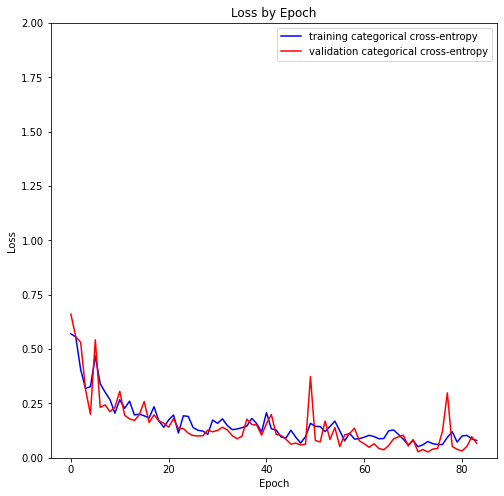

In [23]:
plt.figure(figsize=(8,8))
plt.plot(hist.history['loss'], label='training categorical cross-entropy', color='blue')
plt.plot(hist.history['val_loss'], label='validation categorical cross-entropy', color='red')
plt.title('Loss by Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.ylim([0.0, 2])
plt.legend(loc='upper right')

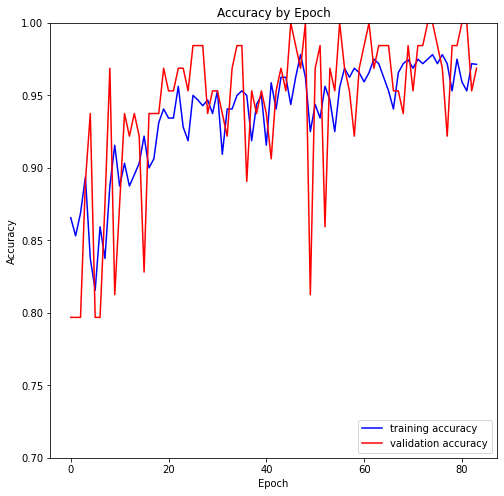

In [26]:
plt.figure(figsize=(8,8))
plt.plot(hist.history['accuracy'], label='training accuracy',color='blue')
plt.plot(hist.history['val_accuracy'], label = 'validation accuracy',color='red')
plt.title('Accuracy by Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.7, 1.])
plt.legend(loc='lower right')

### NMS algo was adapted from [HERE](https://pyimagesearch.com/2014/11/17/non-maximum-suppression-object-detection-python/)

In [53]:
def my_non_max_suppression(boxes, overlapThresh= .5):
    '''This image was taken from PyImageSearch... again cannot thank that guy enough'''
    # if there are no boxes, return an empty list
    if len(boxes) == 0:
        return []
    # if the bounding boxes integers, convert them to floats --
    # this is important since we'll be doing a bunch of divisions
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")
    # initialize the list of picked indexes	
    pick = []
    # grab the coordinates of the bounding boxes
    x1, y1, x2, y2 = boxes[:,0], boxes[:,1], boxes[:,2], boxes[:,3]    
    # compute the area of the bounding boxes and sort the bounding
    # boxes by the bottom-right y-coordinate of the bounding box
    area = (x2 - x1 + 1) * (y2 - y1 + 1)
    idxs = np.argsort(y2)
    # keep looping while some indexes still remain in the indexes
    # list
    while len(idxs) > 0:
        # grab the last index in the indexes list and add the
        # index value to the list of picked indexes
        last = len(idxs) - 1
        i = idxs[last]
        pick.append(i)
        # find the largest (x, y) coordinates for the start of
        # the bounding box and the smallest (x, y) coordinates
        # for the end of the bounding box
        xx1, yy1, xx2, yy2 = np.maximum(x1[i], x1[idxs[:last]]), np.maximum(y1[i], y1[idxs[:last]]), np.minimum(x2[i], x2[idxs[:last]]), np.minimum(y2[i], y2[idxs[:last]])
        # compute the width and height of the bounding box
        w, h = np.maximum(0, xx2 - xx1 + 1), np.maximum(0, yy2 - yy1 + 1)
        # compute the ratio of overlap
        overlap = (w * h) / area[idxs[:last]]
        # delete all indexes from the index list that have
        idxs = np.delete(idxs, np.concatenate(([last],
            np.where(overlap > overlapThresh)[0])))
    # return only the bounding boxes that were picked using the
    # integer data type
    return pick

# Run the cell below to load the model from pre-trained weights if it has not been trained.(Recommended)

In [9]:
model.load_weights('rcnn_Weights.h5') # Need to initialize the model above first

In [10]:
cv2.setUseOptimized(True)
cv2.setNumThreads(5) #change depending on your computer
ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()

# Perform object detection without doing post processing

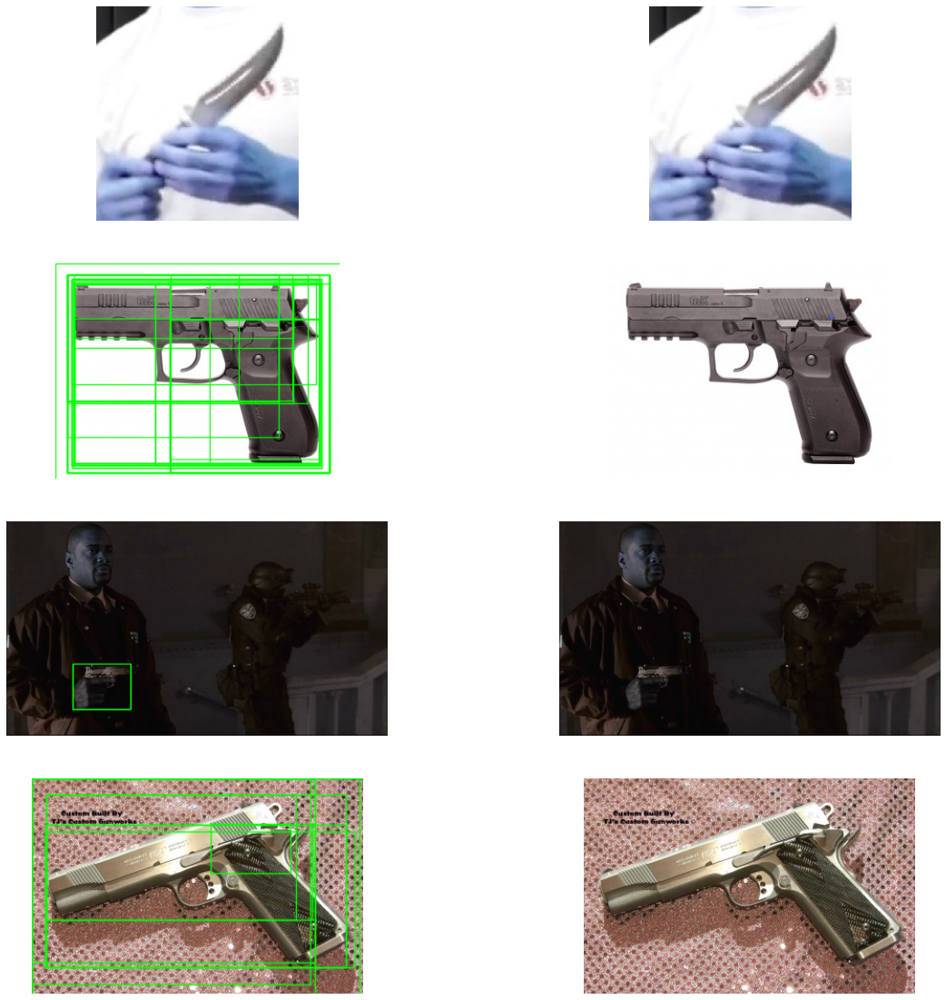

In [45]:
fig = plt.figure(figsize=(20,20))
fig_num = 1
rows = 4
cols = 2
#At this point this is the testing path
path ='C:\\Users\\bryan\\Desktop\\ML-FINAL\\data\\data with anno\\Sohas_weapon-Detection\\Test'
z=0
for e,i in enumerate(os.listdir(path)):
    z += 1
    img = cv2.imread(os.path.join(path,i))
    ss.setBaseImage(img)
    ss.switchToSelectiveSearchFast()
    ssresults = ss.process()
    imout = img.copy()
    imout2 = img.copy()
    for e,result in enumerate(ssresults):
        if e < 2000:
            x,y,w,h = result
            timage = imout[y:y+h,x:x+w]
            resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
            img = np.expand_dims(resized, axis=0)
            out= model.predict(img)
            if out[0][0] > 0.70:
                cv2.rectangle(imout, (x, y), (x+w, y+h), (0, 255, 0), 1, cv2.LINE_AA)
    fig.add_subplot(rows,cols, fig_num)
    plt.imshow(imout)
    plt.axis('off')
    fig.add_subplot(rows,cols, fig_num + 1)
    plt.imshow(imout2)
    plt.axis('off')
    
    fig_num += 2

# Perform object detections with non maximum supression algorithm for post-processing of bounding boxes (The implementation is based on pyimagesearch's explanation). You can find it [here]('https://pyimagesearch.com/2014/11/17/non-maximum-suppression-object-detection-python/')

pick: [0]
pick: [0, 52, 46, 45, 49, 9, 7, 37, 22, 12]
pick: [11]
pick: [39, 7]
pick: [19, 16, 3]
pick: [26, 12, 10, 22, 14]
pick: [79, 76, 78]
pick: [8, 13, 5]
pick: [0]
pick: [20, 3]


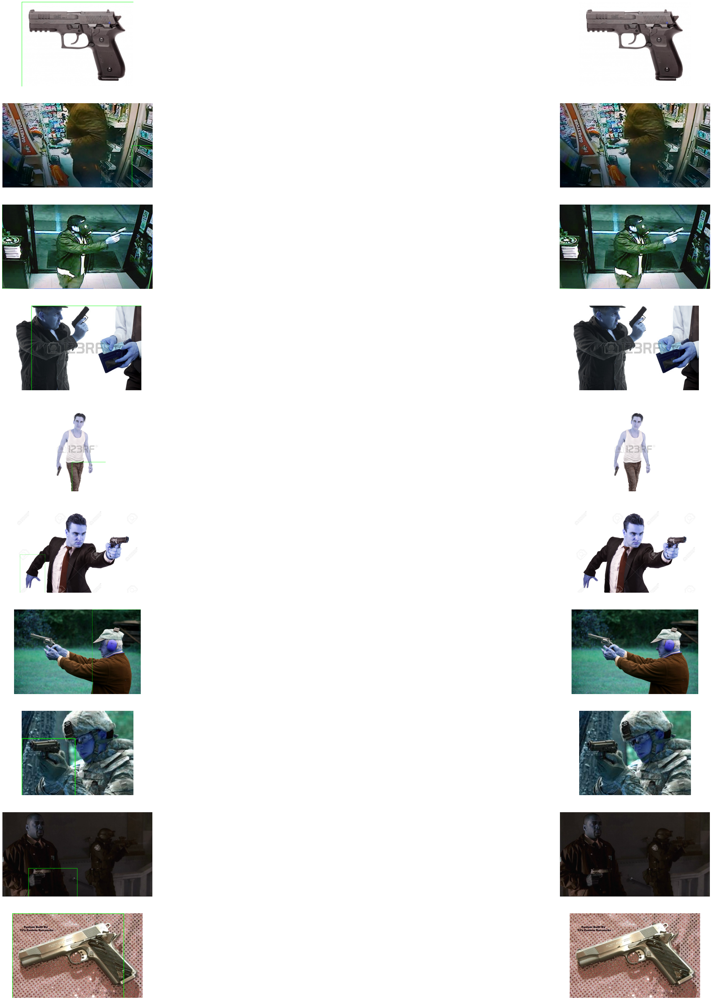

In [105]:
fig = plt.figure(figsize=(60,60))
fig_num = 1
rows = 10
cols = 2
flag = False # This flag is to check if a good region was found
#At this point this is the testing path
path ='C:\\Users\\bryan\\Desktop\\ML-FINAL\\data\\data with anno\\Sohas_weapon-Detection\\Test'
z=0
for e,i in enumerate(os.listdir(path)):
    locations = []
    scores = []
    flag = False
    z += 1
    img = cv2.imread(os.path.join(path,i))
    ss.setBaseImage(img)
    ss.switchToSelectiveSearchFast()
    ssresults = ss.process()
    imout = img.copy()
    imout2 = img.copy()
    for e,result in enumerate(ssresults):
        if e < 2000:
            x,y,w,h = result
            timage = imout[y:y+h,x:x+w]
            resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
            img = np.expand_dims(resized, axis=0)
            out= model.predict(img)
            if out[0][0] > 0.70:
                flag = True
                locations.append((x, y, x+w, y+h))
                
    if flag:
        locations = np.array(locations)
        pick = my_non_max_suppression(locations)
        print("pick:",pick)
        if len(pick) != 0:
            region = locations[pick[0]]
            cv2.rectangle(imout, (region[0], region[1]), (region[0]+region[2], region[1]+region[3]), (0, 255, 0), 1, cv2.LINE_AA)
        else:
            region = locations[0]
            cv2.rectangle(imout, (region[0], region[1]), (region[0]+region[2], region[1]+region[3]), (0, 255, 0), 1, cv2.LINE_AA)
        
        
    fig.add_subplot(rows,cols, fig_num)
    plt.imshow(imout)
    plt.axis('off')
    fig.add_subplot(rows,cols, fig_num + 1)
    plt.imshow(imout2)
    plt.axis('off')
    
    fig_num += 2

In [12]:
from tensorflow.image import non_max_suppression, non_max_suppression_overlaps

# Using tensor's flow non maximum supression implementation

tf.Tensor(
[[ 23  14 325 246]
 [ 20  20 294 145]
 [141  69 325 246]
 [ 25  67 245 149]], shape=(4, 4), dtype=int32)
tf.Tensor(
[[179  65 265 145]
 [215  12 270 102]
 [200 118 307 229]
 [  0   0 143 219]], shape=(4, 4), dtype=int32)
tf.Tensor(
[[ 279    0 1368  768]
 [ 292   75  962  323]
 [ 302  267 1079  762]
 [   0  294  170  377]], shape=(4, 4), dtype=int32)
tf.Tensor(
[[299  96 450 298]
 [120   0 274 240]
 [164   2 273 168]
 [ 24   0 188 192]], shape=(4, 4), dtype=int32)
tf.Tensor([[ 89 285 186 450]], shape=(1, 4), dtype=int32)
tf.Tensor(
[[ 925  287 1134  459]
 [ 977  286 1171  411]
 [ 949  280 1184  548]
 [ 926  285 1132  366]], shape=(4, 4), dtype=int32)
tf.Tensor(
[[575  75 880 296]
 [ 67 133 536 500]
 [548   0 880 418]
 [104 166 411 404]], shape=(4, 4), dtype=int32)
tf.Tensor(
[[  0  64 123 195]
 [  7  66  95 124]], shape=(2, 4), dtype=int32)
tf.Tensor(
[[  0   0 350 227]
 [134  21 300 198]
 [ 15  17 279 149]], shape=(3, 4), dtype=int32)


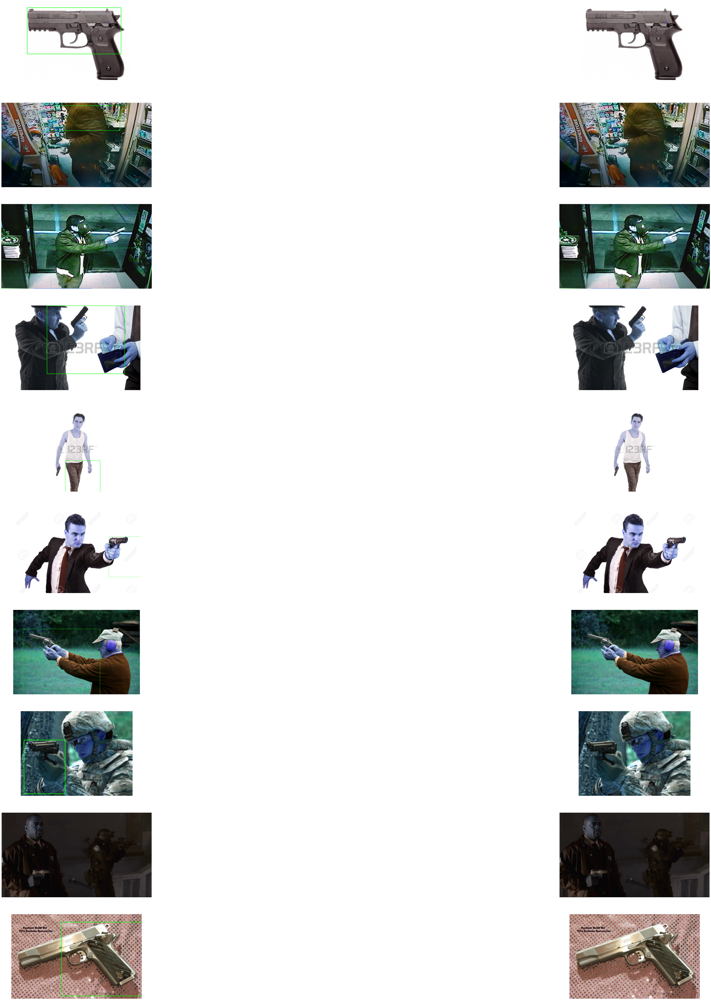

In [16]:
fig = plt.figure(figsize=(100,100))
fig_num = 1
rows = 10
cols = 2
flag = False # This flag is to check if a good region was found
#At this point this is the testing path
path ='C:\\Users\\bryan\\Desktop\\ML-FINAL\\data\\data with anno\\Sohas_weapon-Detection\\Test'
z=0
for e,i in enumerate(os.listdir(path)):
    locations = []
    scores = []
    flag = False
    z += 1
    img = cv2.imread(os.path.join(path,i))
    ss.setBaseImage(img)
    ss.switchToSelectiveSearchFast()
    ssresults = ss.process()
    imout = img.copy()
    imout2 = img.copy()
    for e,result in enumerate(ssresults):
        if e < 2000:
            x,y,w,h = result
            timage = imout[y:y+h,x:x+w]
            resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
            img = np.expand_dims(resized, axis=0)
            out= model.predict(img)
            if out[0][0] > 0.70:
                flag = True
                locations.append((x, y, x+w, y+h))
                scores.append(out)
                
    if flag:
        locations = np.array(locations)
        scores = np.array(scores)
        flat_scores = ([np.amax(i) for i in scores])
        locations = locations.astype("float")
        selected_indices = tf.image.non_max_suppression(
            locations, flat_scores, max_output_size=4)
        selected_boxes = tf.cast(tf.gather(locations, selected_indices), tf.int32)
        print(selected_boxes)
        if len(selected_boxes) != 0:
            if len(selected_boxes) > 1:
                region = selected_boxes[1].numpy() #originally a tensor object
                cv2.rectangle(imout, (region[0], region[1]), (region[0]+region[2], region[1]+region[3]), (0, 255, 0), 1, cv2.LINE_AA)
            else:
                region = selected_boxes[0].numpy() #originally a tensor object
                cv2.rectangle(imout, (region[0], region[1]), (region[0]+region[2], region[1]+region[3]), (0, 255, 0), 1, cv2.LINE_AA)
        else:
            region = locations[0]
            cv2.rectangle(imout, (region[0], region[1]), (region[0]+region[2], region[1]+region[3]), (0, 255, 0), 1, cv2.LINE_AA)
        
        
    fig.add_subplot(rows,cols, fig_num)
    plt.imshow(imout)
    plt.axis('off')
    fig.add_subplot(rows,cols, fig_num + 1)
    plt.imshow(imout2)
    plt.axis('off')
    fig_num += 2

# Using tensor flow and getting an average of all the good boxes return by nms algorithm

In [21]:
def get_average_box(boxes):
    if boxes.dtype.kind == "i":
        boxes = boxes.astype("float")
        
    average_x = 0
    average_y = 0
    average_width = 0
    average_height = 0
    
    count = 0
    
    for box in boxes:
        average_x += box[0]
        average_y += box[1]
        average_width += box[2]
        average_height += box[3]
        
        count += 1
        
    return np.array((average_x, average_y, average_width, average_height))/count
    

[ 52.25  42.5  297.25 196.5 ]
[146.5   54.75 245.   180.25]
[312.   197.75 866.   574.  ]
[151.75  24.5  296.25 224.5 ]
[ 89. 285. 186. 450.]
[ 949.25  286.75 1162.    455.5 ]
[323.5   93.5  676.75 404.5 ]
[  3.5  65.  109.  159.5]
[ 49.66666667  12.66666667 309.66666667 191.33333333]


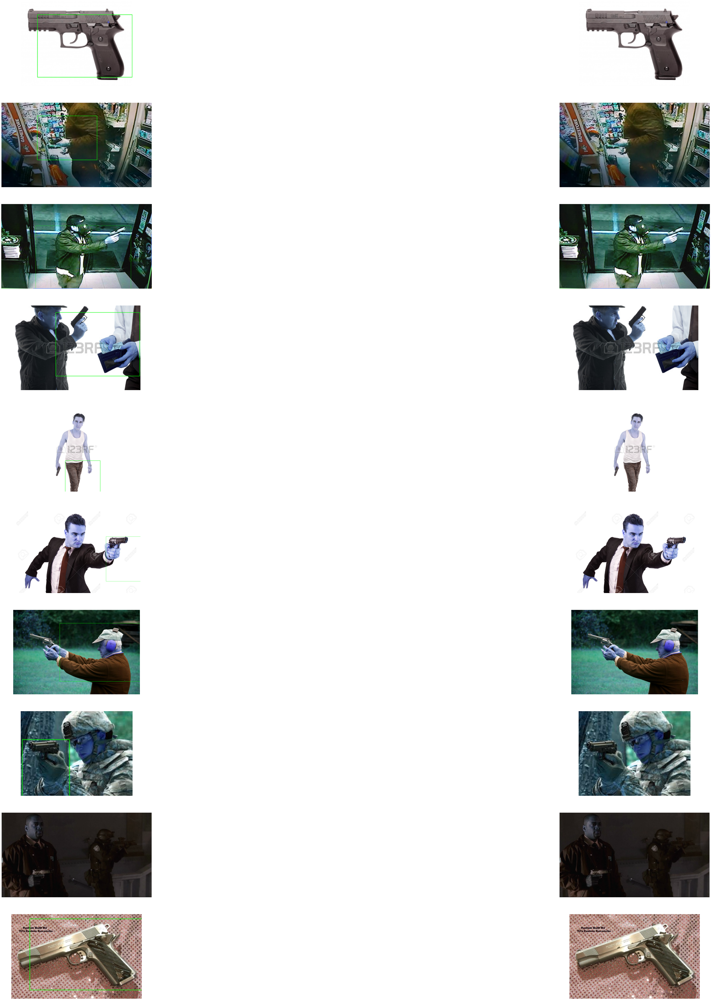

In [22]:
fig = plt.figure(figsize=(100,100))
fig_num = 1
rows = 10
cols = 2
flag = False # This flag is to check if a good region was found
#At this point this is the testing path
path ='C:\\Users\\bryan\\Desktop\\ML-FINAL\\data\\data with anno\\Sohas_weapon-Detection\\Test'
z=0
for e,i in enumerate(os.listdir(path)):
    locations = []
    scores = []
    flag = False
    z += 1
    img = cv2.imread(os.path.join(path,i))
    ss.setBaseImage(img)
    ss.switchToSelectiveSearchFast()
    ssresults = ss.process()
    imout = img.copy()
    imout2 = img.copy()
    for e,result in enumerate(ssresults):
        if e < 2000:
            x,y,w,h = result
            timage = imout[y:y+h,x:x+w]
            resized = cv2.resize(timage, (224,224), interpolation = cv2.INTER_AREA)
            img = np.expand_dims(resized, axis=0)
            out= model.predict(img)
            if out[0][0] > 0.70:
                flag = True
                locations.append((x, y, x+w, y+h))
                scores.append(out)
                
    if flag:
        locations = np.array(locations)
        scores = np.array(scores)
        flat_scores = ([np.amax(i) for i in scores])
        locations = locations.astype("float")
        selected_indices = tf.image.non_max_suppression(
            locations, flat_scores, max_output_size=4)
        selected_boxes = tf.cast(tf.gather(locations, selected_indices), tf.int32)
        selected_box = get_average_box(selected_boxes.numpy())
        print(selected_box)
        if len(selected_box) != 0:
            region = selected_box.astype("int32")
            cv2.rectangle(imout, (region[0], region[1]), (region[0]+region[2], region[1]+region[3]), (0, 255, 0), 1, cv2.LINE_AA)
        else:
            region = locations[0]
            cv2.rectangle(imout, (region[0], region[1]), (region[0]+region[2], region[1]+region[3]), (0, 255, 0), 1, cv2.LINE_AA)
        
        
    fig.add_subplot(rows,cols, fig_num)
    plt.imshow(imout)
    plt.axis('off')
    fig.add_subplot(rows,cols, fig_num + 1)
    plt.imshow(imout2)
    plt.axis('off')
    fig_num += 2